In [2]:
import os
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
import torch.optim as optim
from tqdm import tqdm
import random
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.backends.backend_pdf import PdfPages

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


# **CREAZIONE DATASET**

In [ ]:
class StrawberryDataset(Dataset):
    def __init__(self, image_dir, mask_dir, image_transform = None, mask_transform = None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_transform = image_transform
        self.mask_transform = mask_transform

        self.images = []
        self.masks = []

        for image in os.listdir(image_dir) :
            self.images.append(os.path.join(image_dir,image))
            self.masks.append(os.path.join(mask_dir,image))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = Image.open(self.images[idx]).convert("RGB")
        mask = Image.open(self.masks[idx]).convert("L")

        if self.image_transform:
            image = self.image_transform(image)

        if self.mask_transform:
            mask = self.mask_transform(mask)
            mask = (mask>0).float()

        return image, mask

In [7]:
#Trasformazioni per le immagini
image_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])


#Trasformazioni per le maschere
mask_transform = transforms.Compose([
    transforms.Resize((256,256), interpolation = transforms.InterpolationMode.NEAREST),
    transforms.ToTensor(),
])

# **RETE U_NET**






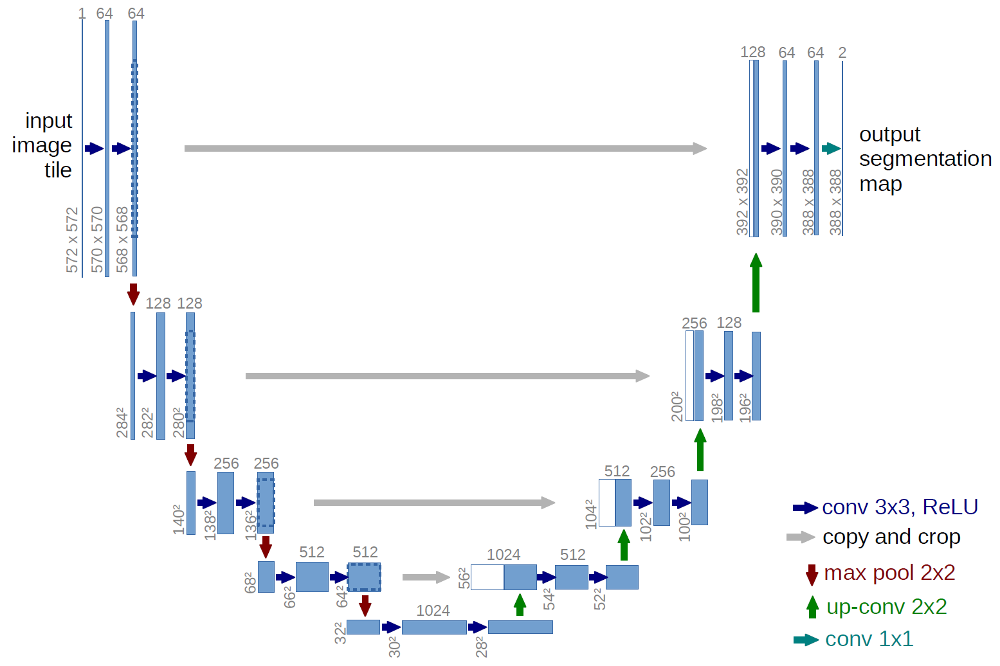

In [6]:
class UNet(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet, self).__init__()

        #Fase di encoder
        self.enc1 = self.double_conv(in_channels, 64)
        self.enc2 = self.double_conv(64, 128)
        self.enc3 = self.double_conv(128, 256)
        self.enc4 = self.double_conv(256, 512)

        #Dropout
        self.dropout = nn.Dropout(p=0.5)

        #Max Pooling
        self.pool = nn.MaxPool2d(2)

        #Bottleneck
        self.bottleneck = self.double_conv(512, 1024)

        #Fase di decoder
        self.upconv4 = self.upconv(1024, 512)
        self.upconv3 = self.upconv(512, 256)
        self.upconv2 = self.upconv(256, 128)
        self.upconv1 = self.upconv(128,64)

        self.dec4 = self.double_conv(1024, 512)
        self.dec3 = self.double_conv(512, 256)
        self.dec2 = self.double_conv(256, 128)
        self.dec1 = self.double_conv(128, 64)

        self.final_conv = nn.Conv2d(64, out_channels, kernel_size=1)

    def double_conv(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def upconv(self, in_channels, out_channels):
        return nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)


    def forward(self, x):
        #Fase di encoder
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool(enc1))
        enc3 = self.enc3(self.pool(enc2))
        enc4 = self.enc4(self.pool(enc3))

        #Bottleneck
        bottleneck = self.bottleneck(nn.MaxPool2d(2)(enc4))

        #Dropout
        bottleneck = self.dropout(bottleneck)

        #Fase di decoder
        upconv4 = self.upconv4(bottleneck)
        upconv4 = torch.cat([upconv4, enc4], dim=1)
        dec4 = self.dec4(upconv4)

        upconv3 = self.upconv3(dec4)
        upconv3 = torch.cat([upconv3, enc3], dim=1)
        dec3 = self.dec3(upconv3)

        upconv2 = self.upconv2(dec3)
        upconv2 = torch.cat([upconv2, enc2], dim=1)
        dec2 = self.dec2(upconv2)

        upconv1 = self.upconv1(dec2)
        upconv1 = torch.cat([upconv1, enc1], dim=1)
        dec1 = self.dec1(upconv1)

        return self.final_conv(dec1)

# **KAIMING INIT FUNCTION**

In [ ]:
def kaiming_init(model):
    for m in model.modules():
        if isinstance(m, nn.Conv2d):
            nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            if m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.ConvTranspose2d):
            nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            if m.bias is not None:
                nn.init.constant_(m.bias, 0)

# **DICE COEFFICIENT E INTERSECTION OVER UNION(IoU)**

In [14]:
def dice_coeff(preds, masks):
  preds = (torch.sigmoid(preds) > 0.5).float()
  intersection = (preds * masks).sum()
  union = preds.sum() + masks.sum()

  dice = (2.0 * intersection + 1e-8) / (union + 1e-8)
  return dice

def iou_coeff(preds, masks):
  preds = (torch.sigmoid(preds) > 0.5).float()
  intersection = (preds * masks).sum()
  union = preds.sum() + masks.sum() - intersection

  iou = (intersection + 1e-8) / (union + 1e-8)
  return iou

# **TRAINING E VALIDATION**

In [ ]:
def train_and_validate(model, train_loader, validation_loader, device, optimizer, criterion, epochs):
    train_losses = []
    val_losses = []
    train_dice = []
    val_dice = []
    train_iou = []
    val_iou = []

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        total_dice = 0.0
        total_iou = 0.0
        total = 0

        #Addestramento
        with tqdm(train_loader, desc=f"Epoch {epoch+1} Training", unit="batch") as tepoch:
          for images, masks in tepoch:

              images, masks = images.to(device), masks.to(device)

              optimizer.zero_grad()

              outputs = model(images)

              loss = criterion(outputs, masks)
              running_loss += loss.item() * images.size(0)
              loss.backward()
              torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0) #Prevengo l'esplosione dei gradienti

              optimizer.step()

              dice = dice_coeff(outputs, masks)
              total_dice += dice.item() * images.size(0)

              iou = iou_coeff(outputs, masks)
              total_iou += iou.item() * images.size(0)

              total += images.size(0)

              tepoch.write(f"Training Loss: {loss.item():.4f}")


        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_dice = total_dice / total
        epoch_iou = total_iou / total
        train_losses.append(epoch_loss)
        train_dice.append(epoch_dice)
        train_iou.append(epoch_iou)

        print('\n')
        #Validazione
        model.eval()
        running_loss = 0.0
        total_dice = 0.0
        total_iou = 0.0
        total = 0

        with torch.no_grad():
          with tqdm(validation_loader, desc=f"Epoch {epoch+1} Validation", unit="batch") as tepoch:
            for images, masks in tepoch:

                images, masks = images.to(device), masks.to(device)

                outputs = model(images)

                loss = criterion(outputs, masks)
                running_loss += loss.item() * images.size(0)

                dice = dice_coeff(outputs, masks)
                total_dice += dice.item() * images.size(0)

                iou = iou_coeff(outputs, masks)
                total_iou += iou.item() * images.size(0)

                total += images.size(0)

                tepoch.write(f"Validation Loss: {loss.item():.4f}")


        val_loss = running_loss / len(validation_loader.dataset)
        validation_dice = total_dice / total
        validation_iou = total_iou / total
        val_losses.append(val_loss)
        val_dice.append(validation_dice)
        val_iou.append(validation_iou)

        print(f'Epoch {epoch + 1}, Validation Loss: {val_loss:.4f}, Validation Dice: {validation_dice:.4f}, Validation IoU: {validation_iou:.4f}')
        print('\n')

    return train_losses, val_losses, train_dice, val_dice, train_iou, val_iou




# **HYPERPARAMETER TUNING**

In [ ]:
def random_hyperparameters():
    lr = random.choice([1e-2, 1e-3, 1e-4])
    batch_size = random.choice([16, 32, 64])
    weight_decay = random.choice([1e-3, 1e-4])

    return lr, batch_size, weight_decay

def hyperparameter_tuning(trainset, validationset, criterion, device, num_trials=10, num_epochs=5):
    best_loss = float('inf')
    best_params = None
    best_model_wts = None

    #File pdf per salvare i grafici
    pdf_filename = 'strawberry_hyperparameter_tuning.pdf'
    pdf_pages = PdfPages(pdf_filename)

    for trial in range(num_trials):
        lr, batch_size, weight_decay = random_hyperparameters()
        print(f'Trial {trial+1}/{num_trials} --> learning rate = {lr}, batch_size = {batch_size}, weight_decay = {weight_decay}')

        model = UNet(in_channels=3, out_channels=1).to(device)
        kaiming_init(model)
        optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

        train_loader = DataLoader(trainset, batch_size=batch_size, shuffle=True)
        validation_loader = DataLoader(validationset, batch_size=batch_size, shuffle=False)

        train_losses, val_losses, train_dice, val_dice, train_iou, val_iou = train_and_validate(model, train_loader, validation_loader, device, optimizer, criterion, num_epochs)

        bvloss = min(val_losses)
        if (bvloss < best_loss):
            best_loss = bvloss
            best_params = (lr, batch_size, weight_decay)
            best_model_wts = model.state_dict()

        #Rappresentazione grafica
        plt.figure(figsize=(18,12))

        plt.subplot(2, 2, 1)
        plt.plot(range(1, num_epochs+1), train_losses, label='Train Loss', color='red')
        plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title(f'Trial {trial + 1} - Loss (LR: {lr}, Batch: {batch_size}, Weight Decay: {weight_decay})')
        plt.legend()
        plt.grid(True)

        plt.subplot(2, 2, 2)
        plt.plot(range(1, num_epochs+1), train_dice, label='Train Dice', color='red')
        plt.plot(range(1, num_epochs+1), val_dice, label='Validation Dice', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('Dice Coefficient')
        plt.title(f'Trial {trial + 1} - Dice (LR: {lr}, Batch: {batch_size}, Weight Decay: {weight_decay})')
        plt.legend()
        plt.grid(True)

        plt.subplot(2, 2, 3)
        plt.plot(range(1, num_epochs+1), train_iou, label='Train IoU', color='red')
        plt.plot(range(1, num_epochs+1), val_iou, label='Validation IoU', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('IoU')
        plt.title(f'Trial {trial + 1} - IoU (LR: {lr}, Batch: {batch_size}, Weight Decay: {weight_decay})')
        plt.legend()
        plt.grid(True)

        plt.tight_layout()

        pdf_pages.savefig()

        plt.show()

        print('\n')

    pdf_pages.close()

    print(f'Best validation loss: {best_loss}')
    print(f'Best params: learning rate = {best_params[0]}, batch size = {best_params[1]}, weight_decay = {best_params[2]}')
    torch.save(best_model_wts, 'best_model_strawberry.pth')

    return best_params

# **FAILURE ANALYSIS**

In [37]:
def show_predictions(images, masks, predictions, num_images=5, title=None):
    def overlay(image, mask):
        image = image.permute(1, 2, 0).cpu().numpy()
        mask = mask.squeeze().cpu().numpy()

        color = np.zeros_like(image)
        color[mask > 0] = [0, 255, 255]

        return np.clip(image * 0.5 + color * 0.5, 0, 1)


    fig, axes = plt.subplots(nrows=num_images, ncols=3, figsize=(15, num_images*5))

    if title:
        fig.suptitle(title, fontsize=16, y=0.95)

    for i in range(num_images):
        ax = axes[i]
        image = images[i]
        mask = masks[i]
        prediction = predictions[i]

        ax[0].imshow(image.permute(1, 2, 0).cpu().numpy())
        ax[0].set_title("Image")
        ax[0].axis('off')

        image_mask = overlay(image, mask)
        ax[1].imshow(image_mask)
        ax[1].set_title("Image + Mask")
        ax[1].axis('off')

        image_prediction = overlay(image, prediction)
        ax[2].imshow(image_prediction)
        ax[2].set_title("Image + Prediction")
        ax[2].axis('off')

    plt.tight_layout()
    plt.show()


def failure_analysis(model, criterion, testset, best_params, device):
    print('TESTING...')
    model.eval()
    test_loss = 0.0
    total_dice = 0.0
    total_iou = 0.0
    total = 0
    images_list = []
    masks_list = []
    preds_list = []

    test_loader = DataLoader(testset, batch_size=best_params[1], shuffle=False)

    with torch.no_grad():
        for images, masks in test_loader:
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)
            test_loss += loss.item() * images.size(0)

            dice = dice_coeff(outputs, masks)
            total_dice += dice.item() * images.size(0)

            iou = iou_coeff(outputs, masks)
            total_iou += iou.item() * images.size(0)

            total += images.size(0)

            images_list.extend(images)
            masks_list.extend(masks)
            preds_list.extend(outputs)

    test_loss /= len(test_loader.dataset)
    test_dice = total_dice / total
    test_iou = total_iou / total

    print(f"Final test loss: {test_loss}, Final test Dice: {test_dice:.4f}, Final test IoU: {test_iou:.4f}")

    errors_index = []
    correct_index = []
    for i in range(len(images_list)):
        dice = dice_coeff(preds_list[i], masks_list[i])
        if dice < 0.5:
            errors_index.append(i)
        elif dice > 0.80:
            correct_index.append(i)

    if correct_index:
        print('ALCUNE PREDIZIONI CORRETTE \n')
        show_predictions(
            [images_list[i] for i in correct_index[:5]],
            [masks_list[i] for i in correct_index[:5]],
            [preds_list[i] for i in correct_index[:5]],
        )

    if errors_index:
        print('ALCUNE PREDIZIONI ERRATE \n')
        show_predictions(
            [images_list[i] for i in errors_index[:5]],
            [masks_list[i] for i in errors_index[:5]],
            [preds_list[i] for i in errors_index[:5]],
        )



# **MAIN**

In [ ]:
image_dir = '/content/drive/MyDrive/StrawberryDataset/images'
mask_dir = '/content/drive/MyDrive/StrawberryDataset/masks'

# Creazione dataset
dataset = StrawberryDataset(image_dir=image_dir, mask_dir=mask_dir, image_transform=image_transform, mask_transform=mask_transform)

# Creazione trainset (70%), validationset (20%) e trainset (10%)
train_size = int(0.7 * len(dataset))
validation_size = int(0.2 * len(dataset))
test_size = len(dataset) - train_size - validation_size

trainset, validationset, testset = random_split(dataset, [train_size, validation_size, test_size])

criterion = nn.BCEWithLogitsLoss()

Trial 1/10 --> learning rate = 0.001, batch_size = 64, weight_decay = 0.0001


Epoch 1 Training:  12%|█▎        | 1/8 [01:24<09:49, 84.14s/batch]

Training Loss: 1.7734


Epoch 1 Training:  25%|██▌       | 2/8 [02:33<07:32, 75.37s/batch]

Training Loss: 0.7345


Epoch 1 Training:  38%|███▊      | 3/8 [03:40<05:57, 71.56s/batch]

Training Loss: 0.3500


Epoch 1 Training:  50%|█████     | 4/8 [04:41<04:30, 67.61s/batch]

Training Loss: 0.2837


Epoch 1 Training:  62%|██████▎   | 5/8 [05:46<03:19, 66.54s/batch]

Training Loss: 0.2398


Epoch 1 Training:  75%|███████▌  | 6/8 [06:54<02:13, 66.91s/batch]

Training Loss: 0.2117


Epoch 1 Training:  88%|████████▊ | 7/8 [07:59<01:06, 66.44s/batch]

Training Loss: 0.1693


Epoch 1 Training: 100%|██████████| 8/8 [09:00<00:00, 67.54s/batch]


Training Loss: 0.1285




Epoch 1 Validation:  33%|███▎      | 1/3 [01:09<02:18, 69.29s/batch]

Validation Loss: 0.1083


Epoch 1 Validation:  67%|██████▋   | 2/3 [02:13<01:06, 66.35s/batch]

Validation Loss: 0.1144


Epoch 1 Validation: 100%|██████████| 3/3 [02:33<00:00, 51.06s/batch]


Validation Loss: 0.1179
Epoch 1, Validation Loss: 0.1121, Validation Dice: 0.6778, Validation IoU: 0.5128




Epoch 2 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.69s/batch]

Training Loss: 0.1130


Epoch 2 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.67s/batch]

Training Loss: 0.0861


Epoch 2 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.68s/batch]

Training Loss: 0.0853


Epoch 2 Training:  50%|█████     | 4/8 [00:14<00:14,  3.68s/batch]

Training Loss: 0.0806


Epoch 2 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.70s/batch]

Training Loss: 0.0652


Epoch 2 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.70s/batch]

Training Loss: 0.0729


Epoch 2 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.69s/batch]

Training Loss: 0.0590


Epoch 2 Training: 100%|██████████| 8/8 [00:29<00:00,  3.67s/batch]


Training Loss: 0.0560




Epoch 2 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.64s/batch]

Validation Loss: 0.0632


Epoch 2 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.63s/batch]

Validation Loss: 0.0657


Epoch 2 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.98s/batch]


Validation Loss: 0.0594
Epoch 2, Validation Loss: 0.0638, Validation Dice: 0.8074, Validation IoU: 0.6771




Epoch 3 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.71s/batch]

Training Loss: 0.0649


Epoch 3 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.68s/batch]

Training Loss: 0.0831


Epoch 3 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.68s/batch]

Training Loss: 0.0503


Epoch 3 Training:  50%|█████     | 4/8 [00:14<00:14,  3.65s/batch]

Training Loss: 0.0792


Epoch 3 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.64s/batch]

Training Loss: 0.0508


Epoch 3 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.66s/batch]

Training Loss: 0.0799


Epoch 3 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.66s/batch]

Training Loss: 0.0656


Epoch 3 Training: 100%|██████████| 8/8 [00:29<00:00,  3.64s/batch]


Training Loss: 0.0510




Epoch 3 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.61s/batch]

Validation Loss: 0.0561


Epoch 3 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.63s/batch]

Validation Loss: 0.0580


Epoch 3 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.99s/batch]


Validation Loss: 0.0563
Epoch 3, Validation Loss: 0.0569, Validation Dice: 0.8052, Validation IoU: 0.6740




Epoch 4 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.63s/batch]

Training Loss: 0.0571


Epoch 4 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.63s/batch]

Training Loss: 0.0545


Epoch 4 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.66s/batch]

Training Loss: 0.0557


Epoch 4 Training:  50%|█████     | 4/8 [00:14<00:14,  3.64s/batch]

Training Loss: 0.0527


Epoch 4 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.64s/batch]

Training Loss: 0.0433


Epoch 4 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.66s/batch]

Training Loss: 0.0560


Epoch 4 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.65s/batch]

Training Loss: 0.0529


Epoch 4 Training: 100%|██████████| 8/8 [00:29<00:00,  3.63s/batch]


Training Loss: 0.0422




Epoch 4 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.59s/batch]

Validation Loss: 0.0483


Epoch 4 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.62s/batch]

Validation Loss: 0.0490


Epoch 4 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.98s/batch]


Validation Loss: 0.0486
Epoch 4, Validation Loss: 0.0486, Validation Dice: 0.8368, Validation IoU: 0.7195




Epoch 5 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.64s/batch]

Training Loss: 0.0454


Epoch 5 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.67s/batch]

Training Loss: 0.0507


Epoch 5 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.66s/batch]

Training Loss: 0.0423


Epoch 5 Training:  50%|█████     | 4/8 [00:14<00:14,  3.67s/batch]

Training Loss: 0.0474


Epoch 5 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.66s/batch]

Training Loss: 0.0413


Epoch 5 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.67s/batch]

Training Loss: 0.0465


Epoch 5 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.68s/batch]

Training Loss: 0.0361


Epoch 5 Training: 100%|██████████| 8/8 [00:29<00:00,  3.64s/batch]


Training Loss: 0.0404




Epoch 5 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.62s/batch]

Validation Loss: 0.0439


Epoch 5 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.62s/batch]

Validation Loss: 0.0450


Epoch 5 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.99s/batch]


Validation Loss: 0.0488
Epoch 5, Validation Loss: 0.0450, Validation Dice: 0.8276, Validation IoU: 0.7060




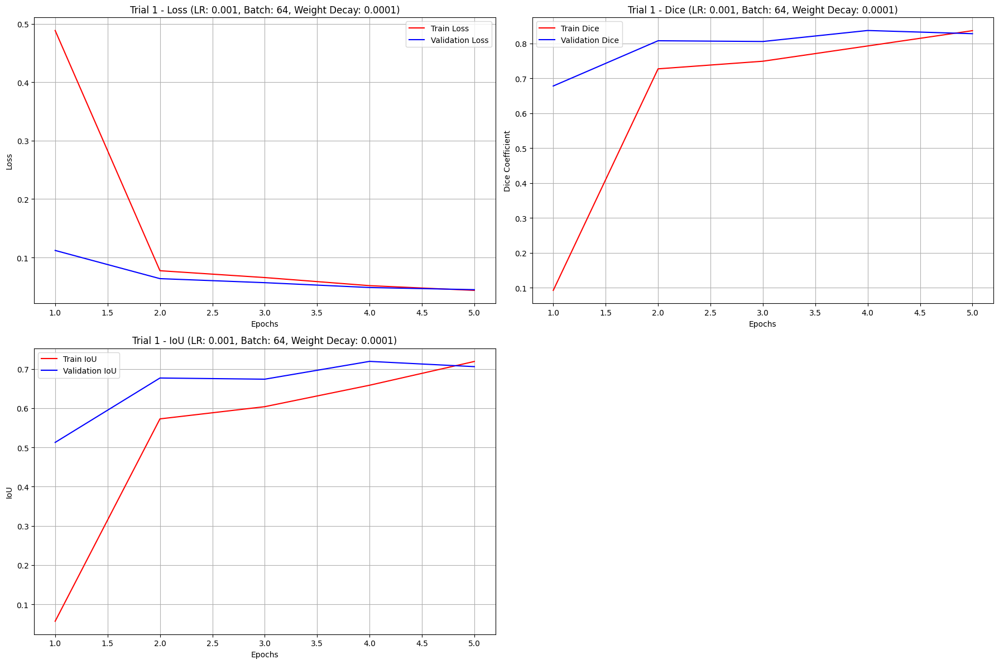



Trial 2/10 --> learning rate = 0.01, batch_size = 64, weight_decay = 0.001


Epoch 1 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.69s/batch]

Training Loss: 1.5136


Epoch 1 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.65s/batch]

Training Loss: 25629.3125


Epoch 1 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.64s/batch]

Training Loss: 30.1948


Epoch 1 Training:  50%|█████     | 4/8 [00:14<00:14,  3.64s/batch]

Training Loss: 268.5829


Epoch 1 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.64s/batch]

Training Loss: 199.0144


Epoch 1 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.67s/batch]

Training Loss: 265.8169


Epoch 1 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.70s/batch]

Training Loss: 32636.3750


Epoch 1 Training: 100%|██████████| 8/8 [00:29<00:00,  3.64s/batch]


Training Loss: 164.9809




Epoch 1 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.60s/batch]

Validation Loss: 105162.6953


Epoch 1 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.60s/batch]

Validation Loss: 114855.5000


Epoch 1 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.98s/batch]


Validation Loss: 105741.8203
Epoch 1, Validation Loss: 109508.7962, Validation Dice: 0.0001, Validation IoU: 0.0000




Epoch 2 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.61s/batch]

Training Loss: 99960.4531


Epoch 2 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.63s/batch]

Training Loss: 1.3362


Epoch 2 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.64s/batch]

Training Loss: 75914.8438


Epoch 2 Training:  50%|█████     | 4/8 [00:14<00:14,  3.64s/batch]

Training Loss: 161.9370


Epoch 2 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.63s/batch]

Training Loss: 4.1903


Epoch 2 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.62s/batch]

Training Loss: 53540.9180


Epoch 2 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.62s/batch]

Training Loss: 19.2526


Epoch 2 Training: 100%|██████████| 8/8 [00:28<00:00,  3.60s/batch]


Training Loss: 0.3942




Epoch 2 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.58s/batch]

Validation Loss: 0.2373


Epoch 2 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.59s/batch]

Validation Loss: 0.2486


Epoch 2 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.96s/batch]


Validation Loss: 0.2389
Epoch 2, Validation Loss: 0.2425, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 3 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.62s/batch]

Training Loss: 0.2355


Epoch 3 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.62s/batch]

Training Loss: 0.3342


Epoch 3 Training:  38%|███▊      | 3/8 [00:10<00:17,  3.59s/batch]

Training Loss: 0.2124


Epoch 3 Training:  50%|█████     | 4/8 [00:14<00:14,  3.61s/batch]

Training Loss: 0.3306


Epoch 3 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.61s/batch]

Training Loss: 0.2484


Epoch 3 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.61s/batch]

Training Loss: 22366.8086


Epoch 3 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.63s/batch]

Training Loss: 27621.7988


Epoch 3 Training: 100%|██████████| 8/8 [00:28<00:00,  3.60s/batch]


Training Loss: 120617.3828




Epoch 3 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.62s/batch]

Validation Loss: 9568.7246


Epoch 3 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.62s/batch]

Validation Loss: 10429.2441


Epoch 3 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.99s/batch]


Validation Loss: 9650.6963
Epoch 3, Validation Loss: 9958.1506, Validation Dice: 0.0909, Validation IoU: 0.0476




Epoch 4 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.65s/batch]

Training Loss: 9578.5234


Epoch 4 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.67s/batch]

Training Loss: 1776.7817


Epoch 4 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.65s/batch]

Training Loss: 31550.9570


Epoch 4 Training:  50%|█████     | 4/8 [00:14<00:14,  3.66s/batch]

Training Loss: 4045.3699


Epoch 4 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.66s/batch]

Training Loss: 7.0953


Epoch 4 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.65s/batch]

Training Loss: 23347.0352


Epoch 4 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.65s/batch]

Training Loss: 698.1937


Epoch 4 Training: 100%|██████████| 8/8 [00:29<00:00,  3.63s/batch]


Training Loss: 7481.6426




Epoch 4 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.62s/batch]

Validation Loss: 99403.9844


Epoch 4 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.62s/batch]

Validation Loss: 109009.2891


Epoch 4 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.98s/batch]


Validation Loss: 100353.3594
Epoch 4, Validation Loss: 103754.8732, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 5 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.67s/batch]

Training Loss: 88275.2734


Epoch 5 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.71s/batch]

Training Loss: 21260.9688


Epoch 5 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.69s/batch]

Training Loss: 5250404.5000


Epoch 5 Training:  50%|█████     | 4/8 [00:14<00:14,  3.70s/batch]

Training Loss: 17320348.0000


Epoch 5 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.69s/batch]

Training Loss: 8799866.0000


Epoch 5 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.66s/batch]

Training Loss: 104784.8281


Epoch 5 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.65s/batch]

Training Loss: 4024.0356


Epoch 5 Training: 100%|██████████| 8/8 [00:29<00:00,  3.64s/batch]


Training Loss: 68020.7266




Epoch 5 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.66s/batch]

Validation Loss: 313.4426


Epoch 5 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.65s/batch]

Validation Loss: 343.4709


Epoch 5 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.02s/batch]


Validation Loss: 315.7088
Epoch 5, Validation Loss: 326.9621, Validation Dice: 0.0000, Validation IoU: 0.0000




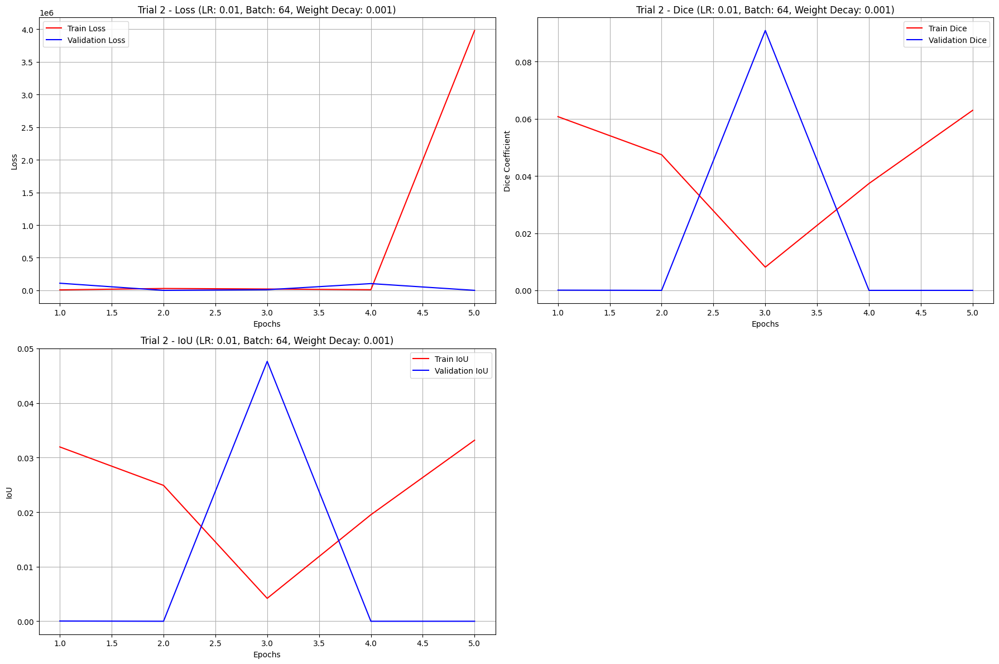



Trial 3/10 --> learning rate = 0.001, batch_size = 16, weight_decay = 0.001


Epoch 1 Training:   3%|▎         | 1/32 [00:00<00:29,  1.06batch/s]

Training Loss: 1.3532


Epoch 1 Training:   6%|▋         | 2/32 [00:01<00:28,  1.07batch/s]

Training Loss: 0.2945


Epoch 1 Training:   9%|▉         | 3/32 [00:02<00:27,  1.06batch/s]

Training Loss: 0.5178


Epoch 1 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.07batch/s]

Training Loss: 0.2623


Epoch 1 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.05batch/s]

Training Loss: 0.2661


Epoch 1 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.06batch/s]

Training Loss: 0.2409


Epoch 1 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.05batch/s]

Training Loss: 0.1714


Epoch 1 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.06batch/s]

Training Loss: 0.1838


Epoch 1 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.06batch/s]

Training Loss: 0.1566


Epoch 1 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.06batch/s]

Training Loss: 0.1239


Epoch 1 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.07batch/s]

Training Loss: 0.1070


Epoch 1 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.06batch/s]

Training Loss: 0.0906


Epoch 1 Training:  41%|████      | 13/32 [00:12<00:17,  1.06batch/s]

Training Loss: 0.0697


Epoch 1 Training:  44%|████▍     | 14/32 [00:13<00:17,  1.06batch/s]

Training Loss: 0.0751


Epoch 1 Training:  47%|████▋     | 15/32 [00:14<00:15,  1.06batch/s]

Training Loss: 0.0708


Epoch 1 Training:  50%|█████     | 16/32 [00:15<00:15,  1.06batch/s]

Training Loss: 0.0522


Epoch 1 Training:  53%|█████▎    | 17/32 [00:16<00:14,  1.06batch/s]

Training Loss: 0.0792


Epoch 1 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.06batch/s]

Training Loss: 0.0559


Epoch 1 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.07batch/s]

Training Loss: 0.0613


Epoch 1 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0606


Epoch 1 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0482


Epoch 1 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.0507


Epoch 1 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.06batch/s]

Training Loss: 0.0468


Epoch 1 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.06batch/s]

Training Loss: 0.0495


Epoch 1 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.06batch/s]

Training Loss: 0.0679


Epoch 1 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.06batch/s]

Training Loss: 0.0596


Epoch 1 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.07batch/s]

Training Loss: 0.0707


Epoch 1 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.07batch/s]

Training Loss: 0.0640


Epoch 1 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.05batch/s]

Training Loss: 0.0510


Epoch 1 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.05batch/s]

Training Loss: 0.0689


Epoch 1 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.05batch/s]

Training Loss: 0.0461


Epoch 1 Training: 100%|██████████| 32/32 [00:29<00:00,  1.07batch/s]


Training Loss: 0.0474




Epoch 1 Validation:  10%|█         | 1/10 [00:00<00:05,  1.51batch/s]

Validation Loss: 0.0695


Epoch 1 Validation:  20%|██        | 2/10 [00:01<00:05,  1.50batch/s]

Validation Loss: 0.0424


Epoch 1 Validation:  30%|███       | 3/10 [00:01<00:04,  1.51batch/s]

Validation Loss: 0.0611


Epoch 1 Validation:  40%|████      | 4/10 [00:02<00:04,  1.50batch/s]

Validation Loss: 0.0514


Epoch 1 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0477


Epoch 1 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0614


Epoch 1 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.50batch/s]

Validation Loss: 0.0568


Epoch 1 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0606


Epoch 1 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.63batch/s]


Validation Loss: 0.0586
Validation Loss: 0.0392
Epoch 1, Validation Loss: 0.0565, Validation Dice: 0.7869, Validation IoU: 0.6497




Epoch 2 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0601


Epoch 2 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0500


Epoch 2 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0552


Epoch 2 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.07batch/s]

Training Loss: 0.0455


Epoch 2 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.07batch/s]

Training Loss: 0.0432


Epoch 2 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.06batch/s]

Training Loss: 0.0472


Epoch 2 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.07batch/s]

Training Loss: 0.0347


Epoch 2 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.06batch/s]

Training Loss: 0.0811


Epoch 2 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.07batch/s]

Training Loss: 0.0475


Epoch 2 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.07batch/s]

Training Loss: 0.0437


Epoch 2 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.07batch/s]

Training Loss: 0.0523


Epoch 2 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.07batch/s]

Training Loss: 0.0450


Epoch 2 Training:  41%|████      | 13/32 [00:12<00:17,  1.07batch/s]

Training Loss: 0.0430


Epoch 2 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.08batch/s]

Training Loss: 0.0475


Epoch 2 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.0372


Epoch 2 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0488


Epoch 2 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0436


Epoch 2 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0626


Epoch 2 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0419


Epoch 2 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0438


Epoch 2 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0595


Epoch 2 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0485


Epoch 2 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0670


Epoch 2 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0643


Epoch 2 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0380


Epoch 2 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.08batch/s]

Training Loss: 0.0718


Epoch 2 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.08batch/s]

Training Loss: 0.0866


Epoch 2 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.08batch/s]

Training Loss: 0.0692


Epoch 2 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0379


Epoch 2 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0591


Epoch 2 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0658


Epoch 2 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0443




Epoch 2 Validation:  10%|█         | 1/10 [00:00<00:05,  1.53batch/s]

Validation Loss: 0.0527


Epoch 2 Validation:  20%|██        | 2/10 [00:01<00:05,  1.50batch/s]

Validation Loss: 0.0372


Epoch 2 Validation:  30%|███       | 3/10 [00:01<00:04,  1.50batch/s]

Validation Loss: 0.0551


Epoch 2 Validation:  40%|████      | 4/10 [00:02<00:03,  1.52batch/s]

Validation Loss: 0.0437


Epoch 2 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.51batch/s]

Validation Loss: 0.0406


Epoch 2 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.52batch/s]

Validation Loss: 0.0501


Epoch 2 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.0514


Epoch 2 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.52batch/s]

Validation Loss: 0.0511


Epoch 2 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0492
Validation Loss: 0.0402
Epoch 2, Validation Loss: 0.0478, Validation Dice: 0.8365, Validation IoU: 0.7195




Epoch 3 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0437


Epoch 3 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0468


Epoch 3 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0613


Epoch 3 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.0400


Epoch 3 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.08batch/s]

Training Loss: 0.0409


Epoch 3 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.08batch/s]

Training Loss: 0.0481


Epoch 3 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0407


Epoch 3 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0411


Epoch 3 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.07batch/s]

Training Loss: 0.0709


Epoch 3 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0544


Epoch 3 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0388


Epoch 3 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0587


Epoch 3 Training:  41%|████      | 13/32 [00:12<00:17,  1.08batch/s]

Training Loss: 0.0600


Epoch 3 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.08batch/s]

Training Loss: 0.0492


Epoch 3 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.0483


Epoch 3 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0579


Epoch 3 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0449


Epoch 3 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0430


Epoch 3 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0400


Epoch 3 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0503


Epoch 3 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0466


Epoch 3 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.0395


Epoch 3 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.06batch/s]

Training Loss: 0.0362


Epoch 3 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.07batch/s]

Training Loss: 0.0407


Epoch 3 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.07batch/s]

Training Loss: 0.0327


Epoch 3 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.07batch/s]

Training Loss: 0.0497


Epoch 3 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.07batch/s]

Training Loss: 0.0349


Epoch 3 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.07batch/s]

Training Loss: 0.0414


Epoch 3 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.07batch/s]

Training Loss: 0.0401


Epoch 3 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.07batch/s]

Training Loss: 0.0319


Epoch 3 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.07batch/s]

Training Loss: 0.0383


Epoch 3 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0436




Epoch 3 Validation:  10%|█         | 1/10 [00:00<00:05,  1.51batch/s]

Validation Loss: 0.0477


Epoch 3 Validation:  20%|██        | 2/10 [00:01<00:05,  1.50batch/s]

Validation Loss: 0.0325


Epoch 3 Validation:  30%|███       | 3/10 [00:01<00:04,  1.51batch/s]

Validation Loss: 0.0391


Epoch 3 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0350


Epoch 3 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0300


Epoch 3 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.50batch/s]

Validation Loss: 0.0420


Epoch 3 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.0414


Epoch 3 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.50batch/s]

Validation Loss: 0.0435


Epoch 3 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0426
Validation Loss: 0.0286
Epoch 3, Validation Loss: 0.0393, Validation Dice: 0.8565, Validation IoU: 0.7496




Epoch 4 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0327


Epoch 4 Training:   6%|▋         | 2/32 [00:01<00:28,  1.06batch/s]

Training Loss: 0.0561


Epoch 4 Training:   9%|▉         | 3/32 [00:02<00:27,  1.07batch/s]

Training Loss: 0.0373


Epoch 4 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.07batch/s]

Training Loss: 0.0424


Epoch 4 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.07batch/s]

Training Loss: 0.0393


Epoch 4 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.07batch/s]

Training Loss: 0.0335


Epoch 4 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.07batch/s]

Training Loss: 0.0345


Epoch 4 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.06batch/s]

Training Loss: 0.0330


Epoch 4 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.06batch/s]

Training Loss: 0.0292


Epoch 4 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.06batch/s]

Training Loss: 0.0380


Epoch 4 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.07batch/s]

Training Loss: 0.0365


Epoch 4 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.07batch/s]

Training Loss: 0.0437


Epoch 4 Training:  41%|████      | 13/32 [00:12<00:17,  1.07batch/s]

Training Loss: 0.0449


Epoch 4 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.07batch/s]

Training Loss: 0.0395


Epoch 4 Training:  47%|████▋     | 15/32 [00:14<00:15,  1.07batch/s]

Training Loss: 0.0396


Epoch 4 Training:  50%|█████     | 16/32 [00:14<00:14,  1.07batch/s]

Training Loss: 0.0301


Epoch 4 Training:  53%|█████▎    | 17/32 [00:15<00:14,  1.07batch/s]

Training Loss: 0.0287


Epoch 4 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.08batch/s]

Training Loss: 0.0422


Epoch 4 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.07batch/s]

Training Loss: 0.0589


Epoch 4 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0471


Epoch 4 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0441


Epoch 4 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.0360


Epoch 4 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.07batch/s]

Training Loss: 0.0379


Epoch 4 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.07batch/s]

Training Loss: 0.0381


Epoch 4 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.07batch/s]

Training Loss: 0.0383


Epoch 4 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.07batch/s]

Training Loss: 0.0337


Epoch 4 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.08batch/s]

Training Loss: 0.0366


Epoch 4 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.08batch/s]

Training Loss: 0.0449


Epoch 4 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.08batch/s]

Training Loss: 0.0431


Epoch 4 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.08batch/s]

Training Loss: 0.0427


Epoch 4 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0326


Epoch 4 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0292




Epoch 4 Validation:  10%|█         | 1/10 [00:00<00:05,  1.56batch/s]

Validation Loss: 0.0433


Epoch 4 Validation:  20%|██        | 2/10 [00:01<00:05,  1.54batch/s]

Validation Loss: 0.0304


Epoch 4 Validation:  30%|███       | 3/10 [00:01<00:04,  1.51batch/s]

Validation Loss: 0.0327


Epoch 4 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0324


Epoch 4 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0254


Epoch 4 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0377


Epoch 4 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0382


Epoch 4 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.51batch/s]

Validation Loss: 0.0392


Epoch 4 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0393
Validation Loss: 0.0260
Epoch 4, Validation Loss: 0.0354, Validation Dice: 0.8711, Validation IoU: 0.7723




Epoch 5 Training:   3%|▎         | 1/32 [00:00<00:28,  1.09batch/s]

Training Loss: 0.0324


Epoch 5 Training:   6%|▋         | 2/32 [00:01<00:27,  1.07batch/s]

Training Loss: 0.0383


Epoch 5 Training:   9%|▉         | 3/32 [00:02<00:27,  1.07batch/s]

Training Loss: 0.0350


Epoch 5 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.08batch/s]

Training Loss: 0.0362


Epoch 5 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.07batch/s]

Training Loss: 0.0315


Epoch 5 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.08batch/s]

Training Loss: 0.0314


Epoch 5 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0386


Epoch 5 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0356


Epoch 5 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.07batch/s]

Training Loss: 0.0360


Epoch 5 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.07batch/s]

Training Loss: 0.0305


Epoch 5 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.07batch/s]

Training Loss: 0.0337


Epoch 5 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.07batch/s]

Training Loss: 0.0266


Epoch 5 Training:  41%|████      | 13/32 [00:12<00:17,  1.07batch/s]

Training Loss: 0.0312


Epoch 5 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.07batch/s]

Training Loss: 0.0285


Epoch 5 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.07batch/s]

Training Loss: 0.0316


Epoch 5 Training:  50%|█████     | 16/32 [00:14<00:14,  1.07batch/s]

Training Loss: 0.0274


Epoch 5 Training:  53%|█████▎    | 17/32 [00:15<00:14,  1.07batch/s]

Training Loss: 0.0362


Epoch 5 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.07batch/s]

Training Loss: 0.0313


Epoch 5 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.07batch/s]

Training Loss: 0.0249


Epoch 5 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0395


Epoch 5 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0359


Epoch 5 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.0455


Epoch 5 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.07batch/s]

Training Loss: 0.0387


Epoch 5 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.07batch/s]

Training Loss: 0.0262


Epoch 5 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0432


Epoch 5 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.08batch/s]

Training Loss: 0.0643


Epoch 5 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.08batch/s]

Training Loss: 0.0397


Epoch 5 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.08batch/s]

Training Loss: 0.0321


Epoch 5 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.08batch/s]

Training Loss: 0.0291


Epoch 5 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0347


Epoch 5 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0291


Epoch 5 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0375




Epoch 5 Validation:  10%|█         | 1/10 [00:00<00:06,  1.49batch/s]

Validation Loss: 0.0371


Epoch 5 Validation:  20%|██        | 2/10 [00:01<00:05,  1.52batch/s]

Validation Loss: 0.0289


Epoch 5 Validation:  30%|███       | 3/10 [00:01<00:04,  1.54batch/s]

Validation Loss: 0.0305


Epoch 5 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0293


Epoch 5 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.51batch/s]

Validation Loss: 0.0236


Epoch 5 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0319


Epoch 5 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.0357


Epoch 5 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.50batch/s]

Validation Loss: 0.0360


Epoch 5 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0354
Validation Loss: 0.0299
Epoch 5, Validation Loss: 0.0320, Validation Dice: 0.8876, Validation IoU: 0.7985




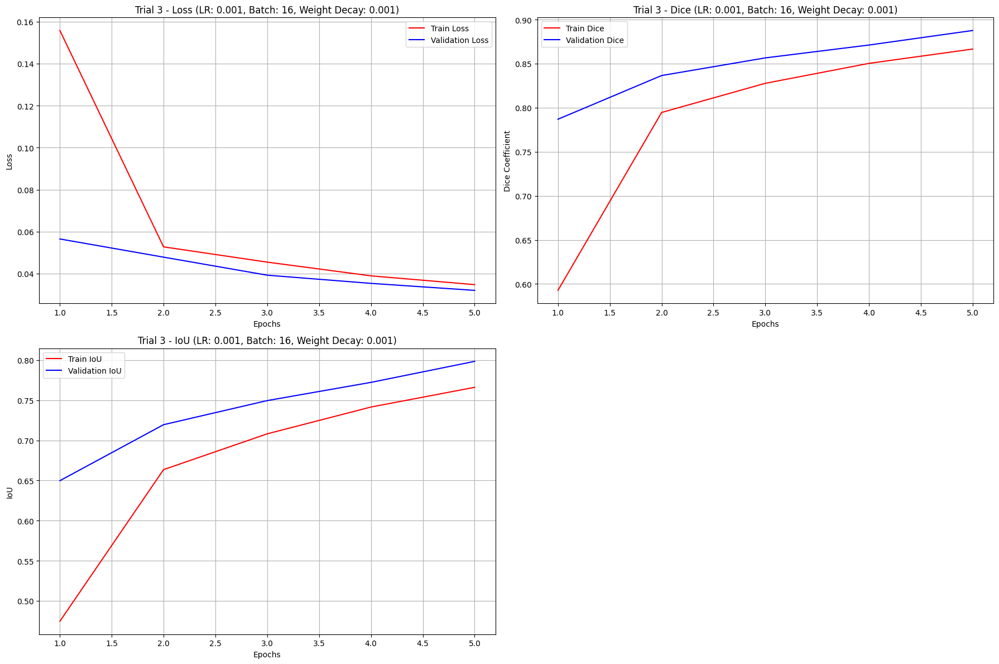



Trial 4/10 --> learning rate = 0.001, batch_size = 64, weight_decay = 0.0001


Epoch 1 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.70s/batch]

Training Loss: 1.0451


Epoch 1 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.73s/batch]

Training Loss: 8.4288


Epoch 1 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.74s/batch]

Training Loss: 0.3625


Epoch 1 Training:  50%|█████     | 4/8 [00:14<00:14,  3.72s/batch]

Training Loss: 0.3226


Epoch 1 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.72s/batch]

Training Loss: 0.2665


Epoch 1 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.71s/batch]

Training Loss: 0.2638


Epoch 1 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.70s/batch]

Training Loss: 0.2151


Epoch 1 Training: 100%|██████████| 8/8 [00:29<00:00,  3.68s/batch]


Training Loss: 0.1810




Epoch 1 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.65s/batch]

Validation Loss: 0.1780


Epoch 1 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.66s/batch]

Validation Loss: 0.1866


Epoch 1 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.01s/batch]


Validation Loss: 0.1846
Epoch 1, Validation Loss: 0.1826, Validation Dice: 0.1621, Validation IoU: 0.0883




Epoch 2 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.66s/batch]

Training Loss: 0.1791


Epoch 2 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.69s/batch]

Training Loss: 0.1539


Epoch 2 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.72s/batch]

Training Loss: 0.1347


Epoch 2 Training:  50%|█████     | 4/8 [00:14<00:14,  3.70s/batch]

Training Loss: 0.1116


Epoch 2 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.68s/batch]

Training Loss: 0.0978


Epoch 2 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.70s/batch]

Training Loss: 0.0989


Epoch 2 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.70s/batch]

Training Loss: 0.0706


Epoch 2 Training: 100%|██████████| 8/8 [00:29<00:00,  3.68s/batch]


Training Loss: 0.0976




Epoch 2 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.63s/batch]

Validation Loss: 0.0954


Epoch 2 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.66s/batch]

Validation Loss: 0.0990


Epoch 2 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.00s/batch]


Validation Loss: 0.0949
Epoch 2, Validation Loss: 0.0969, Validation Dice: 0.7301, Validation IoU: 0.5750




Epoch 3 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.67s/batch]

Training Loss: 0.0946


Epoch 3 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.68s/batch]

Training Loss: 0.0596


Epoch 3 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.71s/batch]

Training Loss: 0.0839


Epoch 3 Training:  50%|█████     | 4/8 [00:14<00:14,  3.69s/batch]

Training Loss: 0.0619


Epoch 3 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.68s/batch]

Training Loss: 0.0526


Epoch 3 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.68s/batch]

Training Loss: 0.0604


Epoch 3 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.67s/batch]

Training Loss: 0.0487


Epoch 3 Training: 100%|██████████| 8/8 [00:29<00:00,  3.66s/batch]


Training Loss: 0.0562




Epoch 3 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.61s/batch]

Validation Loss: 0.0649


Epoch 3 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.63s/batch]

Validation Loss: 0.0664


Epoch 3 Validation: 100%|██████████| 3/3 [00:05<00:00,  2.00s/batch]


Validation Loss: 0.0607
Epoch 3, Validation Loss: 0.0651, Validation Dice: 0.7947, Validation IoU: 0.6594




Epoch 4 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.65s/batch]

Training Loss: 0.0576


Epoch 4 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.67s/batch]

Training Loss: 0.0679


Epoch 4 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.67s/batch]

Training Loss: 0.0501


Epoch 4 Training:  50%|█████     | 4/8 [00:14<00:14,  3.68s/batch]

Training Loss: 0.0646


Epoch 4 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.66s/batch]

Training Loss: 0.0636


Epoch 4 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.67s/batch]

Training Loss: 0.0443


Epoch 4 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.67s/batch]

Training Loss: 0.0565


Epoch 4 Training: 100%|██████████| 8/8 [00:29<00:00,  3.64s/batch]


Training Loss: 0.0494




Epoch 4 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.62s/batch]

Validation Loss: 0.0516


Epoch 4 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.63s/batch]

Validation Loss: 0.0524


Epoch 4 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.99s/batch]


Validation Loss: 0.0530
Epoch 4, Validation Loss: 0.0521, Validation Dice: 0.8081, Validation IoU: 0.6782




Epoch 5 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.69s/batch]

Training Loss: 0.0437


Epoch 5 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.66s/batch]

Training Loss: 0.0515


Epoch 5 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.66s/batch]

Training Loss: 0.0473


Epoch 5 Training:  50%|█████     | 4/8 [00:14<00:14,  3.68s/batch]

Training Loss: 0.0469


Epoch 5 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.67s/batch]

Training Loss: 0.0554


Epoch 5 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.66s/batch]

Training Loss: 0.0477


Epoch 5 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.67s/batch]

Training Loss: 0.0501


Epoch 5 Training: 100%|██████████| 8/8 [00:29<00:00,  3.65s/batch]


Training Loss: 0.0460




Epoch 5 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.60s/batch]

Validation Loss: 0.0516


Epoch 5 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.62s/batch]

Validation Loss: 0.0528


Epoch 5 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.98s/batch]


Validation Loss: 0.0514
Epoch 5, Validation Loss: 0.0521, Validation Dice: 0.8252, Validation IoU: 0.7024




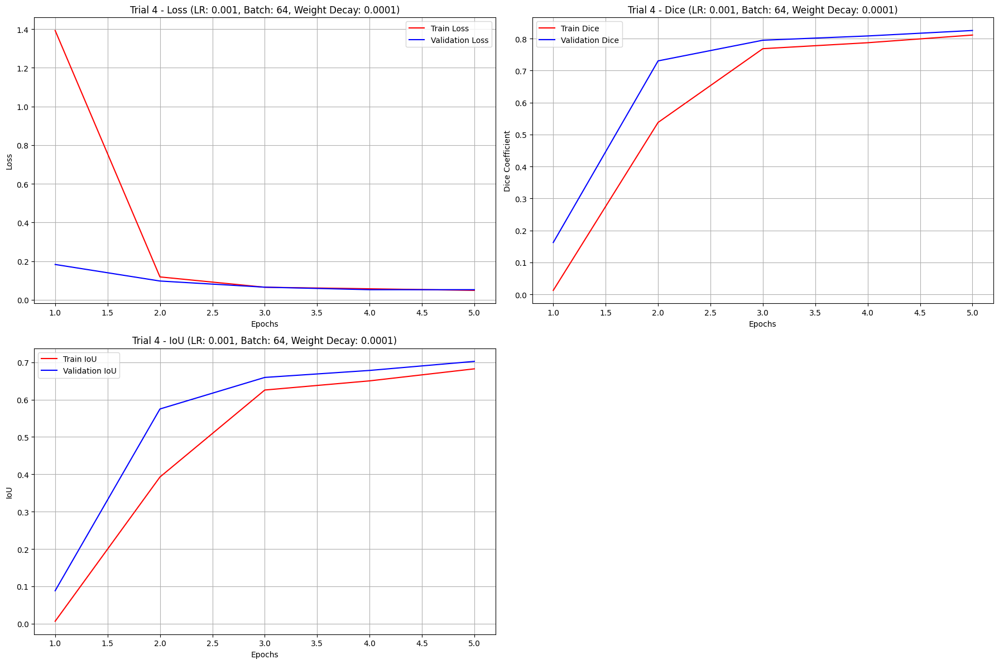



Trial 5/10 --> learning rate = 0.001, batch_size = 32, weight_decay = 0.001


Epoch 1 Training:   6%|▋         | 1/16 [00:01<00:27,  1.84s/batch]

Training Loss: 0.4263


Epoch 1 Training:  12%|█▎        | 2/16 [00:03<00:25,  1.83s/batch]

Training Loss: 4.2801


Epoch 1 Training:  19%|█▉        | 3/16 [00:05<00:23,  1.83s/batch]

Training Loss: 0.4547


Epoch 1 Training:  25%|██▌       | 4/16 [00:07<00:22,  1.84s/batch]

Training Loss: 0.2496


Epoch 1 Training:  31%|███▏      | 5/16 [00:09<00:20,  1.84s/batch]

Training Loss: 0.2419


Epoch 1 Training:  38%|███▊      | 6/16 [00:11<00:18,  1.84s/batch]

Training Loss: 0.1741


Epoch 1 Training:  44%|████▍     | 7/16 [00:12<00:16,  1.85s/batch]

Training Loss: 0.1522


Epoch 1 Training:  50%|█████     | 8/16 [00:14<00:14,  1.86s/batch]

Training Loss: 0.1446


Epoch 1 Training:  56%|█████▋    | 9/16 [00:16<00:13,  1.87s/batch]

Training Loss: 0.2096


Epoch 1 Training:  62%|██████▎   | 10/16 [00:18<00:11,  1.87s/batch]

Training Loss: 0.1763


Epoch 1 Training:  69%|██████▉   | 11/16 [00:20<00:09,  1.87s/batch]

Training Loss: 0.1028


Epoch 1 Training:  75%|███████▌  | 12/16 [00:22<00:07,  1.87s/batch]

Training Loss: 0.1686


Epoch 1 Training:  81%|████████▏ | 13/16 [00:24<00:05,  1.86s/batch]

Training Loss: 0.1716


Epoch 1 Training:  88%|████████▊ | 14/16 [00:26<00:03,  1.87s/batch]

Training Loss: 0.1280


Epoch 1 Training:  94%|█████████▍| 15/16 [00:27<00:01,  1.87s/batch]

Training Loss: 0.0809


Epoch 1 Training: 100%|██████████| 16/16 [00:29<00:00,  1.85s/batch]


Training Loss: 0.1543




Epoch 1 Validation:  20%|██        | 1/5 [00:01<00:05,  1.33s/batch]

Validation Loss: 0.2261


Epoch 1 Validation:  40%|████      | 2/5 [00:02<00:03,  1.33s/batch]

Validation Loss: 0.2599


Epoch 1 Validation:  60%|██████    | 3/5 [00:03<00:02,  1.33s/batch]

Validation Loss: 0.2391


Epoch 1 Validation:  80%|████████  | 4/5 [00:05<00:01,  1.33s/batch]

Validation Loss: 0.2644


Epoch 1 Validation: 100%|██████████| 5/5 [00:06<00:00,  1.20s/batch]


Validation Loss: 0.2353
Epoch 1, Validation Loss: 0.2460, Validation Dice: 0.5334, Validation IoU: 0.3641




Epoch 2 Training:   6%|▋         | 1/16 [00:01<00:27,  1.85s/batch]

Training Loss: 0.2063


Epoch 2 Training:  12%|█▎        | 2/16 [00:03<00:26,  1.89s/batch]

Training Loss: 0.2075


Epoch 2 Training:  19%|█▉        | 3/16 [00:05<00:24,  1.87s/batch]

Training Loss: 0.1035


Epoch 2 Training:  25%|██▌       | 4/16 [00:07<00:22,  1.86s/batch]

Training Loss: 0.0797


Epoch 2 Training:  31%|███▏      | 5/16 [00:09<00:20,  1.84s/batch]

Training Loss: 0.0910


Epoch 2 Training:  38%|███▊      | 6/16 [00:11<00:18,  1.84s/batch]

Training Loss: 0.0743


Epoch 2 Training:  44%|████▍     | 7/16 [00:12<00:16,  1.83s/batch]

Training Loss: 0.0596


Epoch 2 Training:  50%|█████     | 8/16 [00:14<00:14,  1.83s/batch]

Training Loss: 0.0541


Epoch 2 Training:  56%|█████▋    | 9/16 [00:16<00:12,  1.83s/batch]

Training Loss: 0.0577


Epoch 2 Training:  62%|██████▎   | 10/16 [00:18<00:10,  1.82s/batch]

Training Loss: 0.0487


Epoch 2 Training:  69%|██████▉   | 11/16 [00:20<00:09,  1.83s/batch]

Training Loss: 0.0551


Epoch 2 Training:  75%|███████▌  | 12/16 [00:22<00:07,  1.83s/batch]

Training Loss: 0.0619


Epoch 2 Training:  81%|████████▏ | 13/16 [00:23<00:05,  1.83s/batch]

Training Loss: 0.0479


Epoch 2 Training:  88%|████████▊ | 14/16 [00:25<00:03,  1.84s/batch]

Training Loss: 0.0580


Epoch 2 Training:  94%|█████████▍| 15/16 [00:27<00:01,  1.85s/batch]

Training Loss: 0.0738


Epoch 2 Training: 100%|██████████| 16/16 [00:29<00:00,  1.83s/batch]


Training Loss: 0.0728




Epoch 2 Validation:  20%|██        | 1/5 [00:01<00:05,  1.32s/batch]

Validation Loss: 0.0518


Epoch 2 Validation:  40%|████      | 2/5 [00:02<00:03,  1.31s/batch]

Validation Loss: 0.0541


Epoch 2 Validation:  60%|██████    | 3/5 [00:03<00:02,  1.31s/batch]

Validation Loss: 0.0503


Epoch 2 Validation:  80%|████████  | 4/5 [00:05<00:01,  1.31s/batch]

Validation Loss: 0.0554


Epoch 2 Validation: 100%|██████████| 5/5 [00:05<00:00,  1.19s/batch]


Validation Loss: 0.0534
Epoch 2, Validation Loss: 0.0529, Validation Dice: 0.7980, Validation IoU: 0.6644




Epoch 3 Training:   6%|▋         | 1/16 [00:01<00:27,  1.82s/batch]

Training Loss: 0.0601


Epoch 3 Training:  12%|█▎        | 2/16 [00:03<00:25,  1.83s/batch]

Training Loss: 0.0746


Epoch 3 Training:  19%|█▉        | 3/16 [00:05<00:23,  1.83s/batch]

Training Loss: 0.0939


Epoch 3 Training:  25%|██▌       | 4/16 [00:07<00:22,  1.84s/batch]

Training Loss: 0.0786


Epoch 3 Training:  31%|███▏      | 5/16 [00:09<00:20,  1.83s/batch]

Training Loss: 0.0509


Epoch 3 Training:  38%|███▊      | 6/16 [00:11<00:18,  1.83s/batch]

Training Loss: 0.0629


Epoch 3 Training:  44%|████▍     | 7/16 [00:12<00:16,  1.83s/batch]

Training Loss: 0.1041


Epoch 3 Training:  50%|█████     | 8/16 [00:14<00:14,  1.84s/batch]

Training Loss: 0.0837


Epoch 3 Training:  56%|█████▋    | 9/16 [00:16<00:12,  1.85s/batch]

Training Loss: 0.0612


Epoch 3 Training:  62%|██████▎   | 10/16 [00:18<00:11,  1.84s/batch]

Training Loss: 0.0477


Epoch 3 Training:  69%|██████▉   | 11/16 [00:20<00:09,  1.83s/batch]

Training Loss: 0.0653


Epoch 3 Training:  75%|███████▌  | 12/16 [00:21<00:07,  1.83s/batch]

Training Loss: 0.0635


Epoch 3 Training:  81%|████████▏ | 13/16 [00:23<00:05,  1.82s/batch]

Training Loss: 0.0471


Epoch 3 Training:  88%|████████▊ | 14/16 [00:25<00:03,  1.82s/batch]

Training Loss: 0.0503


Epoch 3 Training:  94%|█████████▍| 15/16 [00:27<00:01,  1.82s/batch]

Training Loss: 0.0517


Epoch 3 Training: 100%|██████████| 16/16 [00:29<00:00,  1.82s/batch]


Training Loss: 0.0479




Epoch 3 Validation:  20%|██        | 1/5 [00:01<00:05,  1.30s/batch]

Validation Loss: 0.0462


Epoch 3 Validation:  40%|████      | 2/5 [00:02<00:03,  1.30s/batch]

Validation Loss: 0.0518


Epoch 3 Validation:  60%|██████    | 3/5 [00:03<00:02,  1.30s/batch]

Validation Loss: 0.0469


Epoch 3 Validation:  80%|████████  | 4/5 [00:05<00:01,  1.30s/batch]

Validation Loss: 0.0527


Epoch 3 Validation: 100%|██████████| 5/5 [00:05<00:00,  1.18s/batch]


Validation Loss: 0.0495
Epoch 3, Validation Loss: 0.0494, Validation Dice: 0.8297, Validation IoU: 0.7094




Epoch 4 Training:   6%|▋         | 1/16 [00:01<00:27,  1.86s/batch]

Training Loss: 0.0452


Epoch 4 Training:  12%|█▎        | 2/16 [00:03<00:25,  1.83s/batch]

Training Loss: 0.0450


Epoch 4 Training:  19%|█▉        | 3/16 [00:05<00:23,  1.83s/batch]

Training Loss: 0.0504


Epoch 4 Training:  25%|██▌       | 4/16 [00:07<00:21,  1.82s/batch]

Training Loss: 0.0525


Epoch 4 Training:  31%|███▏      | 5/16 [00:09<00:20,  1.82s/batch]

Training Loss: 0.0504


Epoch 4 Training:  38%|███▊      | 6/16 [00:10<00:18,  1.82s/batch]

Training Loss: 0.0538


Epoch 4 Training:  44%|████▍     | 7/16 [00:12<00:16,  1.83s/batch]

Training Loss: 0.0483


Epoch 4 Training:  50%|█████     | 8/16 [00:14<00:14,  1.82s/batch]

Training Loss: 0.0591


Epoch 4 Training:  56%|█████▋    | 9/16 [00:16<00:12,  1.83s/batch]

Training Loss: 0.0654


Epoch 4 Training:  62%|██████▎   | 10/16 [00:18<00:11,  1.84s/batch]

Training Loss: 0.0458


Epoch 4 Training:  69%|██████▉   | 11/16 [00:20<00:09,  1.83s/batch]

Training Loss: 0.0474


Epoch 4 Training:  75%|███████▌  | 12/16 [00:21<00:07,  1.84s/batch]

Training Loss: 0.0455


Epoch 4 Training:  81%|████████▏ | 13/16 [00:23<00:05,  1.84s/batch]

Training Loss: 0.0507


Epoch 4 Training:  88%|████████▊ | 14/16 [00:25<00:03,  1.84s/batch]

Training Loss: 0.0495


Epoch 4 Training:  94%|█████████▍| 15/16 [00:27<00:01,  1.83s/batch]

Training Loss: 0.0496


Epoch 4 Training: 100%|██████████| 16/16 [00:29<00:00,  1.82s/batch]


Training Loss: 0.0401




Epoch 4 Validation:  20%|██        | 1/5 [00:01<00:05,  1.29s/batch]

Validation Loss: 0.0464


Epoch 4 Validation:  40%|████      | 2/5 [00:02<00:03,  1.29s/batch]

Validation Loss: 0.0473


Epoch 4 Validation:  60%|██████    | 3/5 [00:03<00:02,  1.30s/batch]

Validation Loss: 0.0448


Epoch 4 Validation:  80%|████████  | 4/5 [00:05<00:01,  1.30s/batch]

Validation Loss: 0.0496


Epoch 4 Validation: 100%|██████████| 5/5 [00:05<00:00,  1.18s/batch]


Validation Loss: 0.0481
Epoch 4, Validation Loss: 0.0472, Validation Dice: 0.8244, Validation IoU: 0.7016




Epoch 5 Training:   6%|▋         | 1/16 [00:01<00:27,  1.85s/batch]

Training Loss: 0.0532


Epoch 5 Training:  12%|█▎        | 2/16 [00:03<00:25,  1.84s/batch]

Training Loss: 0.0456


Epoch 5 Training:  19%|█▉        | 3/16 [00:05<00:24,  1.85s/batch]

Training Loss: 0.0424


Epoch 5 Training:  25%|██▌       | 4/16 [00:07<00:22,  1.85s/batch]

Training Loss: 0.0451


Epoch 5 Training:  31%|███▏      | 5/16 [00:09<00:20,  1.84s/batch]

Training Loss: 0.0426


Epoch 5 Training:  38%|███▊      | 6/16 [00:11<00:18,  1.84s/batch]

Training Loss: 0.0381


Epoch 5 Training:  44%|████▍     | 7/16 [00:12<00:16,  1.83s/batch]

Training Loss: 0.0422


Epoch 5 Training:  50%|█████     | 8/16 [00:14<00:14,  1.83s/batch]

Training Loss: 0.0407


Epoch 5 Training:  56%|█████▋    | 9/16 [00:16<00:12,  1.84s/batch]

Training Loss: 0.0359


Epoch 5 Training:  62%|██████▎   | 10/16 [00:18<00:10,  1.83s/batch]

Training Loss: 0.0423


Epoch 5 Training:  69%|██████▉   | 11/16 [00:20<00:09,  1.83s/batch]

Training Loss: 0.0552


Epoch 5 Training:  75%|███████▌  | 12/16 [00:22<00:07,  1.83s/batch]

Training Loss: 0.0467


Epoch 5 Training:  81%|████████▏ | 13/16 [00:23<00:05,  1.82s/batch]

Training Loss: 0.0382


Epoch 5 Training:  88%|████████▊ | 14/16 [00:25<00:03,  1.82s/batch]

Training Loss: 0.0454


Epoch 5 Training:  94%|█████████▍| 15/16 [00:27<00:01,  1.82s/batch]

Training Loss: 0.0460


Epoch 5 Training: 100%|██████████| 16/16 [00:29<00:00,  1.82s/batch]


Training Loss: 0.0411




Epoch 5 Validation:  20%|██        | 1/5 [00:01<00:05,  1.33s/batch]

Validation Loss: 0.0453


Epoch 5 Validation:  40%|████      | 2/5 [00:02<00:03,  1.31s/batch]

Validation Loss: 0.0443


Epoch 5 Validation:  60%|██████    | 3/5 [00:03<00:02,  1.31s/batch]

Validation Loss: 0.0424


Epoch 5 Validation:  80%|████████  | 4/5 [00:05<00:01,  1.30s/batch]

Validation Loss: 0.0476


Epoch 5 Validation: 100%|██████████| 5/5 [00:05<00:00,  1.19s/batch]


Validation Loss: 0.0466
Epoch 5, Validation Loss: 0.0451, Validation Dice: 0.8301, Validation IoU: 0.7099




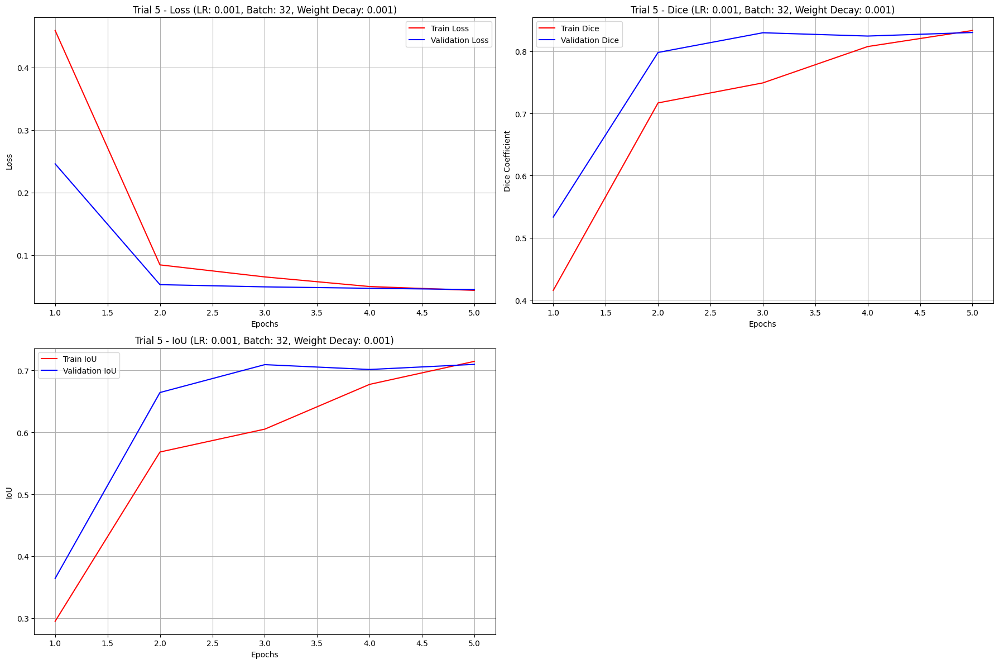



Trial 6/10 --> learning rate = 0.01, batch_size = 16, weight_decay = 0.001


Epoch 1 Training:   3%|▎         | 1/32 [00:00<00:28,  1.09batch/s]

Training Loss: 0.9625


Epoch 1 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 5584567.0000


Epoch 1 Training:   9%|▉         | 3/32 [00:02<00:26,  1.10batch/s]

Training Loss: 152.5922


Epoch 1 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.10batch/s]

Training Loss: 20.0372


Epoch 1 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.10batch/s]

Training Loss: 673829.5625


Epoch 1 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 6.5534


Epoch 1 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.09batch/s]

Training Loss: 41893.3672


Epoch 1 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 46176.9141


Epoch 1 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 55142.7695


Epoch 1 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 349.0007


Epoch 1 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 5763.2363


Epoch 1 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.09batch/s]

Training Loss: 75.6725


Epoch 1 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 8985.5039


Epoch 1 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 48101.3477


Epoch 1 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.10batch/s]

Training Loss: 12789.2324


Epoch 1 Training:  50%|█████     | 16/32 [00:14<00:14,  1.10batch/s]

Training Loss: 259329.3125


Epoch 1 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.10batch/s]

Training Loss: 503.6782


Epoch 1 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.10batch/s]

Training Loss: 301.7826


Epoch 1 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 5530.1338


Epoch 1 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.10batch/s]

Training Loss: 2003405.0000


Epoch 1 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.09batch/s]

Training Loss: 5747.3945


Epoch 1 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 1417.8048


Epoch 1 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.09batch/s]

Training Loss: 16.3465


Epoch 1 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.09batch/s]

Training Loss: 1253421.8750


Epoch 1 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.10batch/s]

Training Loss: 36602.7539


Epoch 1 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.10batch/s]

Training Loss: 130.5626


Epoch 1 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 28804.4551


Epoch 1 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 5273.6411


Epoch 1 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.09batch/s]

Training Loss: 4474.7026


Epoch 1 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.09batch/s]

Training Loss: 113.6848


Epoch 1 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 12746.2725


Epoch 1 Training: 100%|██████████| 32/32 [00:29<00:00,  1.10batch/s]


Training Loss: 28567.7441




Epoch 1 Validation:  10%|█         | 1/10 [00:00<00:05,  1.53batch/s]

Validation Loss: 12076.2520


Epoch 1 Validation:  20%|██        | 2/10 [00:01<00:05,  1.52batch/s]

Validation Loss: 8709.4756


Epoch 1 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 11455.2715


Epoch 1 Validation:  40%|████      | 4/10 [00:02<00:03,  1.52batch/s]

Validation Loss: 9445.8916


Epoch 1 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.51batch/s]

Validation Loss: 12039.2012


Epoch 1 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.52batch/s]

Validation Loss: 13211.2861


Epoch 1 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 11328.2539


Epoch 1 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.53batch/s]

Validation Loss: 11148.5938


Epoch 1 Validation: 100%|██████████| 10/10 [00:05<00:00,  1.67batch/s]


Validation Loss: 10529.4883
Validation Loss: 5712.0625
Epoch 1, Validation Loss: 11067.6654, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 2 Training:   3%|▎         | 1/32 [00:00<00:27,  1.11batch/s]

Training Loss: 10574.8672


Epoch 2 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 1073489.7500


Epoch 2 Training:   9%|▉         | 3/32 [00:02<00:26,  1.09batch/s]

Training Loss: 95454.8281


Epoch 2 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.09batch/s]

Training Loss: 231196.1562


Epoch 2 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.09batch/s]

Training Loss: 941.1911


Epoch 2 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 100988.2422


Epoch 2 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.09batch/s]

Training Loss: 17383.9160


Epoch 2 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.09batch/s]

Training Loss: 23212.0566


Epoch 2 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 631249.3750


Epoch 2 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 46715.2109


Epoch 2 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.07batch/s]

Training Loss: 340506.2188


Epoch 2 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 604.6578


Epoch 2 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 2461.4321


Epoch 2 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 7361.6030


Epoch 2 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.10batch/s]

Training Loss: 211.6493


Epoch 2 Training:  50%|█████     | 16/32 [00:14<00:14,  1.10batch/s]

Training Loss: 219.5634


Epoch 2 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 2386.4824


Epoch 2 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 18362.5273


Epoch 2 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.10batch/s]

Training Loss: 2520.2837


Epoch 2 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.10batch/s]

Training Loss: 230.3165


Epoch 2 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.09batch/s]

Training Loss: 7901.1558


Epoch 2 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 3505.1191


Epoch 2 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 326.2580


Epoch 2 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 236.6949


Epoch 2 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.09batch/s]

Training Loss: 147.4167


Epoch 2 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.10batch/s]

Training Loss: 9893.8828


Epoch 2 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 314.4319


Epoch 2 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.10batch/s]

Training Loss: 299.4891


Epoch 2 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.10batch/s]

Training Loss: 5043.4414


Epoch 2 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 1527.3833


Epoch 2 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.11batch/s]

Training Loss: 232.7504


Epoch 2 Training: 100%|██████████| 32/32 [00:29<00:00,  1.10batch/s]


Training Loss: 91.1397




Epoch 2 Validation:  10%|█         | 1/10 [00:00<00:05,  1.53batch/s]

Validation Loss: 1468.6982


Epoch 2 Validation:  20%|██        | 2/10 [00:01<00:05,  1.52batch/s]

Validation Loss: 1493.7236


Epoch 2 Validation:  30%|███       | 3/10 [00:01<00:04,  1.51batch/s]

Validation Loss: 1475.9111


Epoch 2 Validation:  40%|████      | 4/10 [00:02<00:03,  1.53batch/s]

Validation Loss: 1496.3240


Epoch 2 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.52batch/s]

Validation Loss: 1477.9470


Epoch 2 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 1459.8418


Epoch 2 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 1476.9728


Epoch 2 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.51batch/s]

Validation Loss: 1481.7217


Epoch 2 Validation: 100%|██████████| 10/10 [00:05<00:00,  1.67batch/s]


Validation Loss: 1480.1741
Validation Loss: 1527.7566
Epoch 2, Validation Loss: 1479.3709, Validation Dice: 0.1052, Validation IoU: 0.0556




Epoch 3 Training:   3%|▎         | 1/32 [00:00<00:28,  1.10batch/s]

Training Loss: 1480.8284


Epoch 3 Training:   6%|▋         | 2/32 [00:01<00:27,  1.10batch/s]

Training Loss: 983.0310


Epoch 3 Training:   9%|▉         | 3/32 [00:02<00:26,  1.09batch/s]

Training Loss: 11028.1816


Epoch 3 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.10batch/s]

Training Loss: 13.0621


Epoch 3 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.09batch/s]

Training Loss: 2087133.3750


Epoch 3 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 12.4771


Epoch 3 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.10batch/s]

Training Loss: 2602.1182


Epoch 3 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.09batch/s]

Training Loss: 7581.7080


Epoch 3 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 1774.5913


Epoch 3 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 45763.0156


Epoch 3 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 163585.3125


Epoch 3 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.07batch/s]

Training Loss: 199125.7188


Epoch 3 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 4837.1328


Epoch 3 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 14740.0166


Epoch 3 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 7593.7549


Epoch 3 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 4432.1284


Epoch 3 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.10batch/s]

Training Loss: 4862.8242


Epoch 3 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.10batch/s]

Training Loss: 324.4780


Epoch 3 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.10batch/s]

Training Loss: 15828.4355


Epoch 3 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.10batch/s]

Training Loss: 1185.6676


Epoch 3 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.09batch/s]

Training Loss: 72.8272


Epoch 3 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 4026.8577


Epoch 3 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 719.8997


Epoch 3 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.07batch/s]

Training Loss: 1120.2010


Epoch 3 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.07batch/s]

Training Loss: 659.2821


Epoch 3 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.09batch/s]

Training Loss: 8.3887


Epoch 3 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 63.2248


Epoch 3 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.10batch/s]

Training Loss: 76.7142


Epoch 3 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.10batch/s]

Training Loss: 1839.3295


Epoch 3 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 746.0326


Epoch 3 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.10batch/s]

Training Loss: 209999.3750


Epoch 3 Training: 100%|██████████| 32/32 [00:29<00:00,  1.10batch/s]


Training Loss: 6743.2627




Epoch 3 Validation:  10%|█         | 1/10 [00:00<00:05,  1.55batch/s]

Validation Loss: 322.3853


Epoch 3 Validation:  20%|██        | 2/10 [00:01<00:05,  1.55batch/s]

Validation Loss: 327.6832


Epoch 3 Validation:  30%|███       | 3/10 [00:01<00:04,  1.56batch/s]

Validation Loss: 324.0267


Epoch 3 Validation:  40%|████      | 4/10 [00:02<00:03,  1.55batch/s]

Validation Loss: 328.1915


Epoch 3 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.52batch/s]

Validation Loss: 324.4370


Epoch 3 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.53batch/s]

Validation Loss: 320.6212


Epoch 3 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 324.1191


Epoch 3 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.52batch/s]

Validation Loss: 325.1102


Epoch 3 Validation: 100%|██████████| 10/10 [00:05<00:00,  1.68batch/s]


Validation Loss: 324.8184
Validation Loss: 334.7119
Epoch 3, Validation Loss: 324.6689, Validation Dice: 0.1052, Validation IoU: 0.0556




Epoch 4 Training:   3%|▎         | 1/32 [00:00<00:28,  1.07batch/s]

Training Loss: 325.2240


Epoch 4 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 16.9073


Epoch 4 Training:   9%|▉         | 3/32 [00:02<00:26,  1.10batch/s]

Training Loss: 3415.8469


Epoch 4 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.10batch/s]

Training Loss: 7698.8389


Epoch 4 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.11batch/s]

Training Loss: 422.6370


Epoch 4 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.11batch/s]

Training Loss: 155.5347


Epoch 4 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.11batch/s]

Training Loss: 4696.0488


Epoch 4 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.11batch/s]

Training Loss: 2472.2285


Epoch 4 Training:  28%|██▊       | 9/32 [00:08<00:20,  1.11batch/s]

Training Loss: 667.2610


Epoch 4 Training:  31%|███▏      | 10/32 [00:09<00:19,  1.10batch/s]

Training Loss: 576.4801


Epoch 4 Training:  34%|███▍      | 11/32 [00:09<00:19,  1.10batch/s]

Training Loss: 780.6523


Epoch 4 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.09batch/s]

Training Loss: 77.9842


Epoch 4 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 156.8707


Epoch 4 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.10batch/s]

Training Loss: 187.5990


Epoch 4 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.11batch/s]

Training Loss: 73.3040


Epoch 4 Training:  50%|█████     | 16/32 [00:14<00:14,  1.11batch/s]

Training Loss: 812.0168


Epoch 4 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.10batch/s]

Training Loss: 366.0947


Epoch 4 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.11batch/s]

Training Loss: 402.0411


Epoch 4 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.10batch/s]

Training Loss: 151.9691


Epoch 4 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.10batch/s]

Training Loss: 8.2923


Epoch 4 Training:  66%|██████▌   | 21/32 [00:19<00:09,  1.11batch/s]

Training Loss: 219.0403


Epoch 4 Training:  69%|██████▉   | 22/32 [00:19<00:09,  1.10batch/s]

Training Loss: 2841.7078


Epoch 4 Training:  72%|███████▏  | 23/32 [00:20<00:08,  1.10batch/s]

Training Loss: 8896.9727


Epoch 4 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.09batch/s]

Training Loss: 936.6001


Epoch 4 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.09batch/s]

Training Loss: 20692.4648


Epoch 4 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.09batch/s]

Training Loss: 181.2279


Epoch 4 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.09batch/s]

Training Loss: 32.3156


Epoch 4 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.10batch/s]

Training Loss: 7691.9160


Epoch 4 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.10batch/s]

Training Loss: 2383.4626


Epoch 4 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 48.9211


Epoch 4 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.10batch/s]

Training Loss: 143.7000


Epoch 4 Training: 100%|██████████| 32/32 [00:28<00:00,  1.11batch/s]


Training Loss: 16490.8281




Epoch 4 Validation:  10%|█         | 1/10 [00:00<00:05,  1.52batch/s]

Validation Loss: 343.0391


Epoch 4 Validation:  20%|██        | 2/10 [00:01<00:05,  1.52batch/s]

Validation Loss: 267.9379


Epoch 4 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 319.4488


Epoch 4 Validation:  40%|████      | 4/10 [00:02<00:03,  1.52batch/s]

Validation Loss: 260.7403


Epoch 4 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.52batch/s]

Validation Loss: 313.8541


Epoch 4 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 367.9290


Epoch 4 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 318.7474


Epoch 4 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.50batch/s]

Validation Loss: 304.4116


Epoch 4 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 308.4601
Validation Loss: 167.4100
Epoch 4, Validation Loss: 310.6242, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 5 Training:   3%|▎         | 1/32 [00:00<00:29,  1.06batch/s]

Training Loss: 304.1151


Epoch 5 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 328.8073


Epoch 5 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 5303.3867


Epoch 5 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.09batch/s]

Training Loss: 114.0693


Epoch 5 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.09batch/s]

Training Loss: 1237.4575


Epoch 5 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 921.2786


Epoch 5 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.09batch/s]

Training Loss: 88.0112


Epoch 5 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.09batch/s]

Training Loss: 768.3373


Epoch 5 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 1727.0664


Epoch 5 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 4563.7686


Epoch 5 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 36338.7578


Epoch 5 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 22641.6113


Epoch 5 Training:  41%|████      | 13/32 [00:11<00:17,  1.08batch/s]

Training Loss: 317205.4375


Epoch 5 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.07batch/s]

Training Loss: 1108.2361


Epoch 5 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.07batch/s]

Training Loss: 304.4234


Epoch 5 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 7668.1899


Epoch 5 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.07batch/s]

Training Loss: 16151.4160


Epoch 5 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 356.4507


Epoch 5 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 24.5821


Epoch 5 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.09batch/s]

Training Loss: 7.4722


Epoch 5 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.09batch/s]

Training Loss: 96.3660


Epoch 5 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 1.3872


Epoch 5 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.09batch/s]

Training Loss: 47.9660


Epoch 5 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.10batch/s]

Training Loss: 0.4920


Epoch 5 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.09batch/s]

Training Loss: 0.4260


Epoch 5 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.10batch/s]

Training Loss: 0.3678


Epoch 5 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 0.3004


Epoch 5 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.10batch/s]

Training Loss: 0.2360


Epoch 5 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.10batch/s]

Training Loss: 289.4428


Epoch 5 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 0.2056


Epoch 5 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.10batch/s]

Training Loss: 299.7620


Epoch 5 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 266785.8438




Epoch 5 Validation:  10%|█         | 1/10 [00:00<00:05,  1.54batch/s]

Validation Loss: 1427.0967


Epoch 5 Validation:  20%|██        | 2/10 [00:01<00:05,  1.50batch/s]

Validation Loss: 1115.8890


Epoch 5 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 1329.3019


Epoch 5 Validation:  40%|████      | 4/10 [00:02<00:03,  1.53batch/s]

Validation Loss: 1087.2819


Epoch 5 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.52batch/s]

Validation Loss: 1303.6604


Epoch 5 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.52batch/s]

Validation Loss: 1526.7336


Epoch 5 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.50batch/s]

Validation Loss: 1330.6023


Epoch 5 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.51batch/s]

Validation Loss: 1268.6455


Epoch 5 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 1282.2797
Validation Loss: 700.0516
Epoch 5, Validation Loss: 1292.7166, Validation Dice: 0.0010, Validation IoU: 0.0005




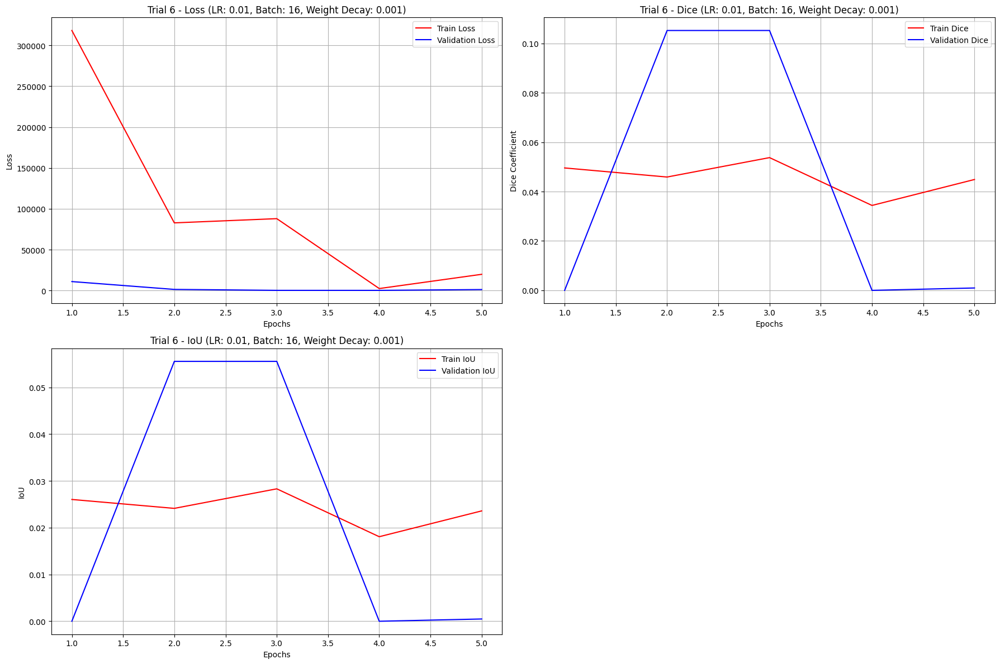



Trial 7/10 --> learning rate = 0.001, batch_size = 64, weight_decay = 0.001


Epoch 1 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.75s/batch]

Training Loss: 1.0753


Epoch 1 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.72s/batch]

Training Loss: 0.9652


Epoch 1 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.72s/batch]

Training Loss: 0.3209


Epoch 1 Training:  50%|█████     | 4/8 [00:14<00:14,  3.74s/batch]

Training Loss: 0.3357


Epoch 1 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Training Loss: 0.2262


Epoch 1 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.72s/batch]

Training Loss: 0.2321


Epoch 1 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.73s/batch]

Training Loss: 0.1994


Epoch 1 Training: 100%|██████████| 8/8 [00:29<00:00,  3.70s/batch]


Training Loss: 0.1703




Epoch 1 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.62s/batch]

Validation Loss: 0.1390


Epoch 1 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.62s/batch]

Validation Loss: 0.1445


Epoch 1 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.98s/batch]


Validation Loss: 0.1452
Epoch 1, Validation Loss: 0.1421, Validation Dice: 0.6288, Validation IoU: 0.4587




Epoch 2 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.69s/batch]

Training Loss: 0.1429


Epoch 2 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.67s/batch]

Training Loss: 0.1170


Epoch 2 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.67s/batch]

Training Loss: 0.1009


Epoch 2 Training:  50%|█████     | 4/8 [00:14<00:14,  3.67s/batch]

Training Loss: 0.1156


Epoch 2 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.69s/batch]

Training Loss: 0.0942


Epoch 2 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.70s/batch]

Training Loss: 0.0790


Epoch 2 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.69s/batch]

Training Loss: 0.0845


Epoch 2 Training: 100%|██████████| 8/8 [00:29<00:00,  3.66s/batch]


Training Loss: 0.0733




Epoch 2 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.57s/batch]

Validation Loss: 0.0626


Epoch 2 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.60s/batch]

Validation Loss: 0.0632


Epoch 2 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.97s/batch]


Validation Loss: 0.0614
Epoch 2, Validation Loss: 0.0627, Validation Dice: 0.7801, Validation IoU: 0.6396




Epoch 3 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.69s/batch]

Training Loss: 0.0560


Epoch 3 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.67s/batch]

Training Loss: 0.0591


Epoch 3 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.66s/batch]

Training Loss: 0.0526


Epoch 3 Training:  50%|█████     | 4/8 [00:14<00:14,  3.66s/batch]

Training Loss: 0.0582


Epoch 3 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.66s/batch]

Training Loss: 0.0555


Epoch 3 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.66s/batch]

Training Loss: 0.0550


Epoch 3 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.66s/batch]

Training Loss: 0.0498


Epoch 3 Training: 100%|██████████| 8/8 [00:29<00:00,  3.64s/batch]


Training Loss: 0.0500




Epoch 3 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.60s/batch]

Validation Loss: 0.0518


Epoch 3 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.61s/batch]

Validation Loss: 0.0530


Epoch 3 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.97s/batch]


Validation Loss: 0.0518
Epoch 3, Validation Loss: 0.0523, Validation Dice: 0.8201, Validation IoU: 0.6952




Epoch 4 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.66s/batch]

Training Loss: 0.0536


Epoch 4 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.65s/batch]

Training Loss: 0.0507


Epoch 4 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.72s/batch]

Training Loss: 0.0481


Epoch 4 Training:  50%|█████     | 4/8 [00:14<00:14,  3.69s/batch]

Training Loss: 0.0468


Epoch 4 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.70s/batch]

Training Loss: 0.0387


Epoch 4 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.70s/batch]

Training Loss: 0.0437


Epoch 4 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.68s/batch]

Training Loss: 0.0523


Epoch 4 Training: 100%|██████████| 8/8 [00:29<00:00,  3.67s/batch]


Training Loss: 0.0456




Epoch 4 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.57s/batch]

Validation Loss: 0.0471


Epoch 4 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.62s/batch]

Validation Loss: 0.0478


Epoch 4 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.99s/batch]


Validation Loss: 0.0477
Epoch 4, Validation Loss: 0.0475, Validation Dice: 0.8338, Validation IoU: 0.7150




Epoch 5 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.68s/batch]

Training Loss: 0.0426


Epoch 5 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.70s/batch]

Training Loss: 0.0409


Epoch 5 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.69s/batch]

Training Loss: 0.0433


Epoch 5 Training:  50%|█████     | 4/8 [00:14<00:14,  3.68s/batch]

Training Loss: 0.0414


Epoch 5 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.68s/batch]

Training Loss: 0.0411


Epoch 5 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.68s/batch]

Training Loss: 0.0448


Epoch 5 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.67s/batch]

Training Loss: 0.0482


Epoch 5 Training: 100%|██████████| 8/8 [00:29<00:00,  3.66s/batch]


Training Loss: 0.0430




Epoch 5 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.62s/batch]

Validation Loss: 0.0559


Epoch 5 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.65s/batch]

Validation Loss: 0.0563


Epoch 5 Validation: 100%|██████████| 3/3 [00:05<00:00,  2.00s/batch]


Validation Loss: 0.0560
Epoch 5, Validation Loss: 0.0561, Validation Dice: 0.8108, Validation IoU: 0.6818




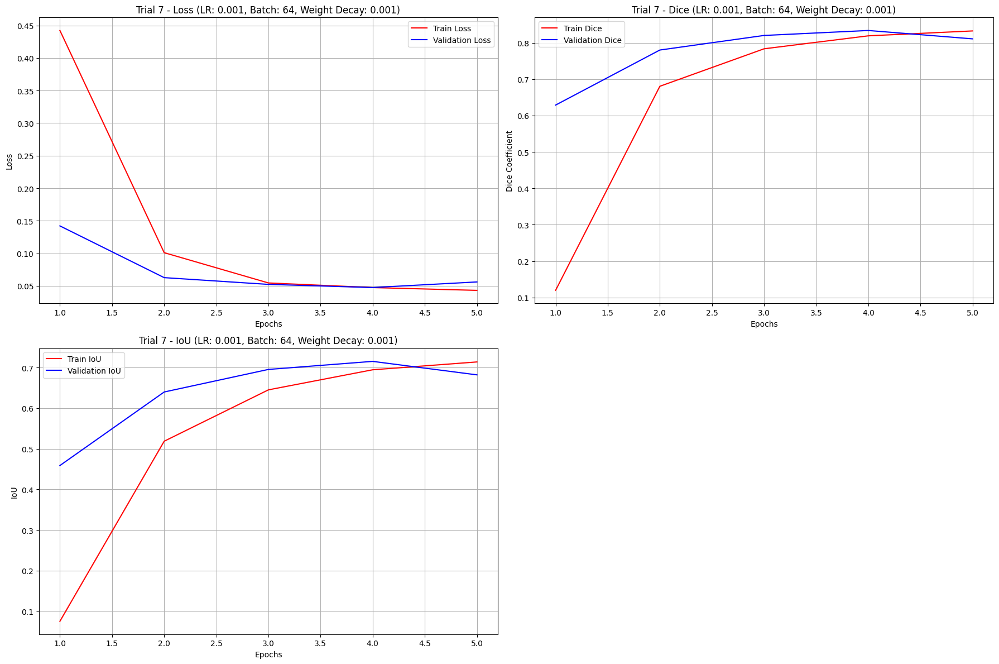



Trial 8/10 --> learning rate = 0.001, batch_size = 16, weight_decay = 0.001


Epoch 1 Training:   3%|▎         | 1/32 [00:00<00:28,  1.07batch/s]

Training Loss: 0.4774


Epoch 1 Training:   6%|▋         | 2/32 [00:01<00:27,  1.07batch/s]

Training Loss: 1.0156


Epoch 1 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.2746


Epoch 1 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.06batch/s]

Training Loss: 0.3062


Epoch 1 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.07batch/s]

Training Loss: 0.2749


Epoch 1 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.06batch/s]

Training Loss: 0.2691


Epoch 1 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.06batch/s]

Training Loss: 0.2125


Epoch 1 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.06batch/s]

Training Loss: 0.1594


Epoch 1 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.06batch/s]

Training Loss: 0.1608


Epoch 1 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.06batch/s]

Training Loss: 0.1120


Epoch 1 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.06batch/s]

Training Loss: 0.0924


Epoch 1 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.06batch/s]

Training Loss: 0.0981


Epoch 1 Training:  41%|████      | 13/32 [00:12<00:17,  1.07batch/s]

Training Loss: 0.0878


Epoch 1 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.08batch/s]

Training Loss: 0.0897


Epoch 1 Training:  47%|████▋     | 15/32 [00:14<00:15,  1.07batch/s]

Training Loss: 0.0764


Epoch 1 Training:  50%|█████     | 16/32 [00:15<00:14,  1.07batch/s]

Training Loss: 0.0612


Epoch 1 Training:  53%|█████▎    | 17/32 [00:15<00:14,  1.07batch/s]

Training Loss: 0.1011


Epoch 1 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.06batch/s]

Training Loss: 0.0904


Epoch 1 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.06batch/s]

Training Loss: 0.0619


Epoch 1 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0749


Epoch 1 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.06batch/s]

Training Loss: 0.0443


Epoch 1 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.0588


Epoch 1 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.07batch/s]

Training Loss: 0.0597


Epoch 1 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.06batch/s]

Training Loss: 0.0892


Epoch 1 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.07batch/s]

Training Loss: 0.0714


Epoch 1 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.07batch/s]

Training Loss: 0.0613


Epoch 1 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.07batch/s]

Training Loss: 0.0681


Epoch 1 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.07batch/s]

Training Loss: 0.0453


Epoch 1 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.07batch/s]

Training Loss: 0.0417


Epoch 1 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.07batch/s]

Training Loss: 0.0375


Epoch 1 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.07batch/s]

Training Loss: 0.0535


Epoch 1 Training: 100%|██████████| 32/32 [00:29<00:00,  1.07batch/s]


Training Loss: 0.0732




Epoch 1 Validation:  10%|█         | 1/10 [00:00<00:05,  1.52batch/s]

Validation Loss: 0.0527


Epoch 1 Validation:  20%|██        | 2/10 [00:01<00:05,  1.53batch/s]

Validation Loss: 0.0364


Epoch 1 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 0.0582


Epoch 1 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0419


Epoch 1 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.48batch/s]

Validation Loss: 0.0387


Epoch 1 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0495


Epoch 1 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.0516


Epoch 1 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0502


Epoch 1 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.0469
Validation Loss: 0.0390
Epoch 1, Validation Loss: 0.0473, Validation Dice: 0.8338, Validation IoU: 0.7155




Epoch 2 Training:   3%|▎         | 1/32 [00:00<00:28,  1.09batch/s]

Training Loss: 0.0641


Epoch 2 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0696


Epoch 2 Training:   9%|▉         | 3/32 [00:02<00:27,  1.06batch/s]

Training Loss: 0.0628


Epoch 2 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.07batch/s]

Training Loss: 0.0478


Epoch 2 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.07batch/s]

Training Loss: 0.0727


Epoch 2 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.07batch/s]

Training Loss: 0.0605


Epoch 2 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.06batch/s]

Training Loss: 0.0426


Epoch 2 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.07batch/s]

Training Loss: 0.0488


Epoch 2 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.06batch/s]

Training Loss: 0.0450


Epoch 2 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.06batch/s]

Training Loss: 0.0462


Epoch 2 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.07batch/s]

Training Loss: 0.0485


Epoch 2 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.07batch/s]

Training Loss: 0.0428


Epoch 2 Training:  41%|████      | 13/32 [00:12<00:17,  1.07batch/s]

Training Loss: 0.0426


Epoch 2 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.07batch/s]

Training Loss: 0.0483


Epoch 2 Training:  47%|████▋     | 15/32 [00:14<00:15,  1.07batch/s]

Training Loss: 0.0387


Epoch 2 Training:  50%|█████     | 16/32 [00:14<00:15,  1.07batch/s]

Training Loss: 0.0468


Epoch 2 Training:  53%|█████▎    | 17/32 [00:15<00:14,  1.07batch/s]

Training Loss: 0.0443


Epoch 2 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.06batch/s]

Training Loss: 0.0387


Epoch 2 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.05batch/s]

Training Loss: 0.0426


Epoch 2 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.06batch/s]

Training Loss: 0.0322


Epoch 2 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0342


Epoch 2 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.0359


Epoch 2 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.06batch/s]

Training Loss: 0.0404


Epoch 2 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.07batch/s]

Training Loss: 0.0654


Epoch 2 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.04batch/s]

Training Loss: 0.0522


Epoch 2 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.05batch/s]

Training Loss: 0.0364


Epoch 2 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.06batch/s]

Training Loss: 0.0756


Epoch 2 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.06batch/s]

Training Loss: 0.0528


Epoch 2 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.06batch/s]

Training Loss: 0.0404


Epoch 2 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.06batch/s]

Training Loss: 0.0389


Epoch 2 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.06batch/s]

Training Loss: 0.0410


Epoch 2 Training: 100%|██████████| 32/32 [00:29<00:00,  1.07batch/s]


Training Loss: 0.0351




Epoch 2 Validation:  10%|█         | 1/10 [00:00<00:05,  1.52batch/s]

Validation Loss: 0.0512


Epoch 2 Validation:  20%|██        | 2/10 [00:01<00:05,  1.51batch/s]

Validation Loss: 0.0332


Epoch 2 Validation:  30%|███       | 3/10 [00:01<00:04,  1.51batch/s]

Validation Loss: 0.0427


Epoch 2 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0385


Epoch 2 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 0.0322


Epoch 2 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.50batch/s]

Validation Loss: 0.0459


Epoch 2 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0436


Epoch 2 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.50batch/s]

Validation Loss: 0.0460


Epoch 2 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.65batch/s]


Validation Loss: 0.0454
Validation Loss: 0.0288
Epoch 2, Validation Loss: 0.0420, Validation Dice: 0.8449, Validation IoU: 0.7320




Epoch 3 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0511


Epoch 3 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 0.0631


Epoch 3 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0389


Epoch 3 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.07batch/s]

Training Loss: 0.0436


Epoch 3 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.06batch/s]

Training Loss: 0.0561


Epoch 3 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.06batch/s]

Training Loss: 0.0456


Epoch 3 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.07batch/s]

Training Loss: 0.0354


Epoch 3 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.07batch/s]

Training Loss: 0.0665


Epoch 3 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 0.0591


Epoch 3 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.07batch/s]

Training Loss: 0.0326


Epoch 3 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0853


Epoch 3 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0445


Epoch 3 Training:  41%|████      | 13/32 [00:12<00:17,  1.08batch/s]

Training Loss: 0.0337


Epoch 3 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.08batch/s]

Training Loss: 0.0430


Epoch 3 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.0440


Epoch 3 Training:  50%|█████     | 16/32 [00:14<00:14,  1.07batch/s]

Training Loss: 0.0416


Epoch 3 Training:  53%|█████▎    | 17/32 [00:15<00:14,  1.07batch/s]

Training Loss: 0.0496


Epoch 3 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.06batch/s]

Training Loss: 0.0429


Epoch 3 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.06batch/s]

Training Loss: 0.0439


Epoch 3 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0375


Epoch 3 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0306


Epoch 3 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.0372


Epoch 3 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0489


Epoch 3 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.07batch/s]

Training Loss: 0.0290


Epoch 3 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.07batch/s]

Training Loss: 0.0426


Epoch 3 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.07batch/s]

Training Loss: 0.0321


Epoch 3 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.07batch/s]

Training Loss: 0.0366


Epoch 3 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.07batch/s]

Training Loss: 0.0300


Epoch 3 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.06batch/s]

Training Loss: 0.0299


Epoch 3 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.06batch/s]

Training Loss: 0.0283


Epoch 3 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.07batch/s]

Training Loss: 0.0275


Epoch 3 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0360




Epoch 3 Validation:  10%|█         | 1/10 [00:00<00:06,  1.47batch/s]

Validation Loss: 0.0435


Epoch 3 Validation:  20%|██        | 2/10 [00:01<00:05,  1.51batch/s]

Validation Loss: 0.0324


Epoch 3 Validation:  30%|███       | 3/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0443


Epoch 3 Validation:  40%|████      | 4/10 [00:02<00:03,  1.50batch/s]

Validation Loss: 0.0365


Epoch 3 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0328


Epoch 3 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0424


Epoch 3 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.0455


Epoch 3 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.51batch/s]

Validation Loss: 0.0413


Epoch 3 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0416
Validation Loss: 0.0396
Epoch 3, Validation Loss: 0.0400, Validation Dice: 0.8616, Validation IoU: 0.7572




Epoch 4 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0386


Epoch 4 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0319


Epoch 4 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0432


Epoch 4 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.0520


Epoch 4 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.07batch/s]

Training Loss: 0.0396


Epoch 4 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.07batch/s]

Training Loss: 0.0890


Epoch 4 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.06batch/s]

Training Loss: 0.2169


Epoch 4 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.07batch/s]

Training Loss: 0.1180


Epoch 4 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.06batch/s]

Training Loss: 0.0306


Epoch 4 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.07batch/s]

Training Loss: 0.0513


Epoch 4 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.07batch/s]

Training Loss: 0.0701


Epoch 4 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.07batch/s]

Training Loss: 0.0544


Epoch 4 Training:  41%|████      | 13/32 [00:12<00:17,  1.07batch/s]

Training Loss: 0.0369


Epoch 4 Training:  44%|████▍     | 14/32 [00:13<00:17,  1.05batch/s]

Training Loss: 0.0521


Epoch 4 Training:  47%|████▋     | 15/32 [00:14<00:16,  1.06batch/s]

Training Loss: 0.0753


Epoch 4 Training:  50%|█████     | 16/32 [00:14<00:15,  1.07batch/s]

Training Loss: 0.0567


Epoch 4 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.07batch/s]

Training Loss: 0.0486


Epoch 4 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0439


Epoch 4 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0416


Epoch 4 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.06batch/s]

Training Loss: 0.0525


Epoch 4 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0377


Epoch 4 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.0372


Epoch 4 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.07batch/s]

Training Loss: 0.0319


Epoch 4 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0399


Epoch 4 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.07batch/s]

Training Loss: 0.0305


Epoch 4 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.07batch/s]

Training Loss: 0.0400


Epoch 4 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.07batch/s]

Training Loss: 0.0437


Epoch 4 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.07batch/s]

Training Loss: 0.0287


Epoch 4 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.06batch/s]

Training Loss: 0.0358


Epoch 4 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.07batch/s]

Training Loss: 0.0393


Epoch 4 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.07batch/s]

Training Loss: 0.0364


Epoch 4 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0394




Epoch 4 Validation:  10%|█         | 1/10 [00:00<00:05,  1.50batch/s]

Validation Loss: 0.0541


Epoch 4 Validation:  20%|██        | 2/10 [00:01<00:05,  1.49batch/s]

Validation Loss: 0.0350


Epoch 4 Validation:  30%|███       | 3/10 [00:01<00:04,  1.51batch/s]

Validation Loss: 0.0399


Epoch 4 Validation:  40%|████      | 4/10 [00:02<00:03,  1.50batch/s]

Validation Loss: 0.0383


Epoch 4 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0331


Epoch 4 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0495


Epoch 4 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0429


Epoch 4 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.51batch/s]

Validation Loss: 0.0462


Epoch 4 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0469
Validation Loss: 0.0302
Epoch 4, Validation Loss: 0.0428, Validation Dice: 0.8310, Validation IoU: 0.7116




Epoch 5 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0337


Epoch 5 Training:   6%|▋         | 2/32 [00:01<00:27,  1.07batch/s]

Training Loss: 0.0394


Epoch 5 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0257


Epoch 5 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.07batch/s]

Training Loss: 0.0334


Epoch 5 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.06batch/s]

Training Loss: 0.0485


Epoch 5 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.06batch/s]

Training Loss: 0.0238


Epoch 5 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.06batch/s]

Training Loss: 0.0277


Epoch 5 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.05batch/s]

Training Loss: 0.0284


Epoch 5 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.06batch/s]

Training Loss: 0.0287


Epoch 5 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.05batch/s]

Training Loss: 0.0349


Epoch 5 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.06batch/s]

Training Loss: 0.0283


Epoch 5 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.06batch/s]

Training Loss: 0.0393


Epoch 5 Training:  41%|████      | 13/32 [00:12<00:17,  1.06batch/s]

Training Loss: 0.0356


Epoch 5 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.06batch/s]

Training Loss: 0.0345


Epoch 5 Training:  47%|████▋     | 15/32 [00:14<00:16,  1.06batch/s]

Training Loss: 0.0374


Epoch 5 Training:  50%|█████     | 16/32 [00:15<00:15,  1.06batch/s]

Training Loss: 0.0409


Epoch 5 Training:  53%|█████▎    | 17/32 [00:16<00:14,  1.06batch/s]

Training Loss: 0.0345


Epoch 5 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.07batch/s]

Training Loss: 0.0367


Epoch 5 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.06batch/s]

Training Loss: 0.0323


Epoch 5 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0313


Epoch 5 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.06batch/s]

Training Loss: 0.0318


Epoch 5 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.06batch/s]

Training Loss: 0.0372


Epoch 5 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.07batch/s]

Training Loss: 0.0265


Epoch 5 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.07batch/s]

Training Loss: 0.0262


Epoch 5 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.07batch/s]

Training Loss: 0.0333


Epoch 5 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.07batch/s]

Training Loss: 0.0339


Epoch 5 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.08batch/s]

Training Loss: 0.0283


Epoch 5 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.07batch/s]

Training Loss: 0.0300


Epoch 5 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.07batch/s]

Training Loss: 0.0330


Epoch 5 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.07batch/s]

Training Loss: 0.0329


Epoch 5 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.07batch/s]

Training Loss: 0.0378


Epoch 5 Training: 100%|██████████| 32/32 [00:29<00:00,  1.07batch/s]


Training Loss: 0.0210




Epoch 5 Validation:  10%|█         | 1/10 [00:00<00:06,  1.49batch/s]

Validation Loss: 0.0389


Epoch 5 Validation:  20%|██        | 2/10 [00:01<00:05,  1.51batch/s]

Validation Loss: 0.0334


Epoch 5 Validation:  30%|███       | 3/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0407


Epoch 5 Validation:  40%|████      | 4/10 [00:02<00:04,  1.50batch/s]

Validation Loss: 0.0349


Epoch 5 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 0.0306


Epoch 5 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0347


Epoch 5 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.0437


Epoch 5 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.52batch/s]

Validation Loss: 0.0397


Epoch 5 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0394
Validation Loss: 0.0425
Epoch 5, Validation Loss: 0.0374, Validation Dice: 0.8763, Validation IoU: 0.7803




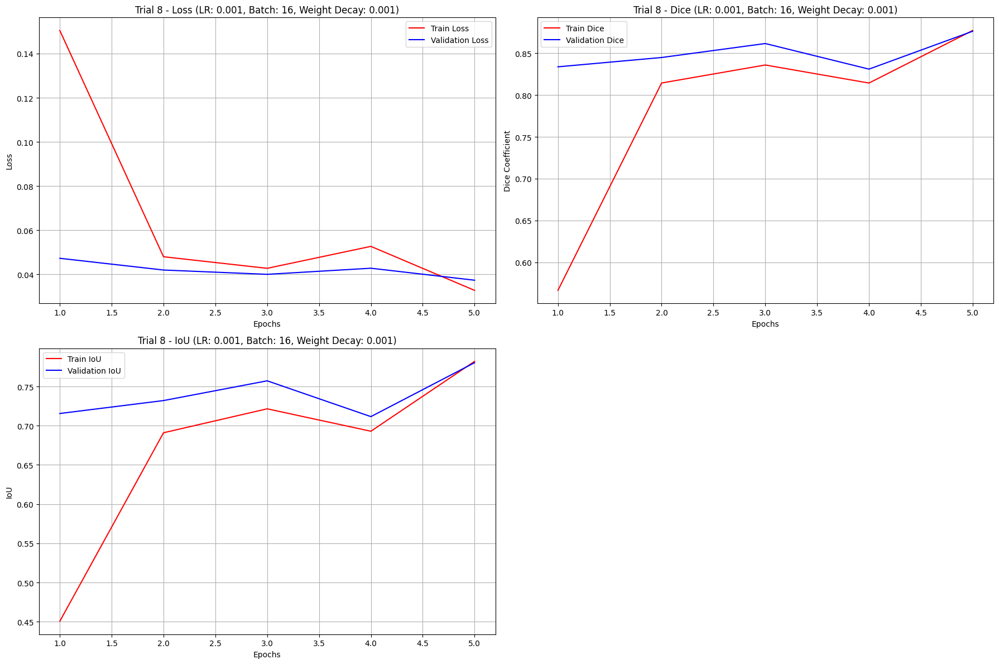



Trial 9/10 --> learning rate = 0.01, batch_size = 64, weight_decay = 0.0001


Epoch 1 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.77s/batch]

Training Loss: 1.1562


Epoch 1 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.69s/batch]

Training Loss: 706869888.0000


Epoch 1 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.68s/batch]

Training Loss: 2893.9917


Epoch 1 Training:  50%|█████     | 4/8 [00:14<00:14,  3.68s/batch]

Training Loss: 497.7705


Epoch 1 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.66s/batch]

Training Loss: 220.5119


Epoch 1 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.65s/batch]

Training Loss: 3.3793


Epoch 1 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.65s/batch]

Training Loss: 0.7122


Epoch 1 Training: 100%|██████████| 8/8 [00:29<00:00,  3.64s/batch]


Training Loss: 919.6523




Epoch 1 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.69s/batch]

Validation Loss: 154960.2656


Epoch 1 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.63s/batch]

Validation Loss: 154003.0156


Epoch 1 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.00s/batch]


Validation Loss: 155065.8281
Epoch 1, Validation Loss: 154550.1316, Validation Dice: 0.1056, Validation IoU: 0.0557




Epoch 2 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.64s/batch]

Training Loss: 154747.0625


Epoch 2 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.65s/batch]

Training Loss: 83.2183


Epoch 2 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.62s/batch]

Training Loss: 0.6740


Epoch 2 Training:  50%|█████     | 4/8 [00:14<00:14,  3.61s/batch]

Training Loss: 0.6719


Epoch 2 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.60s/batch]

Training Loss: 0.6692


Epoch 2 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.61s/batch]

Training Loss: 0.6648


Epoch 2 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.62s/batch]

Training Loss: 4.7403


Epoch 2 Training: 100%|██████████| 8/8 [00:28<00:00,  3.59s/batch]


Training Loss: 0.6571




Epoch 2 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.65s/batch]

Validation Loss: 0.6557


Epoch 2 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.64s/batch]

Validation Loss: 0.6560


Epoch 2 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.99s/batch]


Validation Loss: 0.6556
Epoch 2, Validation Loss: 0.6558, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 3 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.58s/batch]

Training Loss: 0.6557


Epoch 3 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.59s/batch]

Training Loss: 0.6519


Epoch 3 Training:  38%|███▊      | 3/8 [00:10<00:17,  3.59s/batch]

Training Loss: 0.6482


Epoch 3 Training:  50%|█████     | 4/8 [00:14<00:14,  3.59s/batch]

Training Loss: 0.6441


Epoch 3 Training:  62%|██████▎   | 5/8 [00:17<00:10,  3.59s/batch]

Training Loss: 0.6390


Epoch 3 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.61s/batch]

Training Loss: 0.6353


Epoch 3 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.63s/batch]

Training Loss: 0.6304


Epoch 3 Training: 100%|██████████| 8/8 [00:28<00:00,  3.59s/batch]


Training Loss: 0.6260




Epoch 3 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.63s/batch]

Validation Loss: 0.6225


Epoch 3 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.64s/batch]

Validation Loss: 0.6233


Epoch 3 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.00s/batch]


Validation Loss: 0.6226
Epoch 3, Validation Loss: 0.6229, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 4 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.60s/batch]

Training Loss: 0.6218


Epoch 4 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.58s/batch]

Training Loss: 0.6179


Epoch 4 Training:  38%|███▊      | 3/8 [00:10<00:17,  3.58s/batch]

Training Loss: 0.6131


Epoch 4 Training:  50%|█████     | 4/8 [00:14<00:14,  3.59s/batch]

Training Loss: 0.6090


Epoch 4 Training:  62%|██████▎   | 5/8 [00:17<00:10,  3.61s/batch]

Training Loss: 0.6045


Epoch 4 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.63s/batch]

Training Loss: 0.6001


Epoch 4 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.64s/batch]

Training Loss: 0.5970


Epoch 4 Training: 100%|██████████| 8/8 [00:28<00:00,  3.60s/batch]


Training Loss: 0.5931




Epoch 4 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.65s/batch]

Validation Loss: 0.5879


Epoch 4 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.65s/batch]

Validation Loss: 0.5891


Epoch 4 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.01s/batch]


Validation Loss: 0.5880
Epoch 4, Validation Loss: 0.5885, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 5 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.59s/batch]

Training Loss: 0.5882


Epoch 5 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.60s/batch]

Training Loss: 0.5831


Epoch 5 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.60s/batch]

Training Loss: 0.5790


Epoch 5 Training:  50%|█████     | 4/8 [00:14<00:14,  3.62s/batch]

Training Loss: 0.5739


Epoch 5 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.60s/batch]

Training Loss: 0.5715


Epoch 5 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.60s/batch]

Training Loss: 0.5675


Epoch 5 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.62s/batch]

Training Loss: 0.5619


Epoch 5 Training: 100%|██████████| 8/8 [00:28<00:00,  3.59s/batch]


Training Loss: 0.5592




Epoch 5 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.60s/batch]

Validation Loss: 0.5553


Epoch 5 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.64s/batch]

Validation Loss: 0.5570


Epoch 5 Validation: 100%|██████████| 3/3 [00:05<00:00,  2.00s/batch]


Validation Loss: 0.5555
Epoch 5, Validation Loss: 0.5561, Validation Dice: 0.0000, Validation IoU: 0.0000




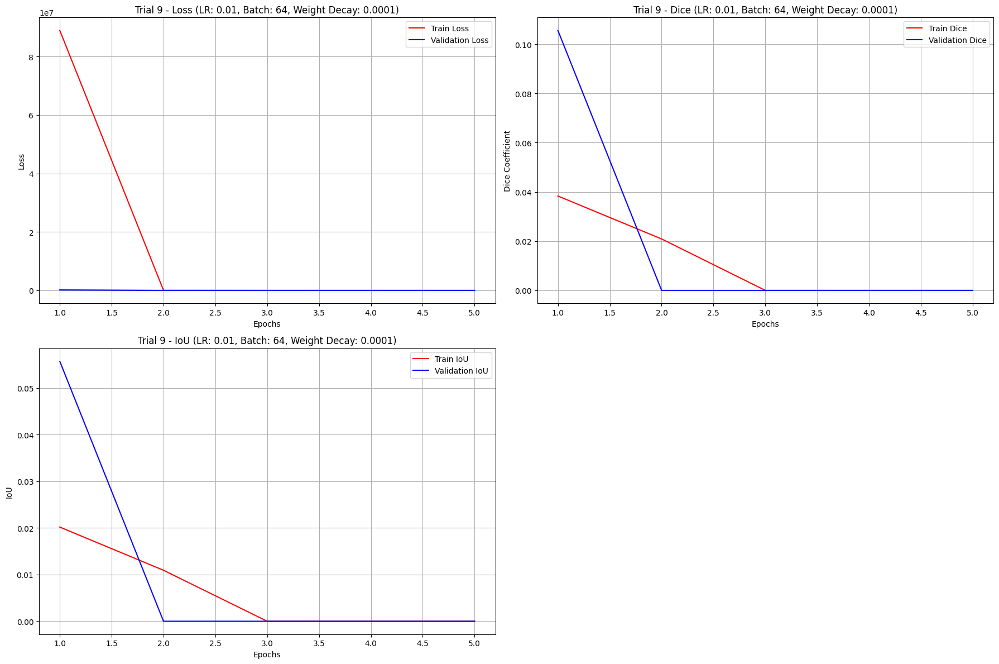



Trial 10/10 --> learning rate = 0.0001, batch_size = 64, weight_decay = 0.0001


Epoch 1 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.78s/batch]

Training Loss: 0.8007


Epoch 1 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.77s/batch]

Training Loss: 0.5156


Epoch 1 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.75s/batch]

Training Loss: 0.3789


Epoch 1 Training:  50%|█████     | 4/8 [00:15<00:15,  3.75s/batch]

Training Loss: 0.3218


Epoch 1 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.75s/batch]

Training Loss: 0.3131


Epoch 1 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.75s/batch]

Training Loss: 0.2789


Epoch 1 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.75s/batch]

Training Loss: 0.2598


Epoch 1 Training: 100%|██████████| 8/8 [00:29<00:00,  3.72s/batch]


Training Loss: 0.2685




Epoch 1 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.64s/batch]

Validation Loss: 0.2671


Epoch 1 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.65s/batch]

Validation Loss: 0.2813


Epoch 1 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.01s/batch]


Validation Loss: 0.2718
Epoch 1, Validation Loss: 0.2739, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 2 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.77s/batch]

Training Loss: 0.2654


Epoch 2 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.74s/batch]

Training Loss: 0.2575


Epoch 2 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.73s/batch]

Training Loss: 0.2291


Epoch 2 Training:  50%|█████     | 4/8 [00:14<00:14,  3.73s/batch]

Training Loss: 0.2197


Epoch 2 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Training Loss: 0.2054


Epoch 2 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.73s/batch]

Training Loss: 0.1937


Epoch 2 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.74s/batch]

Training Loss: 0.1637


Epoch 2 Training: 100%|██████████| 8/8 [00:29<00:00,  3.72s/batch]


Training Loss: 0.1851




Epoch 2 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.63s/batch]

Validation Loss: 0.1469


Epoch 2 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.63s/batch]

Validation Loss: 0.1514


Epoch 2 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.99s/batch]


Validation Loss: 0.1492
Epoch 2, Validation Loss: 0.1491, Validation Dice: 0.1681, Validation IoU: 0.0918




Epoch 3 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.80s/batch]

Training Loss: 0.1492


Epoch 3 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.75s/batch]

Training Loss: 0.1381


Epoch 3 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.74s/batch]

Training Loss: 0.1181


Epoch 3 Training:  50%|█████     | 4/8 [00:14<00:14,  3.72s/batch]

Training Loss: 0.1090


Epoch 3 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.72s/batch]

Training Loss: 0.0957


Epoch 3 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.73s/batch]

Training Loss: 0.0905


Epoch 3 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.72s/batch]

Training Loss: 0.0805


Epoch 3 Training: 100%|██████████| 8/8 [00:29<00:00,  3.71s/batch]


Training Loss: 0.0756




Epoch 3 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.70s/batch]

Validation Loss: 0.0822


Epoch 3 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.65s/batch]

Validation Loss: 0.0814


Epoch 3 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.01s/batch]


Validation Loss: 0.0858
Epoch 3, Validation Loss: 0.0823, Validation Dice: 0.7404, Validation IoU: 0.5882




Epoch 4 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.77s/batch]

Training Loss: 0.0783


Epoch 4 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.76s/batch]

Training Loss: 0.0837


Epoch 4 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.74s/batch]

Training Loss: 0.0828


Epoch 4 Training:  50%|█████     | 4/8 [00:14<00:14,  3.74s/batch]

Training Loss: 0.0602


Epoch 4 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.74s/batch]

Training Loss: 0.0619


Epoch 4 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.74s/batch]

Training Loss: 0.0803


Epoch 4 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.73s/batch]

Training Loss: 0.0610


Epoch 4 Training: 100%|██████████| 8/8 [00:29<00:00,  3.72s/batch]


Training Loss: 0.0607




Epoch 4 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.62s/batch]

Validation Loss: 0.0583


Epoch 4 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.60s/batch]

Validation Loss: 0.0574


Epoch 4 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.97s/batch]


Validation Loss: 0.0610
Epoch 4, Validation Loss: 0.0582, Validation Dice: 0.8091, Validation IoU: 0.6797




Epoch 5 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.67s/batch]

Training Loss: 0.0558


Epoch 5 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.71s/batch]

Training Loss: 0.0731


Epoch 5 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.70s/batch]

Training Loss: 0.1015


Epoch 5 Training:  50%|█████     | 4/8 [00:14<00:14,  3.71s/batch]

Training Loss: 0.0645


Epoch 5 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Training Loss: 0.0567


Epoch 5 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.74s/batch]

Training Loss: 0.0661


Epoch 5 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.73s/batch]

Training Loss: 0.0535


Epoch 5 Training: 100%|██████████| 8/8 [00:29<00:00,  3.70s/batch]


Training Loss: 0.0618




Epoch 5 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.64s/batch]

Validation Loss: 0.0637


Epoch 5 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.61s/batch]

Validation Loss: 0.0637


Epoch 5 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.98s/batch]


Validation Loss: 0.0666
Epoch 5, Validation Loss: 0.0640, Validation Dice: 0.8019, Validation IoU: 0.6695




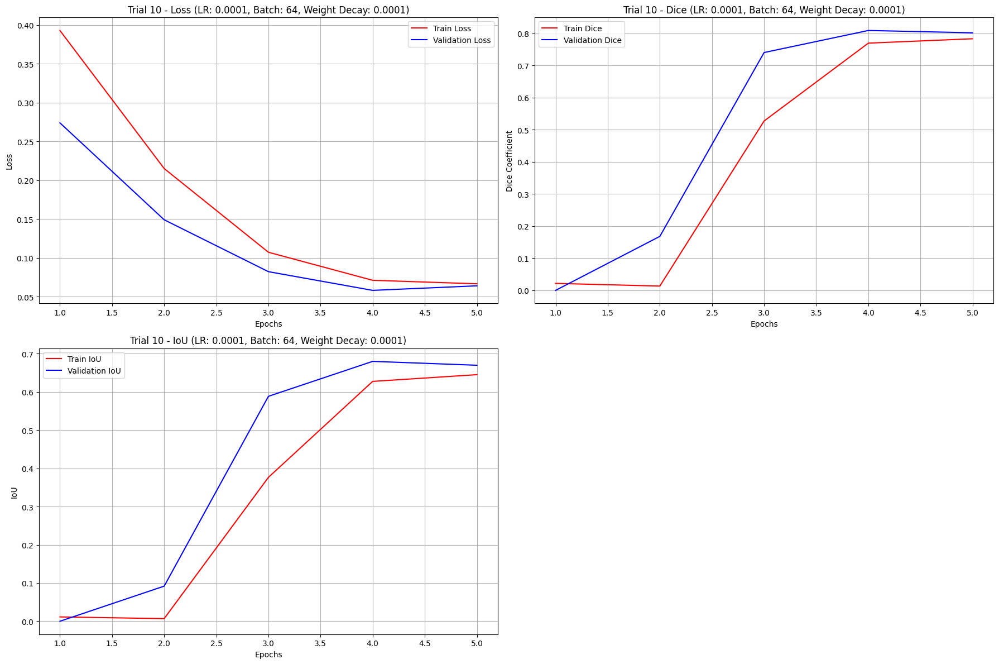



Best validation loss: 0.032022156078239966
Best params: learning rate = 0.001, batch size = 16, weight_decay = 0.001


In [ ]:
# Tuning degli iperparametri
best_params = hyperparameter_tuning(trainset, validationset, criterion, device)

TESTING...
Final test loss: 0.03726327932766966, Final test Dice: 0.8625, Final test IoU: 0.7590
ALCUNE PREDIZIONI CORRETTE 



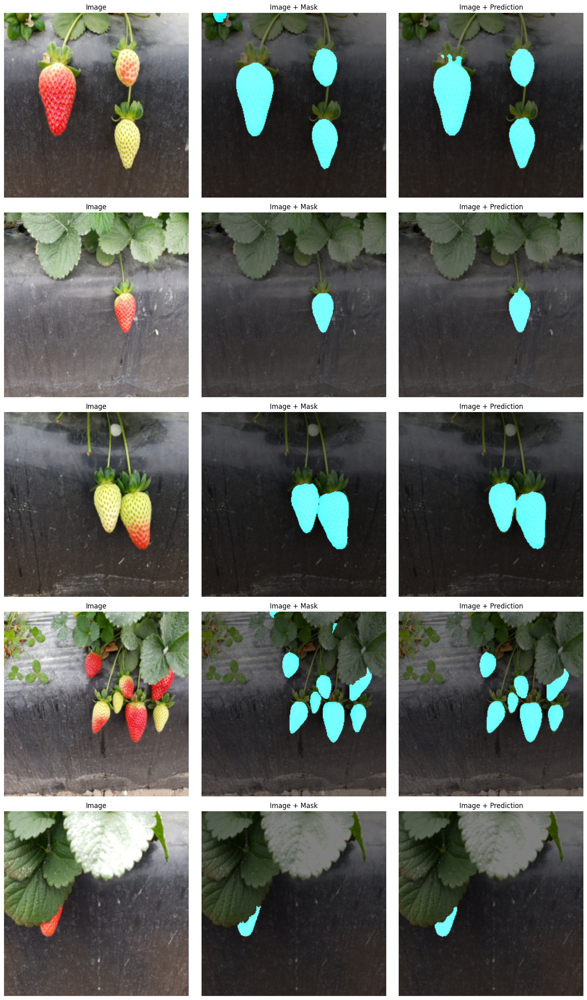

ALCUNE PREDIZIONI ERRATE 



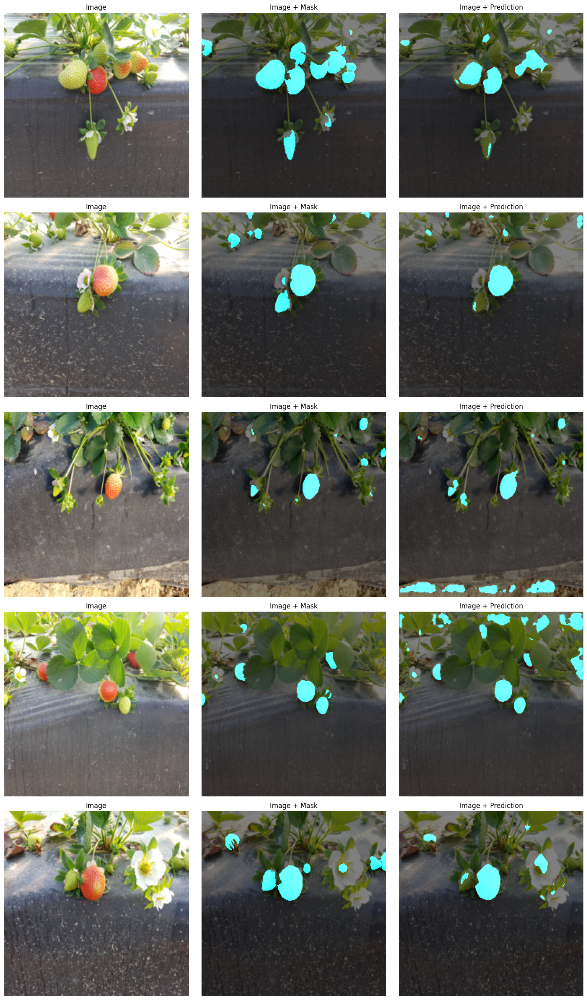

In [ ]:
# Caricamento miglior modello e failure analysis
model = UNet(in_channels=3, out_channels=1).to(device)
model.load_state_dict(torch.load('best_model_strawberry.pth', weights_only=True))

failure_analysis(model, criterion, testset, best_params, device)

# **TRANSFER LEARNING**

**NUOVO DATASET**

In [5]:
class TomatoDataset(Dataset):
    def __init__(self, image_dir, mask_dir, image_transform = None, mask_transform = None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_transform = image_transform
        self.mask_transform = mask_transform

        self.images = []
        self.masks = []

        for image in os.listdir(image_dir) :
            self.images.append(os.path.join(image_dir,image))
            self.masks.append(os.path.join(mask_dir,image))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = Image.open(self.images[idx]).convert("RGB")
        mask = Image.open(self.masks[idx]).convert("L")

        if self.image_transform:
            image = self.image_transform(image)

        if self.mask_transform:
            mask = self.mask_transform(mask)
            mask = (mask>0).float()

        return image, mask

**NUOVA FUNZIONE PER TUNING IPERPARAMETRI CON MODIFICA MODELLO**

In [ ]:
def hyperparameter_tuning_pretrained(trainset, validationset, criterion, device, num_trials=10, num_epochs=5):
    best_loss = float('inf')
    best_params = None
    best_model_wts = None

    #File pdf per salvare i grafici
    pdf_filename = 'tomato_hyperparameter_tuning.pdf'
    pdf_pages = PdfPages(pdf_filename)

    for trial in range(num_trials):
        lr, batch_size, weight_decay = random_hyperparameters()
        print(f'Trial {trial+1}/{num_trials} --> learning rate = {lr}, batch_size = {batch_size}, weight_decay = {weight_decay}')

        model = UNet(in_channels=3, out_channels=1)
        model.load_state_dict(torch.load('best_model_strawberry.pth', weights_only=True))
        model = model.to(device)

        optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

        train_loader = DataLoader(trainset, batch_size=batch_size, shuffle=True)
        validation_loader = DataLoader(validationset, batch_size=batch_size, shuffle=False)

        train_losses, val_losses, train_dice, val_dice, train_iou, val_iou = train_and_validate(model, train_loader, validation_loader, device, optimizer, criterion, num_epochs)

        bvloss = min(val_losses)
        if (bvloss < best_loss):
            best_loss = bvloss
            best_params = (lr, batch_size, weight_decay)
            best_model_wts = model.state_dict()

        #Rappresentazione grafica
        plt.figure(figsize=(14, 12))

        plt.subplot(2, 2, 1)
        plt.plot(range(1, num_epochs+1), train_losses, label='Train Loss', color='red')
        plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title(f'Trial {trial + 1} - Loss (LR: {lr}, Batch: {batch_size}, Weight Decay: {weight_decay})')
        plt.legend()
        plt.grid(True)

        plt.subplot(2, 2, 2)
        plt.plot(range(1, num_epochs+1), train_dice, label='Train Dice', color='red')
        plt.plot(range(1, num_epochs+1), val_dice, label='Validation Dice', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('Dice Coefficient')
        plt.title(f'Trial {trial + 1} - Dice (LR: {lr}, Batch: {batch_size}, Weight Decay: {weight_decay})')
        plt.legend()
        plt.grid(True)

        plt.subplot(2, 2, 3)
        plt.plot(range(1, num_epochs+1), train_iou, label='Train IoU', color='red')
        plt.plot(range(1, num_epochs+1), val_iou, label='Validation IoU', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('IoU')
        plt.title(f'Trial {trial + 1} - IoU (LR: {lr}, Batch: {batch_size}, Weight Decay: {weight_decay})')
        plt.legend()
        plt.grid(True)

        plt.tight_layout()

        pdf_pages.savefig()

        plt.show()

    pdf_pages.close()

    print(f'Best validation loss: {best_loss}')
    print(f'Best params: learning rate = {best_params[0]}, batch size = {best_params[1]}, weight_decay = {best_params[2]}')
    torch.save(best_model_wts, 'best_model_tomato.pth')

    return best_params

**MAIN TRANSFER LEARNING**

In [10]:
image_dir2 = '/content/drive/MyDrive/TomatoDataset/img'
mask_dir2 = '/content/drive/MyDrive/TomatoDataset/masks'

# Creazione dataset
dataset2 = TomatoDataset(image_dir=image_dir2, mask_dir=mask_dir2, image_transform=image_transform, mask_transform=mask_transform)

# Creazione trainset (70%), validationset (20%) e trainset (10%)
train_size2 = int(0.7 * len(dataset2))
validation_size2 = int(0.2 * len(dataset2))
test_size2 = len(dataset2) - train_size2 - validation_size2

trainset2, validationset2, testset2 = random_split(dataset2, [train_size2, validation_size2, test_size2])

criterion2 = nn.BCEWithLogitsLoss()

Trial 1/10 --> learning rate = 0.01, batch_size = 32, weight_decay = 0.0001


Epoch 1 Training:   7%|▋         | 1/15 [01:06<15:36, 66.88s/batch]

Training Loss: 0.4828


Epoch 1 Training:  13%|█▎        | 2/15 [02:11<14:08, 65.31s/batch]

Training Loss: 191.1600


Epoch 1 Training:  20%|██        | 3/15 [03:16<13:02, 65.19s/batch]

Training Loss: 169336.8125


Epoch 1 Training:  27%|██▋       | 4/15 [04:20<11:55, 65.06s/batch]

Training Loss: 20.8691


Epoch 1 Training:  33%|███▎      | 5/15 [05:24<10:46, 64.67s/batch]

Training Loss: 0.4148


Epoch 1 Training:  40%|████      | 6/15 [06:27<09:36, 64.02s/batch]

Training Loss: 788727.5000


Epoch 1 Training:  47%|████▋     | 7/15 [07:30<08:29, 63.74s/batch]

Training Loss: 156895.1562


Epoch 1 Training:  53%|█████▎    | 8/15 [08:34<07:26, 63.80s/batch]

Training Loss: 12820.7539


Epoch 1 Training:  60%|██████    | 9/15 [09:40<06:27, 64.52s/batch]

Training Loss: 919892.6250


Epoch 1 Training:  67%|██████▋   | 10/15 [10:44<05:21, 64.26s/batch]

Training Loss: 16235.3730


Epoch 1 Training:  73%|███████▎  | 11/15 [11:49<04:18, 64.57s/batch]

Training Loss: 117118.1953


Epoch 1 Training:  80%|████████  | 12/15 [12:52<03:12, 64.00s/batch]

Training Loss: 198585.5625


Epoch 1 Training:  87%|████████▋ | 13/15 [13:54<02:06, 63.36s/batch]

Training Loss: 0.6920


Epoch 1 Training:  93%|█████████▎| 14/15 [14:56<01:03, 63.07s/batch]

Training Loss: 1.1196


Epoch 1 Training: 100%|██████████| 15/15 [15:00<00:00, 60.04s/batch]


Training Loss: 0.6887




Epoch 1 Validation:  25%|██▌       | 1/4 [01:02<03:07, 62.46s/batch]

Validation Loss: 0.6861


Epoch 1 Validation:  50%|█████     | 2/4 [02:06<02:06, 63.26s/batch]

Validation Loss: 0.6862


Epoch 1 Validation:  75%|███████▌  | 3/4 [03:09<01:03, 63.40s/batch]

Validation Loss: 0.6865


Epoch 1 Validation: 100%|██████████| 4/4 [04:12<00:00, 63.21s/batch]


Validation Loss: 0.6860
Epoch 1, Validation Loss: 0.6862, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 2 Training:   7%|▋         | 1/15 [00:05<01:23,  5.99s/batch]

Training Loss: 0.6860


Epoch 2 Training:  13%|█▎        | 2/15 [00:11<01:16,  5.89s/batch]

Training Loss: 0.6838


Epoch 2 Training:  20%|██        | 3/15 [00:18<01:13,  6.11s/batch]

Training Loss: 289.4308


Epoch 2 Training:  27%|██▋       | 4/15 [00:24<01:08,  6.19s/batch]

Training Loss: 0.6770


Epoch 2 Training:  33%|███▎      | 5/15 [00:30<01:02,  6.24s/batch]

Training Loss: 0.6748


Epoch 2 Training:  40%|████      | 6/15 [00:37<00:56,  6.25s/batch]

Training Loss: 0.6715


Epoch 2 Training:  47%|████▋     | 7/15 [00:43<00:50,  6.28s/batch]

Training Loss: 0.6688


Epoch 2 Training:  53%|█████▎    | 8/15 [00:49<00:44,  6.29s/batch]

Training Loss: 0.6654


Epoch 2 Training:  60%|██████    | 9/15 [00:56<00:37,  6.31s/batch]

Training Loss: 0.6616


Epoch 2 Training:  67%|██████▋   | 10/15 [01:02<00:31,  6.30s/batch]

Training Loss: 0.6578


Epoch 2 Training:  73%|███████▎  | 11/15 [01:08<00:25,  6.32s/batch]

Training Loss: 0.6517


Epoch 2 Training:  80%|████████  | 12/15 [01:15<00:18,  6.33s/batch]

Training Loss: 0.6479


Epoch 2 Training:  87%|████████▋ | 13/15 [01:21<00:12,  6.32s/batch]

Training Loss: 109487264.0000


Epoch 2 Training:  93%|█████████▎| 14/15 [01:27<00:06,  6.32s/batch]

Training Loss: 0.6451


Epoch 2 Training: 100%|██████████| 15/15 [01:28<00:00,  5.88s/batch]


Training Loss: 0.6389




Epoch 2 Validation:  25%|██▌       | 1/4 [00:05<00:15,  5.24s/batch]

Validation Loss: 0.6346


Epoch 2 Validation:  50%|█████     | 2/4 [00:11<00:11,  5.57s/batch]

Validation Loss: 0.6355


Epoch 2 Validation:  75%|███████▌  | 3/4 [00:16<00:05,  5.68s/batch]

Validation Loss: 0.6380


Epoch 2 Validation: 100%|██████████| 4/4 [00:22<00:00,  5.69s/batch]


Validation Loss: 0.6332
Epoch 2, Validation Loss: 0.6353, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 3 Training:   7%|▋         | 1/15 [00:05<01:23,  5.93s/batch]

Training Loss: 0.6359


Epoch 3 Training:  13%|█▎        | 2/15 [00:12<01:20,  6.16s/batch]

Training Loss: 0.6329


Epoch 3 Training:  20%|██        | 3/15 [00:18<01:14,  6.24s/batch]

Training Loss: 0.6327


Epoch 3 Training:  27%|██▋       | 4/15 [00:24<01:09,  6.31s/batch]

Training Loss: 148188.5312


Epoch 3 Training:  33%|███▎      | 5/15 [00:31<01:03,  6.33s/batch]

Training Loss: 177883.7812


Epoch 3 Training:  40%|████      | 6/15 [00:37<00:57,  6.37s/batch]

Training Loss: 116.6214


Epoch 3 Training:  47%|████▋     | 7/15 [00:44<00:50,  6.36s/batch]

Training Loss: 10.2821


Epoch 3 Training:  53%|█████▎    | 8/15 [00:50<00:44,  6.37s/batch]

Training Loss: 274379.3438


Epoch 3 Training:  60%|██████    | 9/15 [00:56<00:38,  6.38s/batch]

Training Loss: 0.6114


Epoch 3 Training:  67%|██████▋   | 10/15 [01:03<00:32,  6.41s/batch]

Training Loss: 0.6086


Epoch 3 Training:  73%|███████▎  | 11/15 [01:09<00:25,  6.39s/batch]

Training Loss: 0.6428


Epoch 3 Training:  80%|████████  | 12/15 [01:16<00:19,  6.39s/batch]

Training Loss: 0.6093


Epoch 3 Training:  87%|████████▋ | 13/15 [01:22<00:12,  6.39s/batch]

Training Loss: 0.6014


Epoch 3 Training:  93%|█████████▎| 14/15 [01:28<00:06,  6.39s/batch]

Training Loss: 343484.2500


Epoch 3 Training: 100%|██████████| 15/15 [01:29<00:00,  5.96s/batch]


Training Loss: 0.5860




Epoch 3 Validation:  25%|██▌       | 1/4 [00:05<00:15,  5.27s/batch]

Validation Loss: 43551.6250


Epoch 3 Validation:  50%|█████     | 2/4 [00:11<00:11,  5.62s/batch]

Validation Loss: 42541.3789


Epoch 3 Validation:  75%|███████▌  | 3/4 [00:16<00:05,  5.70s/batch]

Validation Loss: 43420.2969


Epoch 3 Validation: 100%|██████████| 4/4 [00:22<00:00,  5.71s/batch]


Validation Loss: 42798.4688
Epoch 3, Validation Loss: 43077.9424, Validation Dice: 0.0016, Validation IoU: 0.0008




Epoch 4 Training:   7%|▋         | 1/15 [00:05<01:23,  5.99s/batch]

Training Loss: 42216.8516


Epoch 4 Training:  13%|█▎        | 2/15 [00:11<01:17,  5.95s/batch]

Training Loss: 0.5879


Epoch 4 Training:  20%|██        | 3/15 [00:18<01:14,  6.18s/batch]

Training Loss: 0.5909


Epoch 4 Training:  27%|██▋       | 4/15 [00:24<01:08,  6.24s/batch]

Training Loss: 0.5962


Epoch 4 Training:  33%|███▎      | 5/15 [00:30<01:02,  6.26s/batch]

Training Loss: 0.5877


Epoch 4 Training:  40%|████      | 6/15 [00:37<00:56,  6.31s/batch]

Training Loss: 0.5889


Epoch 4 Training:  47%|████▋     | 7/15 [00:43<00:50,  6.32s/batch]

Training Loss: 0.5827


Epoch 4 Training:  53%|█████▎    | 8/15 [00:50<00:44,  6.35s/batch]

Training Loss: 0.5789


Epoch 4 Training:  60%|██████    | 9/15 [00:56<00:38,  6.35s/batch]

Training Loss: 0.5808


Epoch 4 Training:  67%|██████▋   | 10/15 [01:02<00:31,  6.35s/batch]

Training Loss: 0.5706


Epoch 4 Training:  73%|███████▎  | 11/15 [01:09<00:25,  6.37s/batch]

Training Loss: 0.5701


Epoch 4 Training:  80%|████████  | 12/15 [01:15<00:19,  6.40s/batch]

Training Loss: 0.5722


Epoch 4 Training:  87%|████████▋ | 13/15 [01:22<00:12,  6.41s/batch]

Training Loss: 0.5685


Epoch 4 Training:  93%|█████████▎| 14/15 [01:28<00:06,  6.41s/batch]

Training Loss: 0.5668


Epoch 4 Training: 100%|██████████| 15/15 [01:28<00:00,  5.93s/batch]


Training Loss: 0.5396




Epoch 4 Validation:  25%|██▌       | 1/4 [00:05<00:15,  5.29s/batch]

Validation Loss: 0.5542


Epoch 4 Validation:  50%|█████     | 2/4 [00:11<00:11,  5.65s/batch]

Validation Loss: 0.5857


Epoch 4 Validation:  75%|███████▌  | 3/4 [00:16<00:05,  5.71s/batch]

Validation Loss: 0.6269


Epoch 4 Validation: 100%|██████████| 4/4 [00:22<00:00,  5.73s/batch]


Validation Loss: 0.5504
Epoch 4, Validation Loss: 0.5793, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 5 Training:   7%|▋         | 1/15 [00:05<01:23,  5.95s/batch]

Training Loss: 0.6085


Epoch 5 Training:  13%|█▎        | 2/15 [00:12<01:20,  6.20s/batch]

Training Loss: 0.5532


Epoch 5 Training:  20%|██        | 3/15 [00:19<01:17,  6.47s/batch]

Training Loss: 0.5530


Epoch 5 Training:  27%|██▋       | 4/15 [00:25<01:11,  6.48s/batch]

Training Loss: 0.5460


Epoch 5 Training:  33%|███▎      | 5/15 [00:31<01:04,  6.42s/batch]

Training Loss: 0.5453


Epoch 5 Training:  40%|████      | 6/15 [00:38<00:57,  6.42s/batch]

Training Loss: 0.5451


Epoch 5 Training:  47%|████▋     | 7/15 [00:44<00:51,  6.41s/batch]

Training Loss: 0.5432


Epoch 5 Training:  53%|█████▎    | 8/15 [00:51<00:44,  6.39s/batch]

Training Loss: 0.5367


Epoch 5 Training:  60%|██████    | 9/15 [00:57<00:38,  6.39s/batch]

Training Loss: 0.5404


Epoch 5 Training:  67%|██████▋   | 10/15 [01:03<00:31,  6.39s/batch]

Training Loss: 0.5363


Epoch 5 Training:  73%|███████▎  | 11/15 [01:10<00:25,  6.37s/batch]

Training Loss: 0.5320


Epoch 5 Training:  80%|████████  | 12/15 [01:16<00:19,  6.40s/batch]

Training Loss: 0.5397


Epoch 5 Training:  87%|████████▋ | 13/15 [01:23<00:12,  6.40s/batch]

Training Loss: 0.5254


Epoch 5 Training:  93%|█████████▎| 14/15 [01:29<00:06,  6.40s/batch]

Training Loss: 0.5264


Epoch 5 Training: 100%|██████████| 15/15 [01:29<00:00,  5.99s/batch]


Training Loss: 0.5369




Epoch 5 Validation:  25%|██▌       | 1/4 [00:05<00:15,  5.30s/batch]

Validation Loss: 0.5166


Epoch 5 Validation:  50%|█████     | 2/4 [00:11<00:11,  5.63s/batch]

Validation Loss: 0.5197


Epoch 5 Validation:  75%|███████▌  | 3/4 [00:16<00:05,  5.71s/batch]

Validation Loss: 0.5284


Epoch 5 Validation: 100%|██████████| 4/4 [00:22<00:00,  5.73s/batch]


Validation Loss: 0.5115
Epoch 5, Validation Loss: 0.5190, Validation Dice: 0.0000, Validation IoU: 0.0000




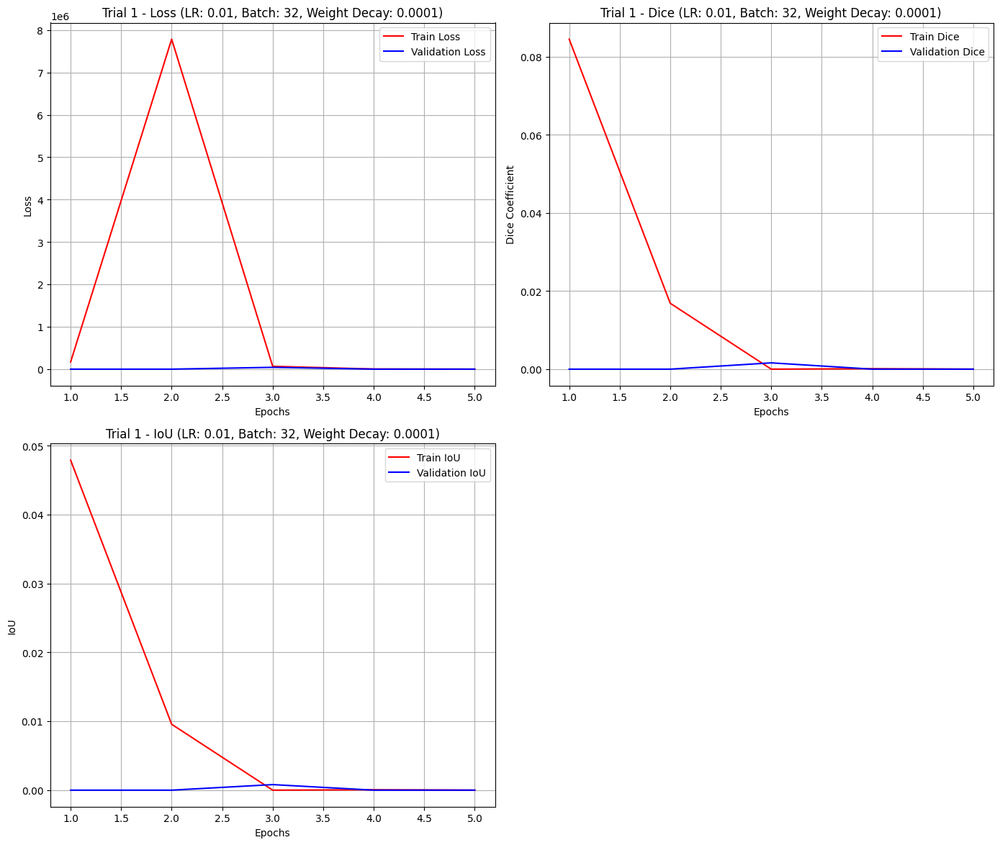

Trial 2/10 --> learning rate = 0.01, batch_size = 64, weight_decay = 0.001


Epoch 1 Training:  12%|█▎        | 1/8 [00:12<01:25, 12.16s/batch]

Training Loss: 0.5522


Epoch 1 Training:  25%|██▌       | 2/8 [00:25<01:15, 12.59s/batch]

Training Loss: 181.9317


Epoch 1 Training:  38%|███▊      | 3/8 [00:39<01:06, 13.21s/batch]

Training Loss: 4105.8853


Epoch 1 Training:  50%|█████     | 4/8 [00:51<00:51, 12.99s/batch]

Training Loss: 0.4285


Epoch 1 Training:  62%|██████▎   | 5/8 [01:05<00:39, 13.32s/batch]

Training Loss: 0.7654


Epoch 1 Training:  75%|███████▌  | 6/8 [01:18<00:26, 13.09s/batch]

Training Loss: 38.2851


Epoch 1 Training:  88%|████████▊ | 7/8 [01:30<00:12, 12.96s/batch]

Training Loss: 4.6914


Epoch 1 Training: 100%|██████████| 8/8 [01:31<00:00, 11.42s/batch]


Training Loss: 391.1672




Epoch 1 Validation:  50%|█████     | 1/2 [00:11<00:11, 11.26s/batch]

Validation Loss: 0.6419


Epoch 1 Validation: 100%|██████████| 2/2 [00:23<00:00, 11.72s/batch]


Validation Loss: 0.6541
Epoch 1, Validation Loss: 0.6480, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 2 Training:  12%|█▎        | 1/8 [00:12<01:28, 12.69s/batch]

Training Loss: 0.6501


Epoch 2 Training:  25%|██▌       | 2/8 [00:25<01:16, 12.71s/batch]

Training Loss: 31.9634


Epoch 2 Training:  38%|███▊      | 3/8 [00:39<01:06, 13.29s/batch]

Training Loss: 1517.8331


Epoch 2 Training:  50%|█████     | 4/8 [00:52<00:52, 13.05s/batch]

Training Loss: 298.6583


Epoch 2 Training:  62%|██████▎   | 5/8 [01:06<00:40, 13.37s/batch]

Training Loss: 43.0456


Epoch 2 Training:  75%|███████▌  | 6/8 [01:18<00:26, 13.13s/batch]

Training Loss: 2.0187


Epoch 2 Training:  88%|████████▊ | 7/8 [01:32<00:13, 13.38s/batch]

Training Loss: 0.8519


Epoch 2 Training: 100%|██████████| 8/8 [01:32<00:00, 11.62s/batch]


Training Loss: 80.3595




Epoch 2 Validation:  50%|█████     | 1/2 [00:11<00:11, 11.10s/batch]

Validation Loss: 1483.2026


Epoch 2 Validation: 100%|██████████| 2/2 [00:22<00:00, 11.35s/batch]


Validation Loss: 1478.2679
Epoch 2, Validation Loss: 1480.7353, Validation Dice: 0.2201, Validation IoU: 0.1237




Epoch 3 Training:  12%|█▎        | 1/8 [00:12<01:25, 12.24s/batch]

Training Loss: 1488.9077


Epoch 3 Training:  25%|██▌       | 2/8 [00:25<01:15, 12.56s/batch]

Training Loss: 58.7183


Epoch 3 Training:  38%|███▊      | 3/8 [00:38<01:04, 12.85s/batch]

Training Loss: 193951.7344


Epoch 3 Training:  50%|█████     | 4/8 [00:51<00:51, 12.84s/batch]

Training Loss: 3011079.0000


Epoch 3 Training:  62%|██████▎   | 5/8 [01:03<00:38, 12.78s/batch]

Training Loss: 41044.4844


Epoch 3 Training:  75%|███████▌  | 6/8 [01:17<00:26, 13.18s/batch]

Training Loss: 13832.2676


Epoch 3 Training:  88%|████████▊ | 7/8 [01:30<00:13, 13.01s/batch]

Training Loss: 5714.8359


Epoch 3 Training: 100%|██████████| 8/8 [01:30<00:00, 11.34s/batch]


Training Loss: 28376.2930




Epoch 3 Validation:  50%|█████     | 1/2 [00:11<00:11, 11.13s/batch]

Validation Loss: 2991.0742


Epoch 3 Validation: 100%|██████████| 2/2 [00:22<00:00, 11.38s/batch]


Validation Loss: 3020.9980
Epoch 3, Validation Loss: 3006.0361, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 4 Training:  12%|█▎        | 1/8 [00:11<01:23, 11.98s/batch]

Training Loss: 3091.2915


Epoch 4 Training:  25%|██▌       | 2/8 [00:24<01:14, 12.34s/batch]

Training Loss: 43574.2578


Epoch 4 Training:  38%|███▊      | 3/8 [00:37<01:03, 12.66s/batch]

Training Loss: 257669.0938


Epoch 4 Training:  50%|█████     | 4/8 [00:49<00:49, 12.49s/batch]

Training Loss: 56904.8984


Epoch 4 Training:  62%|██████▎   | 5/8 [01:01<00:36, 12.19s/batch]

Training Loss: 96.7475


Epoch 4 Training:  75%|███████▌  | 6/8 [01:15<00:25, 12.70s/batch]

Training Loss: 243686.0156


Epoch 4 Training:  88%|████████▊ | 7/8 [01:27<00:12, 12.68s/batch]

Training Loss: 627.6625


Epoch 4 Training: 100%|██████████| 8/8 [01:28<00:00, 11.03s/batch]


Training Loss: 16713.6641




Epoch 4 Validation:  50%|█████     | 1/2 [00:11<00:11, 11.00s/batch]

Validation Loss: 272.3916


Epoch 4 Validation: 100%|██████████| 2/2 [00:22<00:00, 11.29s/batch]


Validation Loss: 277.2629
Epoch 4, Validation Loss: 274.8273, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 5 Training:  12%|█▎        | 1/8 [00:11<01:22, 11.84s/batch]

Training Loss: 266.1875


Epoch 5 Training:  25%|██▌       | 2/8 [00:25<01:15, 12.64s/batch]

Training Loss: 464756.0000


Epoch 5 Training:  38%|███▊      | 3/8 [00:38<01:04, 12.97s/batch]

Training Loss: 6103.7812


Epoch 5 Training:  50%|█████     | 4/8 [00:50<00:50, 12.69s/batch]

Training Loss: 4393.5439


Epoch 5 Training:  62%|██████▎   | 5/8 [01:04<00:38, 13.00s/batch]

Training Loss: 892.3193


Epoch 5 Training:  75%|███████▌  | 6/8 [01:16<00:25, 12.84s/batch]

Training Loss: 192.8141


Epoch 5 Training:  88%|████████▊ | 7/8 [01:29<00:12, 12.75s/batch]

Training Loss: 0.7276


Epoch 5 Training: 100%|██████████| 8/8 [01:29<00:00, 11.22s/batch]


Training Loss: 0.7144




Epoch 5 Validation:  50%|█████     | 1/2 [00:10<00:10, 10.98s/batch]

Validation Loss: 0.7092


Epoch 5 Validation: 100%|██████████| 2/2 [00:22<00:00, 11.24s/batch]


Validation Loss: 0.7091
Epoch 5, Validation Loss: 0.7091, Validation Dice: 0.2201, Validation IoU: 0.1237




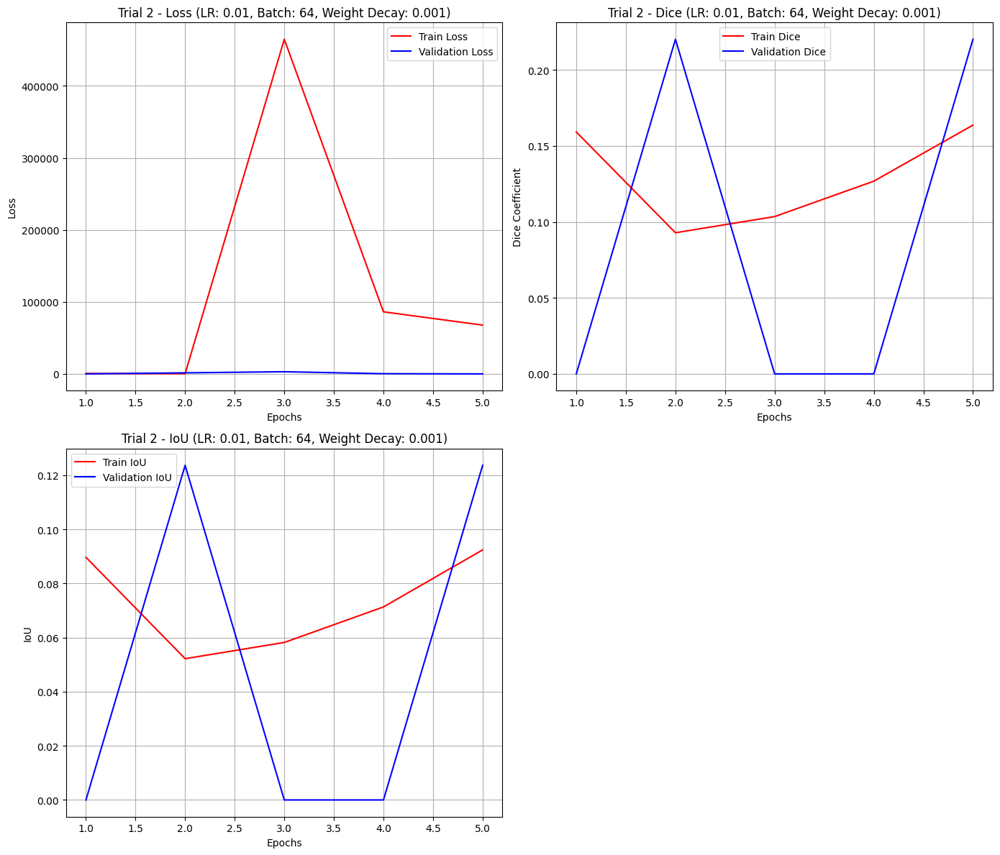

Trial 3/10 --> learning rate = 0.0001, batch_size = 32, weight_decay = 0.0001


Epoch 1 Training:   7%|▋         | 1/15 [00:05<01:20,  5.74s/batch]

Training Loss: 0.5731


Epoch 1 Training:  13%|█▎        | 2/15 [00:12<01:21,  6.29s/batch]

Training Loss: 0.4461


Epoch 1 Training:  20%|██        | 3/15 [00:19<01:18,  6.56s/batch]

Training Loss: 0.4493


Epoch 1 Training:  27%|██▋       | 4/15 [00:25<01:08,  6.26s/batch]

Training Loss: 0.4879


Epoch 1 Training:  33%|███▎      | 5/15 [00:31<01:04,  6.40s/batch]

Training Loss: 0.4032


Epoch 1 Training:  40%|████      | 6/15 [00:38<00:58,  6.52s/batch]

Training Loss: 0.3954


Epoch 1 Training:  47%|████▋     | 7/15 [00:44<00:50,  6.33s/batch]

Training Loss: 0.4183


Epoch 1 Training:  53%|█████▎    | 8/15 [00:51<00:44,  6.43s/batch]

Training Loss: 0.3571


Epoch 1 Training:  60%|██████    | 9/15 [00:57<00:39,  6.55s/batch]

Training Loss: 0.3608


Epoch 1 Training:  67%|██████▋   | 10/15 [01:03<00:31,  6.30s/batch]

Training Loss: 0.2799


Epoch 1 Training:  73%|███████▎  | 11/15 [01:10<00:25,  6.46s/batch]

Training Loss: 0.3581


Epoch 1 Training:  80%|████████  | 12/15 [01:17<00:19,  6.49s/batch]

Training Loss: 0.3244


Epoch 1 Training:  87%|████████▋ | 13/15 [01:22<00:12,  6.29s/batch]

Training Loss: 0.3604


Epoch 1 Training:  93%|█████████▎| 14/15 [01:29<00:06,  6.39s/batch]

Training Loss: 0.3407


Epoch 1 Training: 100%|██████████| 15/15 [01:29<00:00,  5.99s/batch]


Training Loss: 0.4423




Epoch 1 Validation:  25%|██▌       | 1/4 [00:05<00:15,  5.22s/batch]

Validation Loss: 0.2927


Epoch 1 Validation:  50%|█████     | 2/4 [00:11<00:11,  5.81s/batch]

Validation Loss: 0.3309


Epoch 1 Validation:  75%|███████▌  | 3/4 [00:17<00:06,  6.03s/batch]

Validation Loss: 0.3854


Epoch 1 Validation: 100%|██████████| 4/4 [00:22<00:00,  5.74s/batch]


Validation Loss: 0.2875
Epoch 1, Validation Loss: 0.3241, Validation Dice: 0.3014, Validation IoU: 0.1789




Epoch 2 Training:   7%|▋         | 1/15 [00:05<01:20,  5.77s/batch]

Training Loss: 0.3023


Epoch 2 Training:  13%|█▎        | 2/15 [00:12<01:21,  6.30s/batch]

Training Loss: 0.3348


Epoch 2 Training:  20%|██        | 3/15 [00:19<01:18,  6.57s/batch]

Training Loss: 0.3343


Epoch 2 Training:  27%|██▋       | 4/15 [00:25<01:09,  6.28s/batch]

Training Loss: 0.3151


Epoch 2 Training:  33%|███▎      | 5/15 [00:32<01:05,  6.54s/batch]

Training Loss: 0.3423


Epoch 2 Training:  40%|████      | 6/15 [00:38<00:59,  6.59s/batch]

Training Loss: 0.3158


Epoch 2 Training:  47%|████▋     | 7/15 [00:44<00:51,  6.38s/batch]

Training Loss: 0.3360


Epoch 2 Training:  53%|█████▎    | 8/15 [00:51<00:45,  6.52s/batch]

Training Loss: 0.3098


Epoch 2 Training:  60%|██████    | 9/15 [00:57<00:37,  6.28s/batch]

Training Loss: 0.3038


Epoch 2 Training:  67%|██████▋   | 10/15 [01:03<00:31,  6.35s/batch]

Training Loss: 0.3173


Epoch 2 Training:  73%|███████▎  | 11/15 [01:10<00:25,  6.39s/batch]

Training Loss: 0.3254


Epoch 2 Training:  80%|████████  | 12/15 [01:16<00:19,  6.38s/batch]

Training Loss: 0.3038


Epoch 2 Training:  87%|████████▋ | 13/15 [01:23<00:12,  6.48s/batch]

Training Loss: 0.3156


Epoch 2 Training:  93%|█████████▎| 14/15 [01:30<00:06,  6.56s/batch]

Training Loss: 0.3514


Epoch 2 Training: 100%|██████████| 15/15 [01:30<00:00,  6.04s/batch]


Training Loss: 0.4956




Epoch 2 Validation:  25%|██▌       | 1/4 [00:05<00:15,  5.17s/batch]

Validation Loss: 0.2872


Epoch 2 Validation:  50%|█████     | 2/4 [00:11<00:11,  5.64s/batch]

Validation Loss: 0.3195


Epoch 2 Validation:  75%|███████▌  | 3/4 [00:17<00:05,  5.76s/batch]

Validation Loss: 0.3698


Epoch 2 Validation: 100%|██████████| 4/4 [00:22<00:00,  5.72s/batch]


Validation Loss: 0.2764
Epoch 2, Validation Loss: 0.3132, Validation Dice: 0.3066, Validation IoU: 0.1824




Epoch 3 Training:   7%|▋         | 1/15 [00:06<01:28,  6.34s/batch]

Training Loss: 0.3431


Epoch 3 Training:  13%|█▎        | 2/15 [00:13<01:25,  6.55s/batch]

Training Loss: 0.3230


Epoch 3 Training:  20%|██        | 3/15 [00:19<01:17,  6.44s/batch]

Training Loss: 0.3414


Epoch 3 Training:  27%|██▋       | 4/15 [00:25<01:10,  6.41s/batch]

Training Loss: 0.2773


Epoch 3 Training:  33%|███▎      | 5/15 [00:32<01:05,  6.60s/batch]

Training Loss: 0.3346


Epoch 3 Training:  40%|████      | 6/15 [00:39<01:00,  6.69s/batch]

Training Loss: 0.3243


Epoch 3 Training:  47%|████▋     | 7/15 [00:45<00:50,  6.37s/batch]

Training Loss: 0.2955


Epoch 3 Training:  53%|█████▎    | 8/15 [00:51<00:45,  6.45s/batch]

Training Loss: 0.3068


Epoch 3 Training:  60%|██████    | 9/15 [00:58<00:38,  6.47s/batch]

Training Loss: 0.3322


Epoch 3 Training:  67%|██████▋   | 10/15 [01:04<00:32,  6.42s/batch]

Training Loss: 0.3295


Epoch 3 Training:  73%|███████▎  | 11/15 [01:11<00:25,  6.49s/batch]

Training Loss: 0.2982


Epoch 3 Training:  80%|████████  | 12/15 [01:18<00:19,  6.59s/batch]

Training Loss: 0.3365


Epoch 3 Training:  87%|████████▋ | 13/15 [01:24<00:12,  6.38s/batch]

Training Loss: 0.2669


Epoch 3 Training:  93%|█████████▎| 14/15 [01:30<00:06,  6.53s/batch]

Training Loss: 0.3207


Epoch 3 Training: 100%|██████████| 15/15 [01:31<00:00,  6.09s/batch]


Training Loss: 0.2930




Epoch 3 Validation:  25%|██▌       | 1/4 [00:05<00:15,  5.23s/batch]

Validation Loss: 0.2805


Epoch 3 Validation:  50%|█████     | 2/4 [00:11<00:11,  5.74s/batch]

Validation Loss: 0.3151


Epoch 3 Validation:  75%|███████▌  | 3/4 [00:17<00:06,  6.01s/batch]

Validation Loss: 0.3647


Epoch 3 Validation: 100%|██████████| 4/4 [00:22<00:00,  5.73s/batch]


Validation Loss: 0.2678
Epoch 3, Validation Loss: 0.3070, Validation Dice: 0.3545, Validation IoU: 0.2171




Epoch 4 Training:   7%|▋         | 1/15 [00:05<01:21,  5.84s/batch]

Training Loss: 0.2854


Epoch 4 Training:  13%|█▎        | 2/15 [00:11<01:15,  5.83s/batch]

Training Loss: 0.3091


Epoch 4 Training:  20%|██        | 3/15 [00:18<01:12,  6.08s/batch]

Training Loss: 0.3305


Epoch 4 Training:  27%|██▋       | 4/15 [00:24<01:09,  6.31s/batch]

Training Loss: 0.3010


Epoch 4 Training:  33%|███▎      | 5/15 [00:30<01:02,  6.28s/batch]

Training Loss: 0.3145


Epoch 4 Training:  40%|████      | 6/15 [00:37<00:56,  6.31s/batch]

Training Loss: 0.3162


Epoch 4 Training:  47%|████▋     | 7/15 [00:44<00:51,  6.47s/batch]

Training Loss: 0.3168


Epoch 4 Training:  53%|█████▎    | 8/15 [00:49<00:43,  6.25s/batch]

Training Loss: 0.3135


Epoch 4 Training:  60%|██████    | 9/15 [00:56<00:38,  6.40s/batch]

Training Loss: 0.2848


Epoch 4 Training:  67%|██████▋   | 10/15 [01:03<00:32,  6.43s/batch]

Training Loss: 0.3233


Epoch 4 Training:  73%|███████▎  | 11/15 [01:08<00:24,  6.24s/batch]

Training Loss: 0.2977


Epoch 4 Training:  80%|████████  | 12/15 [01:15<00:19,  6.38s/batch]

Training Loss: 0.2942


Epoch 4 Training:  87%|████████▋ | 13/15 [01:22<00:12,  6.41s/batch]

Training Loss: 0.3364


Epoch 4 Training:  93%|█████████▎| 14/15 [01:28<00:06,  6.38s/batch]

Training Loss: 0.3332


Epoch 4 Training: 100%|██████████| 15/15 [01:28<00:00,  5.92s/batch]


Training Loss: 0.2165




Epoch 4 Validation:  25%|██▌       | 1/4 [00:05<00:17,  5.80s/batch]

Validation Loss: 0.2767


Epoch 4 Validation:  50%|█████     | 2/4 [00:11<00:11,  5.97s/batch]

Validation Loss: 0.3104


Epoch 4 Validation:  75%|███████▌  | 3/4 [00:17<00:05,  6.00s/batch]

Validation Loss: 0.3622


Epoch 4 Validation: 100%|██████████| 4/4 [00:23<00:00,  5.79s/batch]


Validation Loss: 0.2589
Epoch 4, Validation Loss: 0.3021, Validation Dice: 0.3744, Validation IoU: 0.2323




Epoch 5 Training:   7%|▋         | 1/15 [00:06<01:28,  6.34s/batch]

Training Loss: 0.2750


Epoch 5 Training:  13%|█▎        | 2/15 [00:13<01:26,  6.66s/batch]

Training Loss: 0.2955


Epoch 5 Training:  20%|██        | 3/15 [00:19<01:19,  6.66s/batch]

Training Loss: 0.2699


Epoch 5 Training:  27%|██▋       | 4/15 [00:25<01:09,  6.31s/batch]

Training Loss: 0.2912


Epoch 5 Training:  33%|███▎      | 5/15 [00:32<01:03,  6.39s/batch]

Training Loss: 0.3003


Epoch 5 Training:  40%|████      | 6/15 [00:39<00:59,  6.62s/batch]

Training Loss: 0.2860


Epoch 5 Training:  47%|████▋     | 7/15 [00:45<00:52,  6.52s/batch]

Training Loss: 0.3328


Epoch 5 Training:  53%|█████▎    | 8/15 [00:52<00:45,  6.55s/batch]

Training Loss: 0.3139


Epoch 5 Training:  60%|██████    | 9/15 [00:58<00:39,  6.52s/batch]

Training Loss: 0.2895


Epoch 5 Training:  67%|██████▋   | 10/15 [01:04<00:32,  6.46s/batch]

Training Loss: 0.3031


Epoch 5 Training:  73%|███████▎  | 11/15 [01:11<00:26,  6.60s/batch]

Training Loss: 0.3139


Epoch 5 Training:  80%|████████  | 12/15 [01:18<00:20,  6.75s/batch]

Training Loss: 0.3390


Epoch 5 Training:  87%|████████▋ | 13/15 [01:24<00:12,  6.46s/batch]

Training Loss: 0.2972


Epoch 5 Training:  93%|█████████▎| 14/15 [01:31<00:06,  6.63s/batch]

Training Loss: 0.3521


Epoch 5 Training: 100%|██████████| 15/15 [01:32<00:00,  6.15s/batch]


Training Loss: 0.5928




Epoch 5 Validation:  25%|██▌       | 1/4 [00:05<00:15,  5.16s/batch]

Validation Loss: 0.2802


Epoch 5 Validation:  50%|█████     | 2/4 [00:11<00:11,  5.72s/batch]

Validation Loss: 0.3088


Epoch 5 Validation:  75%|███████▌  | 3/4 [00:17<00:05,  5.95s/batch]

Validation Loss: 0.3587


Epoch 5 Validation: 100%|██████████| 4/4 [00:22<00:00,  5.68s/batch]


Validation Loss: 0.2658
Epoch 5, Validation Loss: 0.3034, Validation Dice: 0.4019, Validation IoU: 0.2539




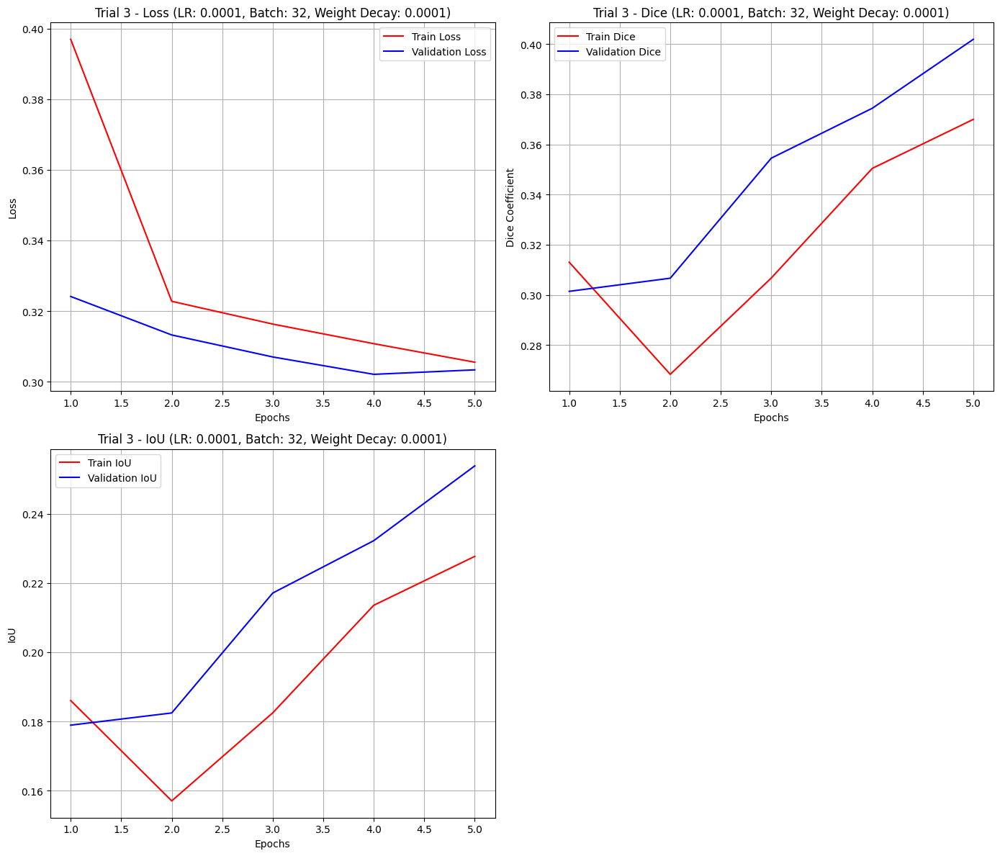

Trial 4/10 --> learning rate = 0.01, batch_size = 16, weight_decay = 0.001


Epoch 1 Training:   3%|▎         | 1/29 [00:03<01:39,  3.54s/batch]

Training Loss: 0.6173


Epoch 1 Training:   7%|▋         | 2/29 [00:06<01:33,  3.48s/batch]

Training Loss: 63.8959


Epoch 1 Training:  10%|█         | 3/29 [00:10<01:30,  3.50s/batch]

Training Loss: 2756.3733


Epoch 1 Training:  14%|█▍        | 4/29 [00:13<01:26,  3.46s/batch]

Training Loss: 0.5904


Epoch 1 Training:  17%|█▋        | 5/29 [00:17<01:22,  3.45s/batch]

Training Loss: 7.1457


Epoch 1 Training:  21%|██        | 6/29 [00:20<01:19,  3.48s/batch]

Training Loss: 133109.5938


Epoch 1 Training:  24%|██▍       | 7/29 [00:24<01:16,  3.47s/batch]

Training Loss: 472.8241


Epoch 1 Training:  28%|██▊       | 8/29 [00:27<01:13,  3.49s/batch]

Training Loss: 173.7928


Epoch 1 Training:  31%|███       | 9/29 [00:31<01:09,  3.49s/batch]

Training Loss: 208.4075


Epoch 1 Training:  34%|███▍      | 10/29 [00:34<01:06,  3.49s/batch]

Training Loss: 82.4567


Epoch 1 Training:  38%|███▊      | 11/29 [00:38<01:03,  3.50s/batch]

Training Loss: 190.5861


Epoch 1 Training:  41%|████▏     | 12/29 [00:41<00:59,  3.51s/batch]

Training Loss: 8957.0371


Epoch 1 Training:  45%|████▍     | 13/29 [00:45<00:56,  3.56s/batch]

Training Loss: 5283.5850


Epoch 1 Training:  48%|████▊     | 14/29 [00:48<00:52,  3.51s/batch]

Training Loss: 601.9529


Epoch 1 Training:  52%|█████▏    | 15/29 [00:52<00:48,  3.50s/batch]

Training Loss: 3425348.5000


Epoch 1 Training:  55%|█████▌    | 16/29 [00:55<00:45,  3.51s/batch]

Training Loss: 329477.8125


Epoch 1 Training:  59%|█████▊    | 17/29 [00:59<00:41,  3.49s/batch]

Training Loss: 395821.0938


Epoch 1 Training:  62%|██████▏   | 18/29 [01:02<00:38,  3.50s/batch]

Training Loss: 256686.0312


Epoch 1 Training:  66%|██████▌   | 19/29 [01:06<00:35,  3.53s/batch]

Training Loss: 498095.5938


Epoch 1 Training:  69%|██████▉   | 20/29 [01:10<00:31,  3.54s/batch]

Training Loss: 2023.9441


Epoch 1 Training:  72%|███████▏  | 21/29 [01:13<00:28,  3.50s/batch]

Training Loss: 0.7127


Epoch 1 Training:  76%|███████▌  | 22/29 [01:17<00:24,  3.53s/batch]

Training Loss: 0.7132


Epoch 1 Training:  79%|███████▉  | 23/29 [01:20<00:21,  3.50s/batch]

Training Loss: 57009.9766


Epoch 1 Training:  83%|████████▎ | 24/29 [01:24<00:17,  3.49s/batch]

Training Loss: 0.7689


Epoch 1 Training:  86%|████████▌ | 25/29 [01:27<00:13,  3.50s/batch]

Training Loss: 0.7039


Epoch 1 Training:  90%|████████▉ | 26/29 [01:31<00:10,  3.50s/batch]

Training Loss: 0.7007


Epoch 1 Training:  93%|█████████▎| 27/29 [01:34<00:06,  3.47s/batch]

Training Loss: 0.6982


Epoch 1 Training:  97%|█████████▋| 28/29 [01:37<00:03,  3.50s/batch]

Training Loss: 0.6948


Epoch 1 Training: 100%|██████████| 29/29 [01:38<00:00,  3.39s/batch]


Training Loss: 0.6910




Epoch 1 Validation:  12%|█▎        | 1/8 [00:03<00:22,  3.16s/batch]

Validation Loss: 0.6873


Epoch 1 Validation:  25%|██▌       | 2/8 [00:06<00:19,  3.20s/batch]

Validation Loss: 0.6869


Epoch 1 Validation:  38%|███▊      | 3/8 [00:09<00:16,  3.24s/batch]

Validation Loss: 0.6873


Epoch 1 Validation:  50%|█████     | 4/8 [00:12<00:12,  3.21s/batch]

Validation Loss: 0.6871


Epoch 1 Validation:  62%|██████▎   | 5/8 [00:16<00:09,  3.25s/batch]

Validation Loss: 0.6875


Epoch 1 Validation:  75%|███████▌  | 6/8 [00:19<00:06,  3.27s/batch]

Validation Loss: 0.6874


Epoch 1 Validation:  88%|████████▊ | 7/8 [00:22<00:03,  3.25s/batch]

Validation Loss: 0.6866


Epoch 1 Validation: 100%|██████████| 8/8 [00:25<00:00,  3.23s/batch]


Validation Loss: 0.6873
Epoch 1, Validation Loss: 0.6872, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 2 Training:   3%|▎         | 1/29 [00:03<01:40,  3.57s/batch]

Training Loss: 0.6874


Epoch 2 Training:   7%|▋         | 2/29 [00:07<01:36,  3.56s/batch]

Training Loss: 0.6834


Epoch 2 Training:  10%|█         | 3/29 [00:10<01:31,  3.52s/batch]

Training Loss: 0.6789


Epoch 2 Training:  14%|█▍        | 4/29 [00:14<01:27,  3.50s/batch]

Training Loss: 812.4668


Epoch 2 Training:  17%|█▋        | 5/29 [00:17<01:23,  3.49s/batch]

Training Loss: 0.7776


Epoch 2 Training:  21%|██        | 6/29 [00:21<01:20,  3.50s/batch]

Training Loss: 1.9921


Epoch 2 Training:  24%|██▍       | 7/29 [00:24<01:16,  3.49s/batch]

Training Loss: 0.6648


Epoch 2 Training:  28%|██▊       | 8/29 [00:28<01:13,  3.50s/batch]

Training Loss: 0.6595


Epoch 2 Training:  31%|███       | 9/29 [00:31<01:09,  3.48s/batch]

Training Loss: 4995.8433


Epoch 2 Training:  34%|███▍      | 10/29 [00:34<01:05,  3.45s/batch]

Training Loss: 0.6565


Epoch 2 Training:  38%|███▊      | 11/29 [00:38<01:02,  3.46s/batch]

Training Loss: 0.6498


Epoch 2 Training:  41%|████▏     | 12/29 [00:41<00:59,  3.49s/batch]

Training Loss: 454.9059


Epoch 2 Training:  45%|████▍     | 13/29 [00:45<00:56,  3.52s/batch]

Training Loss: 1780.9507


Epoch 2 Training:  48%|████▊     | 14/29 [00:48<00:52,  3.52s/batch]

Training Loss: 137.2078


Epoch 2 Training:  52%|█████▏    | 15/29 [00:52<00:49,  3.53s/batch]

Training Loss: 0.6377


Epoch 2 Training:  55%|█████▌    | 16/29 [00:56<00:45,  3.51s/batch]

Training Loss: 0.6394


Epoch 2 Training:  59%|█████▊    | 17/29 [00:59<00:41,  3.50s/batch]

Training Loss: 0.6313


Epoch 2 Training:  62%|██████▏   | 18/29 [01:03<00:38,  3.53s/batch]

Training Loss: 0.6326


Epoch 2 Training:  66%|██████▌   | 19/29 [01:06<00:35,  3.55s/batch]

Training Loss: 0.6269


Epoch 2 Training:  69%|██████▉   | 20/29 [01:10<00:31,  3.54s/batch]

Training Loss: 0.9191


Epoch 2 Training:  72%|███████▏  | 21/29 [01:13<00:28,  3.51s/batch]

Training Loss: 0.6178


Epoch 2 Training:  76%|███████▌  | 22/29 [01:17<00:24,  3.52s/batch]

Training Loss: 0.6163


Epoch 2 Training:  79%|███████▉  | 23/29 [01:20<00:21,  3.51s/batch]

Training Loss: 0.6138


Epoch 2 Training:  83%|████████▎ | 24/29 [01:24<00:17,  3.48s/batch]

Training Loss: 0.6123


Epoch 2 Training:  86%|████████▌ | 25/29 [01:27<00:14,  3.51s/batch]

Training Loss: 0.6031


Epoch 2 Training:  90%|████████▉ | 26/29 [01:31<00:10,  3.52s/batch]

Training Loss: 0.6063


Epoch 2 Training:  93%|█████████▎| 27/29 [01:34<00:06,  3.49s/batch]

Training Loss: 0.6105


Epoch 2 Training:  97%|█████████▋| 28/29 [01:38<00:03,  3.51s/batch]

Training Loss: 0.5997


Epoch 2 Training: 100%|██████████| 29/29 [01:38<00:00,  3.40s/batch]


Training Loss: 0.6135




Epoch 2 Validation:  12%|█▎        | 1/8 [00:03<00:22,  3.15s/batch]

Validation Loss: 0.5942


Epoch 2 Validation:  25%|██▌       | 2/8 [00:06<00:19,  3.18s/batch]

Validation Loss: 0.5868


Epoch 2 Validation:  38%|███▊      | 3/8 [00:09<00:16,  3.25s/batch]

Validation Loss: 0.5935


Epoch 2 Validation:  50%|█████     | 4/8 [00:12<00:12,  3.22s/batch]

Validation Loss: 0.5907


Epoch 2 Validation:  62%|██████▎   | 5/8 [00:16<00:09,  3.25s/batch]

Validation Loss: 0.5974


Epoch 2 Validation:  75%|███████▌  | 6/8 [00:19<00:06,  3.27s/batch]

Validation Loss: 0.5961


Epoch 2 Validation:  88%|████████▊ | 7/8 [00:22<00:03,  3.25s/batch]

Validation Loss: 0.5808


Epoch 2 Validation: 100%|██████████| 8/8 [00:25<00:00,  3.23s/batch]


Validation Loss: 0.5948
Epoch 2, Validation Loss: 0.5918, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 3 Training:   3%|▎         | 1/29 [00:03<01:36,  3.43s/batch]

Training Loss: 0.5904


Epoch 3 Training:   7%|▋         | 2/29 [00:06<01:32,  3.44s/batch]

Training Loss: 0.5925


Epoch 3 Training:  10%|█         | 3/29 [00:10<01:30,  3.47s/batch]

Training Loss: 0.5839


Epoch 3 Training:  14%|█▍        | 4/29 [00:13<01:26,  3.47s/batch]

Training Loss: 0.5821


Epoch 3 Training:  17%|█▋        | 5/29 [00:17<01:23,  3.49s/batch]

Training Loss: 0.5807


Epoch 3 Training:  21%|██        | 6/29 [00:20<01:19,  3.47s/batch]

Training Loss: 0.5749


Epoch 3 Training:  24%|██▍       | 7/29 [00:24<01:16,  3.49s/batch]

Training Loss: 198.1039


Epoch 3 Training:  28%|██▊       | 8/29 [00:27<01:13,  3.48s/batch]

Training Loss: 0.5649


Epoch 3 Training:  31%|███       | 9/29 [00:31<01:09,  3.50s/batch]

Training Loss: 0.5683


Epoch 3 Training:  34%|███▍      | 10/29 [00:34<01:06,  3.48s/batch]

Training Loss: 0.5720


Epoch 3 Training:  38%|███▊      | 11/29 [00:38<01:02,  3.50s/batch]

Training Loss: 0.5581


Epoch 3 Training:  41%|████▏     | 12/29 [00:41<00:59,  3.48s/batch]

Training Loss: 0.5525


Epoch 3 Training:  45%|████▍     | 13/29 [00:45<00:55,  3.49s/batch]

Training Loss: 0.5545


Epoch 3 Training:  48%|████▊     | 14/29 [00:48<00:52,  3.50s/batch]

Training Loss: 0.5573


Epoch 3 Training:  52%|█████▏    | 15/29 [00:52<00:49,  3.50s/batch]

Training Loss: 0.5528


Epoch 3 Training:  55%|█████▌    | 16/29 [00:55<00:45,  3.52s/batch]

Training Loss: 0.5585


Epoch 3 Training:  59%|█████▊    | 17/29 [00:59<00:42,  3.54s/batch]

Training Loss: 0.5617


Epoch 3 Training:  62%|██████▏   | 18/29 [01:02<00:38,  3.54s/batch]

Training Loss: 0.5477


Epoch 3 Training:  66%|██████▌   | 19/29 [01:06<00:35,  3.56s/batch]

Training Loss: 0.5326


Epoch 3 Training:  69%|██████▉   | 20/29 [01:10<00:31,  3.53s/batch]

Training Loss: 0.5276


Epoch 3 Training:  72%|███████▏  | 21/29 [01:13<00:28,  3.51s/batch]

Training Loss: 0.5407


Epoch 3 Training:  76%|███████▌  | 22/29 [01:17<00:24,  3.55s/batch]

Training Loss: 0.5331


Epoch 3 Training:  79%|███████▉  | 23/29 [01:20<00:21,  3.51s/batch]

Training Loss: 0.5316


Epoch 3 Training:  83%|████████▎ | 24/29 [01:24<00:17,  3.51s/batch]

Training Loss: 0.5246


Epoch 3 Training:  86%|████████▌ | 25/29 [01:27<00:13,  3.49s/batch]

Training Loss: 0.5160


Epoch 3 Training:  90%|████████▉ | 26/29 [01:31<00:10,  3.50s/batch]

Training Loss: 0.5129


Epoch 3 Training:  93%|█████████▎| 27/29 [01:34<00:07,  3.51s/batch]

Training Loss: 0.5273


Epoch 3 Training:  97%|█████████▋| 28/29 [01:38<00:03,  3.52s/batch]

Training Loss: 0.5101


Epoch 3 Training: 100%|██████████| 29/29 [01:38<00:00,  3.40s/batch]


Training Loss: 0.5356




Epoch 3 Validation:  12%|█▎        | 1/8 [00:03<00:22,  3.15s/batch]

Validation Loss: 0.5166


Epoch 3 Validation:  25%|██▌       | 2/8 [00:06<00:19,  3.18s/batch]

Validation Loss: 0.5019


Epoch 3 Validation:  38%|███▊      | 3/8 [00:09<00:16,  3.23s/batch]

Validation Loss: 0.5153


Epoch 3 Validation:  50%|█████     | 4/8 [00:12<00:12,  3.22s/batch]

Validation Loss: 0.5096


Epoch 3 Validation:  62%|██████▎   | 5/8 [00:16<00:09,  3.25s/batch]

Validation Loss: 0.5231


Epoch 3 Validation:  75%|███████▌  | 6/8 [00:19<00:06,  3.27s/batch]

Validation Loss: 0.5204


Epoch 3 Validation:  88%|████████▊ | 7/8 [00:22<00:03,  3.27s/batch]

Validation Loss: 0.4899


Epoch 3 Validation: 100%|██████████| 8/8 [00:25<00:00,  3.23s/batch]


Validation Loss: 0.5179
Epoch 3, Validation Loss: 0.5118, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 4 Training:   3%|▎         | 1/29 [00:03<01:37,  3.49s/batch]

Training Loss: 0.5124


Epoch 4 Training:   7%|▋         | 2/29 [00:06<01:33,  3.47s/batch]

Training Loss: 0.5146


Epoch 4 Training:  10%|█         | 3/29 [00:10<01:30,  3.49s/batch]

Training Loss: 0.5074


Epoch 4 Training:  14%|█▍        | 4/29 [00:13<01:27,  3.48s/batch]

Training Loss: 0.5109


Epoch 4 Training:  17%|█▋        | 5/29 [00:17<01:24,  3.50s/batch]

Training Loss: 0.5214


Epoch 4 Training:  21%|██        | 6/29 [00:21<01:21,  3.53s/batch]

Training Loss: 0.4949


Epoch 4 Training:  24%|██▍       | 7/29 [00:24<01:17,  3.52s/batch]

Training Loss: 0.5068


Epoch 4 Training:  28%|██▊       | 8/29 [00:28<01:13,  3.50s/batch]

Training Loss: 0.5002


Epoch 4 Training:  31%|███       | 9/29 [00:31<01:10,  3.51s/batch]

Training Loss: 0.4996


Epoch 4 Training:  34%|███▍      | 10/29 [00:35<01:07,  3.54s/batch]

Training Loss: 0.5030


Epoch 4 Training:  38%|███▊      | 11/29 [00:38<01:03,  3.52s/batch]

Training Loss: 0.5064


Epoch 4 Training:  41%|████▏     | 12/29 [00:42<00:59,  3.48s/batch]

Training Loss: 0.4995


Epoch 4 Training:  45%|████▍     | 13/29 [00:45<00:56,  3.50s/batch]

Training Loss: 0.4874


Epoch 4 Training:  48%|████▊     | 14/29 [00:49<00:52,  3.50s/batch]

Training Loss: 0.4920


Epoch 4 Training:  52%|█████▏    | 15/29 [00:52<00:49,  3.52s/batch]

Training Loss: 0.5010


Epoch 4 Training:  55%|█████▌    | 16/29 [00:56<00:45,  3.49s/batch]

Training Loss: 0.4864


Epoch 4 Training:  59%|█████▊    | 17/29 [00:59<00:42,  3.53s/batch]

Training Loss: 0.4711


Epoch 4 Training:  62%|██████▏   | 18/29 [01:03<00:38,  3.53s/batch]

Training Loss: 0.5058


Epoch 4 Training:  66%|██████▌   | 19/29 [01:06<00:35,  3.54s/batch]

Training Loss: 0.4675


Epoch 4 Training:  69%|██████▉   | 20/29 [01:10<00:31,  3.50s/batch]

Training Loss: 0.4924


Epoch 4 Training:  72%|███████▏  | 21/29 [01:13<00:28,  3.51s/batch]

Training Loss: 0.4512


Epoch 4 Training:  76%|███████▌  | 22/29 [01:17<00:24,  3.51s/batch]

Training Loss: 0.4644


Epoch 4 Training:  79%|███████▉  | 23/29 [01:20<00:21,  3.52s/batch]

Training Loss: 0.4436


Epoch 4 Training:  83%|████████▎ | 24/29 [01:24<00:17,  3.54s/batch]

Training Loss: 0.4638


Epoch 4 Training:  86%|████████▌ | 25/29 [01:27<00:14,  3.51s/batch]

Training Loss: 0.4558


Epoch 4 Training:  90%|████████▉ | 26/29 [01:31<00:10,  3.51s/batch]

Training Loss: 0.4604


Epoch 4 Training:  93%|█████████▎| 27/29 [01:34<00:06,  3.48s/batch]

Training Loss: 0.4581


Epoch 4 Training:  97%|█████████▋| 28/29 [01:38<00:03,  3.53s/batch]

Training Loss: 0.4677


Epoch 4 Training: 100%|██████████| 29/29 [01:38<00:00,  3.41s/batch]


Training Loss: 0.4651




Epoch 4 Validation:  12%|█▎        | 1/8 [00:03<00:22,  3.15s/batch]

Validation Loss: 0.4661


Epoch 4 Validation:  25%|██▌       | 2/8 [00:06<00:19,  3.18s/batch]

Validation Loss: 0.4450


Epoch 4 Validation:  38%|███▊      | 3/8 [00:09<00:16,  3.26s/batch]

Validation Loss: 0.4643


Epoch 4 Validation:  50%|█████     | 4/8 [00:12<00:12,  3.24s/batch]

Validation Loss: 0.4561


Epoch 4 Validation:  62%|██████▎   | 5/8 [00:16<00:09,  3.26s/batch]

Validation Loss: 0.4754


Epoch 4 Validation:  75%|███████▌  | 6/8 [00:19<00:06,  3.28s/batch]

Validation Loss: 0.4716


Epoch 4 Validation:  88%|████████▊ | 7/8 [00:22<00:03,  3.28s/batch]

Validation Loss: 0.4278


Epoch 4 Validation: 100%|██████████| 8/8 [00:25<00:00,  3.24s/batch]


Validation Loss: 0.4680
Epoch 4, Validation Loss: 0.4593, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 5 Training:   3%|▎         | 1/29 [00:03<01:35,  3.42s/batch]

Training Loss: 0.4917


Epoch 5 Training:   7%|▋         | 2/29 [00:07<01:36,  3.56s/batch]

Training Loss: 0.4464


Epoch 5 Training:  10%|█         | 3/29 [00:10<01:32,  3.54s/batch]

Training Loss: 0.4737


Epoch 5 Training:  14%|█▍        | 4/29 [00:14<01:27,  3.52s/batch]

Training Loss: 0.4583


Epoch 5 Training:  17%|█▋        | 5/29 [00:17<01:24,  3.53s/batch]

Training Loss: 0.4800


Epoch 5 Training:  21%|██        | 6/29 [00:21<01:20,  3.51s/batch]

Training Loss: 0.4611


Epoch 5 Training:  24%|██▍       | 7/29 [00:24<01:17,  3.52s/batch]

Training Loss: 0.4245


Epoch 5 Training:  28%|██▊       | 8/29 [00:28<01:14,  3.55s/batch]

Training Loss: 0.4853


Epoch 5 Training:  31%|███       | 9/29 [00:31<01:11,  3.55s/batch]

Training Loss: 0.4567


Epoch 5 Training:  34%|███▍      | 10/29 [00:35<01:06,  3.51s/batch]

Training Loss: 0.4724


Epoch 5 Training:  38%|███▊      | 11/29 [00:38<01:03,  3.54s/batch]

Training Loss: 0.4186


Epoch 5 Training:  41%|████▏     | 12/29 [00:42<00:59,  3.50s/batch]

Training Loss: 0.4346


Epoch 5 Training:  45%|████▍     | 13/29 [00:45<00:56,  3.52s/batch]

Training Loss: 0.4483


Epoch 5 Training:  48%|████▊     | 14/29 [00:49<00:53,  3.53s/batch]

Training Loss: 0.4455


Epoch 5 Training:  52%|█████▏    | 15/29 [00:52<00:49,  3.51s/batch]

Training Loss: 0.4529


Epoch 5 Training:  55%|█████▌    | 16/29 [00:56<00:45,  3.54s/batch]

Training Loss: 0.4289


Epoch 5 Training:  59%|█████▊    | 17/29 [00:59<00:42,  3.53s/batch]

Training Loss: 0.4442


Epoch 5 Training:  62%|██████▏   | 18/29 [01:03<00:38,  3.52s/batch]

Training Loss: 0.4373


Epoch 5 Training:  66%|██████▌   | 19/29 [01:06<00:35,  3.52s/batch]

Training Loss: 0.4511


Epoch 5 Training:  69%|██████▉   | 20/29 [01:10<00:31,  3.49s/batch]

Training Loss: 0.4440


Epoch 5 Training:  72%|███████▏  | 21/29 [01:14<00:28,  3.54s/batch]

Training Loss: 0.4467


Epoch 5 Training:  76%|███████▌  | 22/29 [01:17<00:24,  3.53s/batch]

Training Loss: 0.4425


Epoch 5 Training:  79%|███████▉  | 23/29 [01:21<00:21,  3.55s/batch]

Training Loss: 0.4047


Epoch 5 Training:  83%|████████▎ | 24/29 [01:24<00:17,  3.54s/batch]

Training Loss: 0.4347


Epoch 5 Training:  86%|████████▌ | 25/29 [01:28<00:14,  3.52s/batch]

Training Loss: 0.4488


Epoch 5 Training:  90%|████████▉ | 26/29 [01:31<00:10,  3.52s/batch]

Training Loss: 0.4092


Epoch 5 Training:  93%|█████████▎| 27/29 [01:35<00:07,  3.54s/batch]

Training Loss: 0.4249


Epoch 5 Training:  97%|█████████▋| 28/29 [01:38<00:03,  3.51s/batch]

Training Loss: 0.4239


Epoch 5 Training: 100%|██████████| 29/29 [01:39<00:00,  3.42s/batch]


Training Loss: 0.3989




Epoch 5 Validation:  12%|█▎        | 1/8 [00:03<00:22,  3.15s/batch]

Validation Loss: 0.4342


Epoch 5 Validation:  25%|██▌       | 2/8 [00:06<00:19,  3.20s/batch]

Validation Loss: 0.4076


Epoch 5 Validation:  38%|███▊      | 3/8 [00:09<00:16,  3.24s/batch]

Validation Loss: 0.4319


Epoch 5 Validation:  50%|█████     | 4/8 [00:12<00:12,  3.24s/batch]

Validation Loss: 0.4217


Epoch 5 Validation:  62%|██████▎   | 5/8 [00:16<00:09,  3.24s/batch]

Validation Loss: 0.4459


Epoch 5 Validation:  75%|███████▌  | 6/8 [00:19<00:06,  3.31s/batch]

Validation Loss: 0.4411


Epoch 5 Validation:  88%|████████▊ | 7/8 [00:22<00:03,  3.27s/batch]

Validation Loss: 0.3860


Epoch 5 Validation: 100%|██████████| 8/8 [00:25<00:00,  3.24s/batch]


Validation Loss: 0.4366
Epoch 5, Validation Loss: 0.4256, Validation Dice: 0.0000, Validation IoU: 0.0000




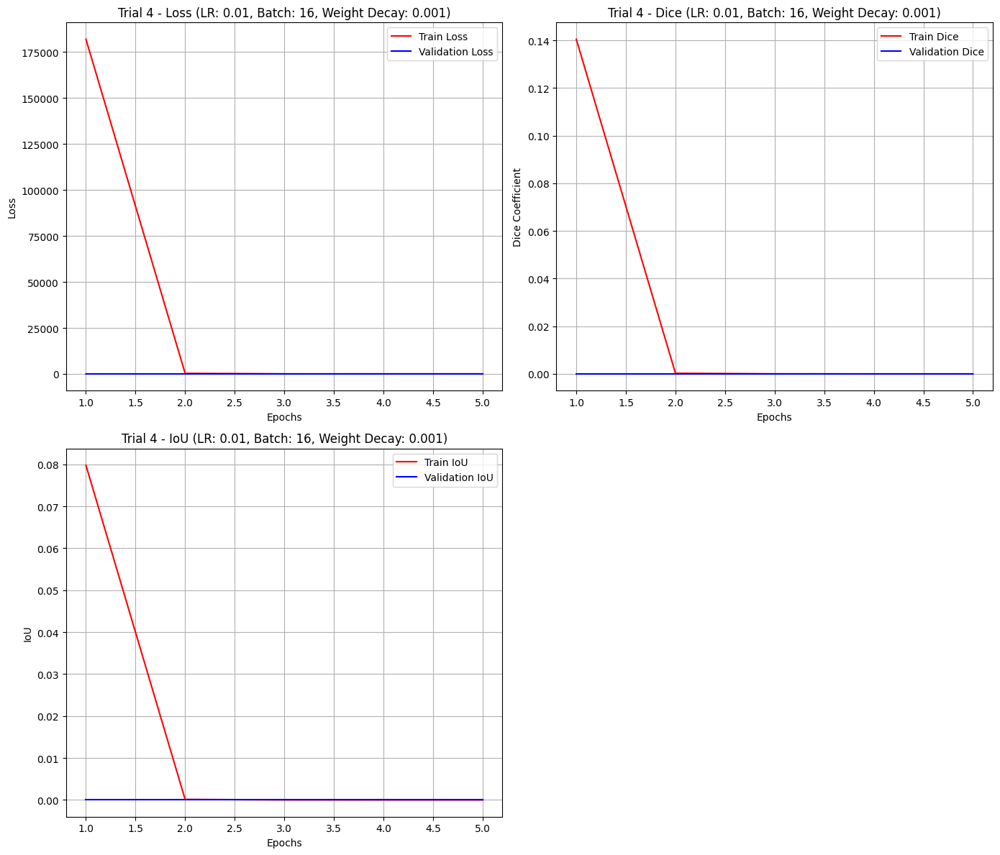

Trial 5/10 --> learning rate = 0.0001, batch_size = 32, weight_decay = 0.001


Epoch 1 Training:   7%|▋         | 1/15 [00:07<01:38,  7.02s/batch]

Training Loss: 0.4853


Epoch 1 Training:  13%|█▎        | 2/15 [00:14<01:32,  7.08s/batch]

Training Loss: 0.4841


Epoch 1 Training:  20%|██        | 3/15 [00:20<01:23,  6.92s/batch]

Training Loss: 0.4410


Epoch 1 Training:  27%|██▋       | 4/15 [00:27<01:13,  6.69s/batch]

Training Loss: 0.4741


Epoch 1 Training:  33%|███▎      | 5/15 [00:34<01:07,  6.74s/batch]

Training Loss: 0.3931


Epoch 1 Training:  40%|████      | 6/15 [00:40<01:01,  6.81s/batch]

Training Loss: 0.3795


Epoch 1 Training:  47%|████▋     | 7/15 [00:47<00:52,  6.61s/batch]

Training Loss: 0.3619


Epoch 1 Training:  53%|█████▎    | 8/15 [00:54<00:47,  6.78s/batch]

Training Loss: 0.3781


Epoch 1 Training:  60%|██████    | 9/15 [01:01<00:40,  6.78s/batch]

Training Loss: 0.3547


Epoch 1 Training:  67%|██████▋   | 10/15 [01:07<00:33,  6.64s/batch]

Training Loss: 0.3194


Epoch 1 Training:  73%|███████▎  | 11/15 [01:14<00:26,  6.72s/batch]

Training Loss: 0.3515


Epoch 1 Training:  80%|████████  | 12/15 [01:21<00:20,  6.83s/batch]

Training Loss: 0.3325


Epoch 1 Training:  87%|████████▋ | 13/15 [01:27<00:13,  6.67s/batch]

Training Loss: 0.3377


Epoch 1 Training:  93%|█████████▎| 14/15 [01:34<00:06,  6.85s/batch]

Training Loss: 0.3916


Epoch 1 Training: 100%|██████████| 15/15 [01:35<00:00,  6.36s/batch]


Training Loss: 0.5760




Epoch 1 Validation:  25%|██▌       | 1/4 [00:06<00:19,  6.48s/batch]

Validation Loss: 0.2975


Epoch 1 Validation:  50%|█████     | 2/4 [00:13<00:13,  6.52s/batch]

Validation Loss: 0.3303


Epoch 1 Validation:  75%|███████▌  | 3/4 [00:19<00:06,  6.51s/batch]

Validation Loss: 0.3827


Epoch 1 Validation: 100%|██████████| 4/4 [00:25<00:00,  6.35s/batch]


Validation Loss: 0.2967
Epoch 1, Validation Loss: 0.3268, Validation Dice: 0.3190, Validation IoU: 0.1914




Epoch 2 Training:   7%|▋         | 1/15 [00:06<01:37,  7.00s/batch]

Training Loss: 0.3587


Epoch 2 Training:  13%|█▎        | 2/15 [00:14<01:32,  7.08s/batch]

Training Loss: 0.3566


Epoch 2 Training:  20%|██        | 3/15 [00:20<01:22,  6.89s/batch]

Training Loss: 0.3173


Epoch 2 Training:  27%|██▋       | 4/15 [00:26<01:10,  6.45s/batch]

Training Loss: 0.3452


Epoch 2 Training:  33%|███▎      | 5/15 [00:33<01:06,  6.64s/batch]

Training Loss: 0.3218


Epoch 2 Training:  40%|████      | 6/15 [00:40<01:00,  6.72s/batch]

Training Loss: 0.3182


Epoch 2 Training:  47%|████▋     | 7/15 [00:46<00:52,  6.59s/batch]

Training Loss: 0.3497


Epoch 2 Training:  53%|█████▎    | 8/15 [00:53<00:46,  6.67s/batch]

Training Loss: 0.3337


Epoch 2 Training:  60%|██████    | 9/15 [01:00<00:40,  6.81s/batch]

Training Loss: 0.3254


Epoch 2 Training:  67%|██████▋   | 10/15 [01:07<00:33,  6.67s/batch]

Training Loss: 0.2985


Epoch 2 Training:  73%|███████▎  | 11/15 [01:14<00:27,  6.81s/batch]

Training Loss: 0.2668


Epoch 2 Training:  80%|████████  | 12/15 [01:21<00:20,  6.82s/batch]

Training Loss: 0.3110


Epoch 2 Training:  87%|████████▋ | 13/15 [01:27<00:13,  6.69s/batch]

Training Loss: 0.3535


Epoch 2 Training:  93%|█████████▎| 14/15 [01:34<00:06,  6.76s/batch]

Training Loss: 0.2873


Epoch 2 Training: 100%|██████████| 15/15 [01:34<00:00,  6.32s/batch]


Training Loss: 0.5203




Epoch 2 Validation:  25%|██▌       | 1/4 [00:06<00:19,  6.49s/batch]

Validation Loss: 0.2864


Epoch 2 Validation:  50%|█████     | 2/4 [00:13<00:13,  6.54s/batch]

Validation Loss: 0.3211


Epoch 2 Validation:  75%|███████▌  | 3/4 [00:19<00:06,  6.50s/batch]

Validation Loss: 0.3714


Epoch 2 Validation: 100%|██████████| 4/4 [00:25<00:00,  6.35s/batch]


Validation Loss: 0.2774
Epoch 2, Validation Loss: 0.3141, Validation Dice: 0.2799, Validation IoU: 0.1639




Epoch 3 Training:   7%|▋         | 1/15 [00:06<01:36,  6.88s/batch]

Training Loss: 0.3078


Epoch 3 Training:  13%|█▎        | 2/15 [00:13<01:31,  7.00s/batch]

Training Loss: 0.3283


Epoch 3 Training:  20%|██        | 3/15 [00:20<01:23,  6.95s/batch]

Training Loss: 0.3583


Epoch 3 Training:  27%|██▋       | 4/15 [00:27<01:13,  6.72s/batch]

Training Loss: 0.2886


Epoch 3 Training:  33%|███▎      | 5/15 [00:34<01:08,  6.80s/batch]

Training Loss: 0.3024


Epoch 3 Training:  40%|████      | 6/15 [00:41<01:01,  6.87s/batch]

Training Loss: 0.3139


Epoch 3 Training:  47%|████▋     | 7/15 [00:47<00:52,  6.57s/batch]

Training Loss: 0.2999


Epoch 3 Training:  53%|█████▎    | 8/15 [00:54<00:47,  6.73s/batch]

Training Loss: 0.3108


Epoch 3 Training:  60%|██████    | 9/15 [01:01<00:40,  6.79s/batch]

Training Loss: 0.3148


Epoch 3 Training:  67%|██████▋   | 10/15 [01:07<00:33,  6.67s/batch]

Training Loss: 0.3153


Epoch 3 Training:  73%|███████▎  | 11/15 [01:14<00:26,  6.73s/batch]

Training Loss: 0.3227


Epoch 3 Training:  80%|████████  | 12/15 [01:21<00:20,  6.86s/batch]

Training Loss: 0.3278


Epoch 3 Training:  87%|████████▋ | 13/15 [01:27<00:13,  6.69s/batch]

Training Loss: 0.3362


Epoch 3 Training:  93%|█████████▎| 14/15 [01:35<00:06,  6.83s/batch]

Training Loss: 0.3075


Epoch 3 Training: 100%|██████████| 15/15 [01:35<00:00,  6.36s/batch]


Training Loss: 0.3532




Epoch 3 Validation:  25%|██▌       | 1/4 [00:06<00:19,  6.49s/batch]

Validation Loss: 0.2806


Epoch 3 Validation:  50%|█████     | 2/4 [00:13<00:13,  6.55s/batch]

Validation Loss: 0.3157


Epoch 3 Validation:  75%|███████▌  | 3/4 [00:19<00:06,  6.56s/batch]

Validation Loss: 0.3680


Epoch 3 Validation: 100%|██████████| 4/4 [00:25<00:00,  6.40s/batch]


Validation Loss: 0.2647
Epoch 3, Validation Loss: 0.3073, Validation Dice: 0.3531, Validation IoU: 0.2161




Epoch 4 Training:   7%|▋         | 1/15 [00:07<01:39,  7.09s/batch]

Training Loss: 0.2684


Epoch 4 Training:  13%|█▎        | 2/15 [00:14<01:31,  7.07s/batch]

Training Loss: 0.3500


Epoch 4 Training:  20%|██        | 3/15 [00:21<01:25,  7.09s/batch]

Training Loss: 0.3143


Epoch 4 Training:  27%|██▋       | 4/15 [00:27<01:14,  6.79s/batch]

Training Loss: 0.3314


Epoch 4 Training:  33%|███▎      | 5/15 [00:34<01:09,  6.92s/batch]

Training Loss: 0.3140


Epoch 4 Training:  40%|████      | 6/15 [00:41<01:02,  6.97s/batch]

Training Loss: 0.3022


Epoch 4 Training:  47%|████▋     | 7/15 [00:48<00:53,  6.75s/batch]

Training Loss: 0.2807


Epoch 4 Training:  53%|█████▎    | 8/15 [00:55<00:48,  6.86s/batch]

Training Loss: 0.3051


Epoch 4 Training:  60%|██████    | 9/15 [01:02<00:41,  6.88s/batch]

Training Loss: 0.2957


Epoch 4 Training:  67%|██████▋   | 10/15 [01:08<00:33,  6.74s/batch]

Training Loss: 0.3123


Epoch 4 Training:  73%|███████▎  | 11/15 [01:15<00:27,  6.79s/batch]

Training Loss: 0.3258


Epoch 4 Training:  80%|████████  | 12/15 [01:22<00:20,  6.86s/batch]

Training Loss: 0.2870


Epoch 4 Training:  87%|████████▋ | 13/15 [01:28<00:13,  6.68s/batch]

Training Loss: 0.3143


Epoch 4 Training:  93%|█████████▎| 14/15 [01:35<00:06,  6.82s/batch]

Training Loss: 0.3576


Epoch 4 Training: 100%|██████████| 15/15 [01:36<00:00,  6.42s/batch]


Training Loss: 0.3234




Epoch 4 Validation:  25%|██▌       | 1/4 [00:06<00:19,  6.53s/batch]

Validation Loss: 0.2758


Epoch 4 Validation:  50%|█████     | 2/4 [00:13<00:13,  6.57s/batch]

Validation Loss: 0.3115


Epoch 4 Validation:  75%|███████▌  | 3/4 [00:19<00:06,  6.50s/batch]

Validation Loss: 0.3634


Epoch 4 Validation: 100%|██████████| 4/4 [00:25<00:00,  6.37s/batch]


Validation Loss: 0.2595
Epoch 4, Validation Loss: 0.3026, Validation Dice: 0.3737, Validation IoU: 0.2318




Epoch 5 Training:   7%|▋         | 1/15 [00:06<01:36,  6.88s/batch]

Training Loss: 0.3223


Epoch 5 Training:  13%|█▎        | 2/15 [00:14<01:31,  7.03s/batch]

Training Loss: 0.2869


Epoch 5 Training:  20%|██        | 3/15 [00:20<01:23,  6.96s/batch]

Training Loss: 0.2993


Epoch 5 Training:  27%|██▋       | 4/15 [00:27<01:14,  6.77s/batch]

Training Loss: 0.3116


Epoch 5 Training:  33%|███▎      | 5/15 [00:34<01:08,  6.84s/batch]

Training Loss: 0.3189


Epoch 5 Training:  40%|████      | 6/15 [00:41<01:02,  6.90s/batch]

Training Loss: 0.2892


Epoch 5 Training:  47%|████▋     | 7/15 [00:47<00:53,  6.68s/batch]

Training Loss: 0.2607


Epoch 5 Training:  53%|█████▎    | 8/15 [00:54<00:47,  6.84s/batch]

Training Loss: 0.3205


Epoch 5 Training:  60%|██████    | 9/15 [01:01<00:41,  6.90s/batch]

Training Loss: 0.3352


Epoch 5 Training:  67%|██████▋   | 10/15 [01:08<00:33,  6.73s/batch]

Training Loss: 0.3663


Epoch 5 Training:  73%|███████▎  | 11/15 [01:15<00:27,  6.81s/batch]

Training Loss: 0.3141


Epoch 5 Training:  80%|████████  | 12/15 [01:22<00:20,  6.89s/batch]

Training Loss: 0.3045


Epoch 5 Training:  87%|████████▋ | 13/15 [01:28<00:13,  6.70s/batch]

Training Loss: 0.2963


Epoch 5 Training:  93%|█████████▎| 14/15 [01:35<00:06,  6.82s/batch]

Training Loss: 0.2651


Epoch 5 Training: 100%|██████████| 15/15 [01:36<00:00,  6.40s/batch]


Training Loss: 0.4382




Epoch 5 Validation:  25%|██▌       | 1/4 [00:06<00:19,  6.49s/batch]

Validation Loss: 0.2728


Epoch 5 Validation:  50%|█████     | 2/4 [00:13<00:13,  6.57s/batch]

Validation Loss: 0.3063


Epoch 5 Validation:  75%|███████▌  | 3/4 [00:19<00:06,  6.51s/batch]

Validation Loss: 0.3578


Epoch 5 Validation: 100%|██████████| 4/4 [00:25<00:00,  6.37s/batch]


Validation Loss: 0.2558
Epoch 5, Validation Loss: 0.2982, Validation Dice: 0.3834, Validation IoU: 0.2393




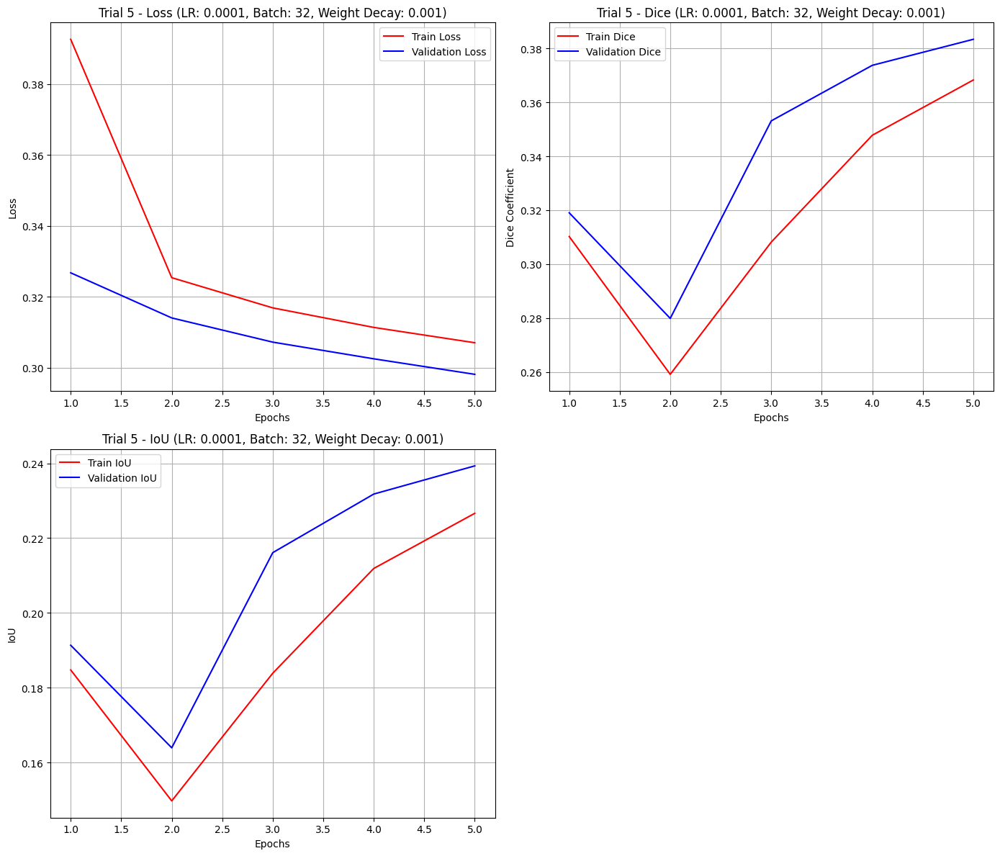

Trial 6/10 --> learning rate = 0.0001, batch_size = 32, weight_decay = 0.001


Epoch 1 Training:   7%|▋         | 1/15 [00:07<01:40,  7.14s/batch]

Training Loss: 0.6866


Epoch 1 Training:  13%|█▎        | 2/15 [00:14<01:32,  7.12s/batch]

Training Loss: 0.4232


Epoch 1 Training:  20%|██        | 3/15 [00:21<01:24,  7.08s/batch]

Training Loss: 0.4492


Epoch 1 Training:  27%|██▋       | 4/15 [00:28<01:17,  7.07s/batch]

Training Loss: 0.3752


Epoch 1 Training:  33%|███▎      | 5/15 [00:35<01:10,  7.04s/batch]

Training Loss: 0.3874


Epoch 1 Training:  40%|████      | 6/15 [00:42<01:03,  7.04s/batch]

Training Loss: 0.3612


Epoch 1 Training:  47%|████▋     | 7/15 [00:49<00:56,  7.04s/batch]

Training Loss: 0.4343


Epoch 1 Training:  53%|█████▎    | 8/15 [00:56<00:49,  7.03s/batch]

Training Loss: 0.3504


Epoch 1 Training:  60%|██████    | 9/15 [01:03<00:42,  7.03s/batch]

Training Loss: 0.3525


Epoch 1 Training:  67%|██████▋   | 10/15 [01:10<00:35,  7.04s/batch]

Training Loss: 0.3464


Epoch 1 Training:  73%|███████▎  | 11/15 [01:17<00:28,  7.02s/batch]

Training Loss: 0.2943


Epoch 1 Training:  80%|████████  | 12/15 [01:24<00:21,  7.00s/batch]

Training Loss: 0.3777


Epoch 1 Training:  87%|████████▋ | 13/15 [01:31<00:14,  7.01s/batch]

Training Loss: 0.3309


Epoch 1 Training:  93%|█████████▎| 14/15 [01:38<00:07,  7.02s/batch]

Training Loss: 0.3336


Epoch 1 Training: 100%|██████████| 15/15 [01:38<00:00,  6.60s/batch]


Training Loss: 0.4744




Epoch 1 Validation:  25%|██▌       | 1/4 [00:06<00:19,  6.49s/batch]

Validation Loss: 0.2974


Epoch 1 Validation:  50%|█████     | 2/4 [00:13<00:13,  6.54s/batch]

Validation Loss: 0.3308


Epoch 1 Validation:  75%|███████▌  | 3/4 [00:19<00:06,  6.51s/batch]

Validation Loss: 0.3828


Epoch 1 Validation: 100%|██████████| 4/4 [00:26<00:00,  6.52s/batch]


Validation Loss: 0.2981
Epoch 1, Validation Loss: 0.3273, Validation Dice: 0.3232, Validation IoU: 0.1943




Epoch 2 Training:   7%|▋         | 1/15 [00:07<01:38,  7.01s/batch]

Training Loss: 0.3322


Epoch 2 Training:  13%|█▎        | 2/15 [00:14<01:31,  7.05s/batch]

Training Loss: 0.3263


Epoch 2 Training:  20%|██        | 3/15 [00:21<01:24,  7.00s/batch]

Training Loss: 0.3470


Epoch 2 Training:  27%|██▋       | 4/15 [00:27<01:16,  6.98s/batch]

Training Loss: 0.3246


Epoch 2 Training:  33%|███▎      | 5/15 [00:34<01:07,  6.74s/batch]

Training Loss: 0.3144


Epoch 2 Training:  40%|████      | 6/15 [00:41<01:01,  6.83s/batch]

Training Loss: 0.3274


Epoch 2 Training:  47%|████▋     | 7/15 [00:48<00:55,  6.88s/batch]

Training Loss: 0.3281


Epoch 2 Training:  53%|█████▎    | 8/15 [00:55<00:48,  6.92s/batch]

Training Loss: 0.3340


Epoch 2 Training:  60%|██████    | 9/15 [01:01<00:40,  6.77s/batch]

Training Loss: 0.2685


Epoch 2 Training:  67%|██████▋   | 10/15 [01:08<00:34,  6.85s/batch]

Training Loss: 0.2802


Epoch 2 Training:  73%|███████▎  | 11/15 [01:15<00:27,  6.89s/batch]

Training Loss: 0.3489


Epoch 2 Training:  80%|████████  | 12/15 [01:22<00:20,  6.93s/batch]

Training Loss: 0.3120


Epoch 2 Training:  87%|████████▋ | 13/15 [01:29<00:13,  6.82s/batch]

Training Loss: 0.3754


Epoch 2 Training:  93%|█████████▎| 14/15 [01:35<00:06,  6.55s/batch]

Training Loss: 0.3053


Epoch 2 Training: 100%|██████████| 15/15 [01:35<00:00,  6.38s/batch]


Training Loss: 0.3746




Epoch 2 Validation:  25%|██▌       | 1/4 [00:06<00:19,  6.46s/batch]

Validation Loss: 0.2895


Epoch 2 Validation:  50%|█████     | 2/4 [00:13<00:13,  6.54s/batch]

Validation Loss: 0.3202


Epoch 2 Validation:  75%|███████▌  | 3/4 [00:19<00:06,  6.54s/batch]

Validation Loss: 0.3697


Epoch 2 Validation: 100%|██████████| 4/4 [00:25<00:00,  6.40s/batch]


Validation Loss: 0.2788
Epoch 2, Validation Loss: 0.3145, Validation Dice: 0.3128, Validation IoU: 0.1868




Epoch 3 Training:   7%|▋         | 1/15 [00:06<01:37,  6.97s/batch]

Training Loss: 0.3040


Epoch 3 Training:  13%|█▎        | 2/15 [00:13<01:30,  6.99s/batch]

Training Loss: 0.3215


Epoch 3 Training:  20%|██        | 3/15 [00:20<01:23,  7.00s/batch]

Training Loss: 0.3131


Epoch 3 Training:  27%|██▋       | 4/15 [00:27<01:14,  6.75s/batch]

Training Loss: 0.3482


Epoch 3 Training:  33%|███▎      | 5/15 [00:34<01:08,  6.89s/batch]

Training Loss: 0.2865


Epoch 3 Training:  40%|████      | 6/15 [00:41<01:02,  6.94s/batch]

Training Loss: 0.3371


Epoch 3 Training:  47%|████▋     | 7/15 [00:48<00:54,  6.85s/batch]

Training Loss: 0.3004


Epoch 3 Training:  53%|█████▎    | 8/15 [00:55<00:48,  6.88s/batch]

Training Loss: 0.3120


Epoch 3 Training:  60%|██████    | 9/15 [01:02<00:41,  6.96s/batch]

Training Loss: 0.3088


Epoch 3 Training:  67%|██████▋   | 10/15 [01:09<00:34,  6.95s/batch]

Training Loss: 0.3316


Epoch 3 Training:  73%|███████▎  | 11/15 [01:16<00:27,  6.99s/batch]

Training Loss: 0.3357


Epoch 3 Training:  80%|████████  | 12/15 [01:22<00:20,  6.80s/batch]

Training Loss: 0.2738


Epoch 3 Training:  87%|████████▋ | 13/15 [01:29<00:13,  6.91s/batch]

Training Loss: 0.3655


Epoch 3 Training:  93%|█████████▎| 14/15 [01:36<00:06,  6.95s/batch]

Training Loss: 0.2965


Epoch 3 Training: 100%|██████████| 15/15 [01:37<00:00,  6.48s/batch]


Training Loss: 0.2410




Epoch 3 Validation:  25%|██▌       | 1/4 [00:06<00:19,  6.37s/batch]

Validation Loss: 0.2797


Epoch 3 Validation:  50%|█████     | 2/4 [00:12<00:12,  6.47s/batch]

Validation Loss: 0.3156


Epoch 3 Validation:  75%|███████▌  | 3/4 [00:19<00:06,  6.49s/batch]

Validation Loss: 0.3683


Epoch 3 Validation: 100%|██████████| 4/4 [00:25<00:00,  6.36s/batch]


Validation Loss: 0.2671
Epoch 3, Validation Loss: 0.3077, Validation Dice: 0.3670, Validation IoU: 0.2266




Epoch 4 Training:   7%|▋         | 1/15 [00:06<01:37,  6.97s/batch]

Training Loss: 0.3479


Epoch 4 Training:  13%|█▎        | 2/15 [00:13<01:30,  6.95s/batch]

Training Loss: 0.3046


Epoch 4 Training:  20%|██        | 3/15 [00:20<01:23,  6.94s/batch]

Training Loss: 0.2698


Epoch 4 Training:  27%|██▋       | 4/15 [00:27<01:14,  6.76s/batch]

Training Loss: 0.3475


Epoch 4 Training:  33%|███▎      | 5/15 [00:33<01:04,  6.41s/batch]

Training Loss: 0.2958


Epoch 4 Training:  40%|████      | 6/15 [00:40<00:59,  6.59s/batch]

Training Loss: 0.2771


Epoch 4 Training:  47%|████▋     | 7/15 [00:47<00:53,  6.75s/batch]

Training Loss: 0.3062


Epoch 4 Training:  53%|█████▎    | 8/15 [00:54<00:47,  6.82s/batch]

Training Loss: 0.2902


Epoch 4 Training:  60%|██████    | 9/15 [01:01<00:41,  6.89s/batch]

Training Loss: 0.3006


Epoch 4 Training:  67%|██████▋   | 10/15 [01:07<00:33,  6.77s/batch]

Training Loss: 0.3350


Epoch 4 Training:  73%|███████▎  | 11/15 [01:14<00:26,  6.66s/batch]

Training Loss: 0.2999


Epoch 4 Training:  80%|████████  | 12/15 [01:21<00:20,  6.75s/batch]

Training Loss: 0.3314


Epoch 4 Training:  87%|████████▋ | 13/15 [01:28<00:13,  6.84s/batch]

Training Loss: 0.3313


Epoch 4 Training:  93%|█████████▎| 14/15 [01:35<00:06,  6.89s/batch]

Training Loss: 0.3521


Epoch 4 Training: 100%|██████████| 15/15 [01:35<00:00,  6.37s/batch]


Training Loss: 0.2692




Epoch 4 Validation:  25%|██▌       | 1/4 [00:06<00:19,  6.45s/batch]

Validation Loss: 0.2753


Epoch 4 Validation:  50%|█████     | 2/4 [00:13<00:13,  6.53s/batch]

Validation Loss: 0.3118


Epoch 4 Validation:  75%|███████▌  | 3/4 [00:19<00:06,  6.53s/batch]

Validation Loss: 0.3645


Epoch 4 Validation: 100%|██████████| 4/4 [00:25<00:00,  6.40s/batch]


Validation Loss: 0.2589
Epoch 4, Validation Loss: 0.3026, Validation Dice: 0.3675, Validation IoU: 0.2270




Epoch 5 Training:   7%|▋         | 1/15 [00:06<01:37,  6.98s/batch]

Training Loss: 0.3071


Epoch 5 Training:  13%|█▎        | 2/15 [00:13<01:30,  6.99s/batch]

Training Loss: 0.3233


Epoch 5 Training:  20%|██        | 3/15 [00:20<01:21,  6.76s/batch]

Training Loss: 0.3320


Epoch 5 Training:  27%|██▋       | 4/15 [00:27<01:15,  6.89s/batch]

Training Loss: 0.3184


Epoch 5 Training:  33%|███▎      | 5/15 [00:34<01:09,  6.90s/batch]

Training Loss: 0.3179


Epoch 5 Training:  40%|████      | 6/15 [00:40<01:00,  6.73s/batch]

Training Loss: 0.2896


Epoch 5 Training:  47%|████▋     | 7/15 [00:47<00:54,  6.85s/batch]

Training Loss: 0.3103


Epoch 5 Training:  53%|█████▎    | 8/15 [00:54<00:48,  6.88s/batch]

Training Loss: 0.2777


Epoch 5 Training:  60%|██████    | 9/15 [01:02<00:41,  6.98s/batch]

Training Loss: 0.3230


Epoch 5 Training:  67%|██████▋   | 10/15 [01:09<00:34,  6.97s/batch]

Training Loss: 0.3348


Epoch 5 Training:  73%|███████▎  | 11/15 [01:15<00:27,  6.95s/batch]

Training Loss: 0.2942


Epoch 5 Training:  80%|████████  | 12/15 [01:22<00:20,  6.80s/batch]

Training Loss: 0.2560


Epoch 5 Training:  87%|████████▋ | 13/15 [01:28<00:13,  6.67s/batch]

Training Loss: 0.3133


Epoch 5 Training:  93%|█████████▎| 14/15 [01:35<00:06,  6.55s/batch]

Training Loss: 0.3195


Epoch 5 Training: 100%|██████████| 15/15 [01:35<00:00,  6.37s/batch]


Training Loss: 0.1798




Epoch 5 Validation:  25%|██▌       | 1/4 [00:06<00:19,  6.43s/batch]

Validation Loss: 0.2724


Epoch 5 Validation:  50%|█████     | 2/4 [00:13<00:13,  6.52s/batch]

Validation Loss: 0.3101


Epoch 5 Validation:  75%|███████▌  | 3/4 [00:19<00:06,  6.52s/batch]

Validation Loss: 0.3631


Epoch 5 Validation: 100%|██████████| 4/4 [00:25<00:00,  6.38s/batch]


Validation Loss: 0.2506
Epoch 5, Validation Loss: 0.2990, Validation Dice: 0.3738, Validation IoU: 0.2319




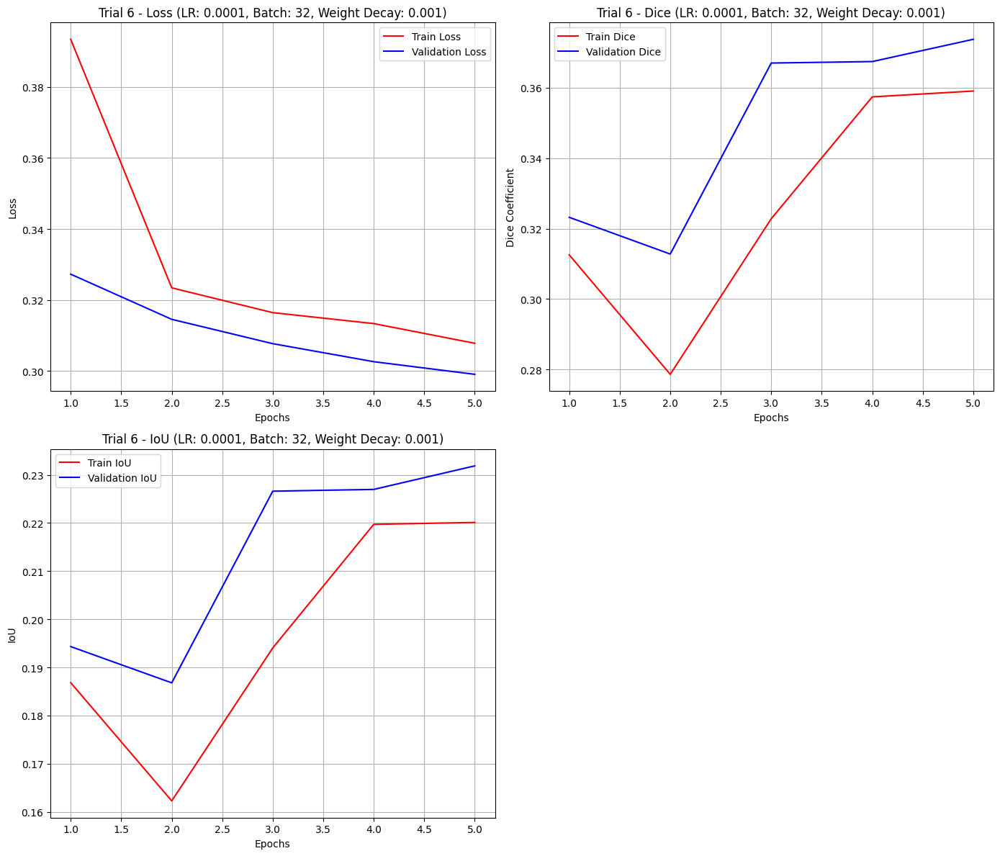

Trial 7/10 --> learning rate = 0.001, batch_size = 16, weight_decay = 0.001


Epoch 1 Training:   3%|▎         | 1/29 [00:03<01:28,  3.17s/batch]

Training Loss: 0.5754


Epoch 1 Training:   7%|▋         | 2/29 [00:06<01:25,  3.18s/batch]

Training Loss: 1.6082


Epoch 1 Training:  10%|█         | 3/29 [00:09<01:23,  3.21s/batch]

Training Loss: 0.8511


Epoch 1 Training:  14%|█▍        | 4/29 [00:12<01:20,  3.22s/batch]

Training Loss: 0.4688


Epoch 1 Training:  17%|█▋        | 5/29 [00:16<01:16,  3.21s/batch]

Training Loss: 0.3615


Epoch 1 Training:  21%|██        | 6/29 [00:19<01:13,  3.19s/batch]

Training Loss: 0.3321


Epoch 1 Training:  24%|██▍       | 7/29 [00:22<01:10,  3.22s/batch]

Training Loss: 0.3173


Epoch 1 Training:  28%|██▊       | 8/29 [00:25<01:07,  3.20s/batch]

Training Loss: 0.3194


Epoch 1 Training:  31%|███       | 9/29 [00:28<01:04,  3.20s/batch]

Training Loss: 0.2850


Epoch 1 Training:  34%|███▍      | 10/29 [00:31<01:00,  3.19s/batch]

Training Loss: 0.3584


Epoch 1 Training:  38%|███▊      | 11/29 [00:35<00:57,  3.20s/batch]

Training Loss: 0.3147


Epoch 1 Training:  41%|████▏     | 12/29 [00:38<00:54,  3.20s/batch]

Training Loss: 0.2824


Epoch 1 Training:  45%|████▍     | 13/29 [00:41<00:51,  3.21s/batch]

Training Loss: 0.3823


Epoch 1 Training:  48%|████▊     | 14/29 [00:44<00:47,  3.19s/batch]

Training Loss: 0.3729


Epoch 1 Training:  52%|█████▏    | 15/29 [00:48<00:45,  3.22s/batch]

Training Loss: 0.2757


Epoch 1 Training:  55%|█████▌    | 16/29 [00:51<00:41,  3.20s/batch]

Training Loss: 0.2827


Epoch 1 Training:  59%|█████▊    | 17/29 [00:54<00:38,  3.19s/batch]

Training Loss: 0.2949


Epoch 1 Training:  62%|██████▏   | 18/29 [00:57<00:35,  3.21s/batch]

Training Loss: 0.3600


Epoch 1 Training:  66%|██████▌   | 19/29 [01:00<00:31,  3.19s/batch]

Training Loss: 0.3465


Epoch 1 Training:  69%|██████▉   | 20/29 [01:04<00:28,  3.21s/batch]

Training Loss: 0.3332


Epoch 1 Training:  72%|███████▏  | 21/29 [01:07<00:25,  3.22s/batch]

Training Loss: 0.3195


Epoch 1 Training:  76%|███████▌  | 22/29 [01:10<00:22,  3.23s/batch]

Training Loss: 0.3236


Epoch 1 Training:  79%|███████▉  | 23/29 [01:13<00:19,  3.21s/batch]

Training Loss: 0.3042


Epoch 1 Training:  83%|████████▎ | 24/29 [01:16<00:16,  3.21s/batch]

Training Loss: 0.3086


Epoch 1 Training:  86%|████████▌ | 25/29 [01:20<00:12,  3.20s/batch]

Training Loss: 0.3460


Epoch 1 Training:  90%|████████▉ | 26/29 [01:23<00:09,  3.22s/batch]

Training Loss: 0.2853


Epoch 1 Training:  93%|█████████▎| 27/29 [01:26<00:06,  3.20s/batch]

Training Loss: 0.3331


Epoch 1 Training:  97%|█████████▋| 28/29 [01:29<00:03,  3.20s/batch]

Training Loss: 0.3279


Epoch 1 Training: 100%|██████████| 29/29 [01:30<00:00,  3.11s/batch]


Training Loss: 0.1878




Epoch 1 Validation:  12%|█▎        | 1/8 [00:02<00:20,  2.92s/batch]

Validation Loss: 0.2891


Epoch 1 Validation:  25%|██▌       | 2/8 [00:05<00:17,  2.94s/batch]

Validation Loss: 0.2837


Epoch 1 Validation:  38%|███▊      | 3/8 [00:08<00:14,  2.91s/batch]

Validation Loss: 0.3655


Epoch 1 Validation:  50%|█████     | 4/8 [00:11<00:11,  2.93s/batch]

Validation Loss: 0.2767


Epoch 1 Validation:  62%|██████▎   | 5/8 [00:14<00:08,  2.92s/batch]

Validation Loss: 0.3668


Epoch 1 Validation:  75%|███████▌  | 6/8 [00:17<00:05,  2.90s/batch]

Validation Loss: 0.3744


Epoch 1 Validation:  88%|████████▊ | 7/8 [00:20<00:02,  2.92s/batch]

Validation Loss: 0.2203


Epoch 1 Validation: 100%|██████████| 8/8 [00:23<00:00,  2.92s/batch]


Validation Loss: 0.2820
Epoch 1, Validation Loss: 0.3073, Validation Dice: 0.4131, Validation IoU: 0.2649




Epoch 2 Training:   3%|▎         | 1/29 [00:03<01:32,  3.29s/batch]

Training Loss: 0.3454


Epoch 2 Training:   7%|▋         | 2/29 [00:06<01:27,  3.23s/batch]

Training Loss: 0.2854


Epoch 2 Training:  10%|█         | 3/29 [00:09<01:24,  3.25s/batch]

Training Loss: 0.2752


Epoch 2 Training:  14%|█▍        | 4/29 [00:12<01:20,  3.23s/batch]

Training Loss: 0.3185


Epoch 2 Training:  17%|█▋        | 5/29 [00:16<01:17,  3.21s/batch]

Training Loss: 0.3007


Epoch 2 Training:  21%|██        | 6/29 [00:19<01:13,  3.21s/batch]

Training Loss: 0.2869


Epoch 2 Training:  24%|██▍       | 7/29 [00:22<01:10,  3.20s/batch]

Training Loss: 0.3171


Epoch 2 Training:  28%|██▊       | 8/29 [00:25<01:07,  3.21s/batch]

Training Loss: 0.2355


Epoch 2 Training:  31%|███       | 9/29 [00:28<01:04,  3.21s/batch]

Training Loss: 0.2487


Epoch 2 Training:  34%|███▍      | 10/29 [00:32<01:01,  3.21s/batch]

Training Loss: 0.3368


Epoch 2 Training:  38%|███▊      | 11/29 [00:35<00:57,  3.21s/batch]

Training Loss: 0.2827


Epoch 2 Training:  41%|████▏     | 12/29 [00:38<00:54,  3.21s/batch]

Training Loss: 0.2870


Epoch 2 Training:  45%|████▍     | 13/29 [00:41<00:51,  3.20s/batch]

Training Loss: 0.3411


Epoch 2 Training:  48%|████▊     | 14/29 [00:45<00:48,  3.22s/batch]

Training Loss: 0.2948


Epoch 2 Training:  52%|█████▏    | 15/29 [00:48<00:45,  3.22s/batch]

Training Loss: 0.2559


Epoch 2 Training:  55%|█████▌    | 16/29 [00:51<00:41,  3.19s/batch]

Training Loss: 0.2900


Epoch 2 Training:  59%|█████▊    | 17/29 [00:54<00:38,  3.19s/batch]

Training Loss: 0.3230


Epoch 2 Training:  62%|██████▏   | 18/29 [00:57<00:34,  3.17s/batch]

Training Loss: 0.3342


Epoch 2 Training:  66%|██████▌   | 19/29 [01:00<00:31,  3.18s/batch]

Training Loss: 0.3485


Epoch 2 Training:  69%|██████▉   | 20/29 [01:04<00:28,  3.18s/batch]

Training Loss: 0.3318


Epoch 2 Training:  72%|███████▏  | 21/29 [01:07<00:25,  3.19s/batch]

Training Loss: 0.3290


Epoch 2 Training:  76%|███████▌  | 22/29 [01:10<00:22,  3.19s/batch]

Training Loss: 0.3317


Epoch 2 Training:  79%|███████▉  | 23/29 [01:13<00:19,  3.20s/batch]

Training Loss: 0.2975


Epoch 2 Training:  83%|████████▎ | 24/29 [01:16<00:16,  3.20s/batch]

Training Loss: 0.3372


Epoch 2 Training:  86%|████████▌ | 25/29 [01:20<00:12,  3.20s/batch]

Training Loss: 0.3227


Epoch 2 Training:  90%|████████▉ | 26/29 [01:23<00:09,  3.20s/batch]

Training Loss: 0.2965


Epoch 2 Training:  93%|█████████▎| 27/29 [01:26<00:06,  3.19s/batch]

Training Loss: 0.3148


Epoch 2 Training:  97%|█████████▋| 28/29 [01:29<00:03,  3.20s/batch]

Training Loss: 0.2638


Epoch 2 Training: 100%|██████████| 29/29 [01:30<00:00,  3.11s/batch]


Training Loss: 0.2171




Epoch 2 Validation:  12%|█▎        | 1/8 [00:02<00:20,  2.94s/batch]

Validation Loss: 0.2538


Epoch 2 Validation:  25%|██▌       | 2/8 [00:05<00:17,  2.94s/batch]

Validation Loss: 0.2743


Epoch 2 Validation:  38%|███▊      | 3/8 [00:08<00:14,  2.92s/batch]

Validation Loss: 0.3457


Epoch 2 Validation:  50%|█████     | 4/8 [00:11<00:11,  2.95s/batch]

Validation Loss: 0.2565


Epoch 2 Validation:  62%|██████▎   | 5/8 [00:14<00:08,  2.94s/batch]

Validation Loss: 0.3379


Epoch 2 Validation:  75%|███████▌  | 6/8 [00:17<00:05,  2.92s/batch]

Validation Loss: 0.3673


Epoch 2 Validation:  88%|████████▊ | 7/8 [00:20<00:02,  2.93s/batch]

Validation Loss: 0.2101


Epoch 2 Validation: 100%|██████████| 8/8 [00:23<00:00,  2.94s/batch]


Validation Loss: 0.2631
Epoch 2, Validation Loss: 0.2886, Validation Dice: 0.4663, Validation IoU: 0.3097




Epoch 3 Training:   3%|▎         | 1/29 [00:03<01:28,  3.16s/batch]

Training Loss: 0.3346


Epoch 3 Training:   7%|▋         | 2/29 [00:06<01:25,  3.18s/batch]

Training Loss: 0.3016


Epoch 3 Training:  10%|█         | 3/29 [00:09<01:22,  3.19s/batch]

Training Loss: 0.3081


Epoch 3 Training:  14%|█▍        | 4/29 [00:12<01:19,  3.20s/batch]

Training Loss: 0.2511


Epoch 3 Training:  17%|█▋        | 5/29 [00:15<01:17,  3.21s/batch]

Training Loss: 0.3039


Epoch 3 Training:  21%|██        | 6/29 [00:19<01:14,  3.22s/batch]

Training Loss: 0.2704


Epoch 3 Training:  24%|██▍       | 7/29 [00:22<01:10,  3.21s/batch]

Training Loss: 0.2658


Epoch 3 Training:  28%|██▊       | 8/29 [00:25<01:07,  3.21s/batch]

Training Loss: 0.2784


Epoch 3 Training:  31%|███       | 9/29 [00:28<01:04,  3.20s/batch]

Training Loss: 0.3313


Epoch 3 Training:  34%|███▍      | 10/29 [00:32<01:00,  3.20s/batch]

Training Loss: 0.2710


Epoch 3 Training:  38%|███▊      | 11/29 [00:35<00:57,  3.19s/batch]

Training Loss: 0.2935


Epoch 3 Training:  41%|████▏     | 12/29 [00:38<00:54,  3.20s/batch]

Training Loss: 0.2984


Epoch 3 Training:  45%|████▍     | 13/29 [00:41<00:51,  3.20s/batch]

Training Loss: 0.2817


Epoch 3 Training:  48%|████▊     | 14/29 [00:44<00:48,  3.21s/batch]

Training Loss: 0.2521


Epoch 3 Training:  52%|█████▏    | 15/29 [00:48<00:45,  3.22s/batch]

Training Loss: 0.3570


Epoch 3 Training:  55%|█████▌    | 16/29 [00:51<00:41,  3.19s/batch]

Training Loss: 0.3632


Epoch 3 Training:  59%|█████▊    | 17/29 [00:54<00:38,  3.20s/batch]

Training Loss: 0.2949


Epoch 3 Training:  62%|██████▏   | 18/29 [00:57<00:35,  3.21s/batch]

Training Loss: 0.2996


Epoch 3 Training:  66%|██████▌   | 19/29 [01:00<00:32,  3.22s/batch]

Training Loss: 0.2776


Epoch 3 Training:  69%|██████▉   | 20/29 [01:04<00:28,  3.21s/batch]

Training Loss: 0.3324


Epoch 3 Training:  72%|███████▏  | 21/29 [01:07<00:25,  3.21s/batch]

Training Loss: 0.2529


Epoch 3 Training:  76%|███████▌  | 22/29 [01:10<00:22,  3.20s/batch]

Training Loss: 0.3405


Epoch 3 Training:  79%|███████▉  | 23/29 [01:13<00:19,  3.22s/batch]

Training Loss: 0.2372


Epoch 3 Training:  83%|████████▎ | 24/29 [01:17<00:16,  3.23s/batch]

Training Loss: 0.2418


Epoch 3 Training:  86%|████████▌ | 25/29 [01:20<00:12,  3.23s/batch]

Training Loss: 0.3014


Epoch 3 Training:  90%|████████▉ | 26/29 [01:23<00:09,  3.21s/batch]

Training Loss: 0.3343


Epoch 3 Training:  93%|█████████▎| 27/29 [01:26<00:06,  3.20s/batch]

Training Loss: 0.3288


Epoch 3 Training:  97%|█████████▋| 28/29 [01:29<00:03,  3.20s/batch]

Training Loss: 0.2810


Epoch 3 Training: 100%|██████████| 29/29 [01:30<00:00,  3.11s/batch]


Training Loss: 0.2890




Epoch 3 Validation:  12%|█▎        | 1/8 [00:02<00:20,  2.93s/batch]

Validation Loss: 0.2532


Epoch 3 Validation:  25%|██▌       | 2/8 [00:05<00:17,  2.95s/batch]

Validation Loss: 0.2643


Epoch 3 Validation:  38%|███▊      | 3/8 [00:08<00:14,  2.94s/batch]

Validation Loss: 0.3362


Epoch 3 Validation:  50%|█████     | 4/8 [00:11<00:11,  2.96s/batch]

Validation Loss: 0.2536


Epoch 3 Validation:  62%|██████▎   | 5/8 [00:14<00:08,  2.94s/batch]

Validation Loss: 0.3253


Epoch 3 Validation:  75%|███████▌  | 6/8 [00:17<00:05,  2.91s/batch]

Validation Loss: 0.3543


Epoch 3 Validation:  88%|████████▊ | 7/8 [00:20<00:02,  2.93s/batch]

Validation Loss: 0.2135


Epoch 3 Validation: 100%|██████████| 8/8 [00:23<00:00,  2.94s/batch]


Validation Loss: 0.2634
Epoch 3, Validation Loss: 0.2830, Validation Dice: 0.4165, Validation IoU: 0.2685




Epoch 4 Training:   3%|▎         | 1/29 [00:03<01:30,  3.25s/batch]

Training Loss: 0.2817


Epoch 4 Training:   7%|▋         | 2/29 [00:06<01:26,  3.20s/batch]

Training Loss: 0.3424


Epoch 4 Training:  10%|█         | 3/29 [00:09<01:22,  3.18s/batch]

Training Loss: 0.3754


Epoch 4 Training:  14%|█▍        | 4/29 [00:12<01:19,  3.18s/batch]

Training Loss: 0.3015


Epoch 4 Training:  17%|█▋        | 5/29 [00:15<01:16,  3.18s/batch]

Training Loss: 0.3226


Epoch 4 Training:  21%|██        | 6/29 [00:19<01:13,  3.18s/batch]

Training Loss: 0.2869


Epoch 4 Training:  24%|██▍       | 7/29 [00:22<01:10,  3.19s/batch]

Training Loss: 0.2911


Epoch 4 Training:  28%|██▊       | 8/29 [00:25<01:07,  3.20s/batch]

Training Loss: 0.2839


Epoch 4 Training:  31%|███       | 9/29 [00:28<01:04,  3.21s/batch]

Training Loss: 0.3322


Epoch 4 Training:  34%|███▍      | 10/29 [00:31<01:00,  3.21s/batch]

Training Loss: 0.3052


Epoch 4 Training:  38%|███▊      | 11/29 [00:35<00:57,  3.20s/batch]

Training Loss: 0.2895


Epoch 4 Training:  41%|████▏     | 12/29 [00:38<00:54,  3.20s/batch]

Training Loss: 0.2705


Epoch 4 Training:  45%|████▍     | 13/29 [00:41<00:51,  3.21s/batch]

Training Loss: 0.2800


Epoch 4 Training:  48%|████▊     | 14/29 [00:44<00:48,  3.22s/batch]

Training Loss: 0.2623


Epoch 4 Training:  52%|█████▏    | 15/29 [00:48<00:44,  3.21s/batch]

Training Loss: 0.2483


Epoch 4 Training:  55%|█████▌    | 16/29 [00:51<00:41,  3.20s/batch]

Training Loss: 0.2851


Epoch 4 Training:  59%|█████▊    | 17/29 [00:54<00:38,  3.20s/batch]

Training Loss: 0.2333


Epoch 4 Training:  62%|██████▏   | 18/29 [00:57<00:35,  3.20s/batch]

Training Loss: 0.2622


Epoch 4 Training:  66%|██████▌   | 19/29 [01:00<00:31,  3.20s/batch]

Training Loss: 0.2863


Epoch 4 Training:  69%|██████▉   | 20/29 [01:03<00:28,  3.20s/batch]

Training Loss: 0.3410


Epoch 4 Training:  72%|███████▏  | 21/29 [01:07<00:25,  3.20s/batch]

Training Loss: 0.3055


Epoch 4 Training:  76%|███████▌  | 22/29 [01:10<00:22,  3.18s/batch]

Training Loss: 0.3412


Epoch 4 Training:  79%|███████▉  | 23/29 [01:13<00:19,  3.20s/batch]

Training Loss: 0.2832


Epoch 4 Training:  83%|████████▎ | 24/29 [01:16<00:16,  3.20s/batch]

Training Loss: 0.3217


Epoch 4 Training:  86%|████████▌ | 25/29 [01:20<00:12,  3.21s/batch]

Training Loss: 0.2802


Epoch 4 Training:  90%|████████▉ | 26/29 [01:23<00:09,  3.22s/batch]

Training Loss: 0.3142


Epoch 4 Training:  93%|█████████▎| 27/29 [01:26<00:06,  3.20s/batch]

Training Loss: 0.2880


Epoch 4 Training:  97%|█████████▋| 28/29 [01:29<00:03,  3.21s/batch]

Training Loss: 0.2481


Epoch 4 Training: 100%|██████████| 29/29 [01:30<00:00,  3.11s/batch]


Training Loss: 0.2871




Epoch 4 Validation:  12%|█▎        | 1/8 [00:02<00:20,  2.91s/batch]

Validation Loss: 0.2460


Epoch 4 Validation:  25%|██▌       | 2/8 [00:05<00:17,  2.94s/batch]

Validation Loss: 0.2579


Epoch 4 Validation:  38%|███▊      | 3/8 [00:08<00:14,  2.91s/batch]

Validation Loss: 0.3332


Epoch 4 Validation:  50%|█████     | 4/8 [00:11<00:11,  2.93s/batch]

Validation Loss: 0.2489


Epoch 4 Validation:  62%|██████▎   | 5/8 [00:14<00:08,  2.93s/batch]

Validation Loss: 0.3192


Epoch 4 Validation:  75%|███████▌  | 6/8 [00:17<00:05,  2.91s/batch]

Validation Loss: 0.3591


Epoch 4 Validation:  88%|████████▊ | 7/8 [00:20<00:02,  2.92s/batch]

Validation Loss: 0.2090


Epoch 4 Validation: 100%|██████████| 8/8 [00:23<00:00,  2.92s/batch]


Validation Loss: 0.2567
Epoch 4, Validation Loss: 0.2787, Validation Dice: 0.4174, Validation IoU: 0.2696




Epoch 5 Training:   3%|▎         | 1/29 [00:03<01:28,  3.17s/batch]

Training Loss: 0.3227


Epoch 5 Training:   7%|▋         | 2/29 [00:06<01:26,  3.20s/batch]

Training Loss: 0.3469


Epoch 5 Training:  10%|█         | 3/29 [00:09<01:23,  3.21s/batch]

Training Loss: 0.2628


Epoch 5 Training:  14%|█▍        | 4/29 [00:12<01:19,  3.19s/batch]

Training Loss: 0.3183


Epoch 5 Training:  17%|█▋        | 5/29 [00:15<01:16,  3.20s/batch]

Training Loss: 0.2996


Epoch 5 Training:  21%|██        | 6/29 [00:19<01:13,  3.20s/batch]

Training Loss: 0.2874


Epoch 5 Training:  24%|██▍       | 7/29 [00:22<01:10,  3.22s/batch]

Training Loss: 0.2872


Epoch 5 Training:  28%|██▊       | 8/29 [00:25<01:07,  3.20s/batch]

Training Loss: 0.3228


Epoch 5 Training:  31%|███       | 9/29 [00:28<01:04,  3.22s/batch]

Training Loss: 0.3130


Epoch 5 Training:  34%|███▍      | 10/29 [00:32<01:01,  3.22s/batch]

Training Loss: 0.3472


Epoch 5 Training:  38%|███▊      | 11/29 [00:35<00:58,  3.23s/batch]

Training Loss: 0.2534


Epoch 5 Training:  41%|████▏     | 12/29 [00:38<00:54,  3.23s/batch]

Training Loss: 0.3022


Epoch 5 Training:  45%|████▍     | 13/29 [00:41<00:51,  3.25s/batch]

Training Loss: 0.2833


Epoch 5 Training:  48%|████▊     | 14/29 [00:45<00:48,  3.24s/batch]

Training Loss: 0.2554


Epoch 5 Training:  52%|█████▏    | 15/29 [00:48<00:45,  3.23s/batch]

Training Loss: 0.3188


Epoch 5 Training:  55%|█████▌    | 16/29 [00:51<00:41,  3.23s/batch]

Training Loss: 0.3258


Epoch 5 Training:  59%|█████▊    | 17/29 [00:54<00:38,  3.23s/batch]

Training Loss: 0.2392


Epoch 5 Training:  62%|██████▏   | 18/29 [00:58<00:35,  3.24s/batch]

Training Loss: 0.2697


Epoch 5 Training:  66%|██████▌   | 19/29 [01:01<00:32,  3.24s/batch]

Training Loss: 0.2705


Epoch 5 Training:  69%|██████▉   | 20/29 [01:04<00:29,  3.24s/batch]

Training Loss: 0.3105


Epoch 5 Training:  72%|███████▏  | 21/29 [01:07<00:25,  3.24s/batch]

Training Loss: 0.2737


Epoch 5 Training:  76%|███████▌  | 22/29 [01:10<00:22,  3.24s/batch]

Training Loss: 0.2116


Epoch 5 Training:  79%|███████▉  | 23/29 [01:14<00:19,  3.23s/batch]

Training Loss: 0.2699


Epoch 5 Training:  83%|████████▎ | 24/29 [01:17<00:16,  3.23s/batch]

Training Loss: 0.3356


Epoch 5 Training:  86%|████████▌ | 25/29 [01:20<00:12,  3.24s/batch]

Training Loss: 0.2678


Epoch 5 Training:  90%|████████▉ | 26/29 [01:23<00:09,  3.23s/batch]

Training Loss: 0.2462


Epoch 5 Training:  93%|█████████▎| 27/29 [01:27<00:06,  3.23s/batch]

Training Loss: 0.3293


Epoch 5 Training:  97%|█████████▋| 28/29 [01:30<00:03,  3.24s/batch]

Training Loss: 0.2586


Epoch 5 Training: 100%|██████████| 29/29 [01:30<00:00,  3.13s/batch]


Training Loss: 0.3588




Epoch 5 Validation:  12%|█▎        | 1/8 [00:02<00:20,  2.95s/batch]

Validation Loss: 0.2497


Epoch 5 Validation:  25%|██▌       | 2/8 [00:05<00:17,  2.96s/batch]

Validation Loss: 0.2666


Epoch 5 Validation:  38%|███▊      | 3/8 [00:08<00:14,  2.97s/batch]

Validation Loss: 0.3432


Epoch 5 Validation:  50%|█████     | 4/8 [00:11<00:11,  2.98s/batch]

Validation Loss: 0.2449


Epoch 5 Validation:  62%|██████▎   | 5/8 [00:14<00:08,  2.97s/batch]

Validation Loss: 0.3378


Epoch 5 Validation:  75%|███████▌  | 6/8 [00:17<00:05,  2.93s/batch]

Validation Loss: 0.3680


Epoch 5 Validation:  88%|████████▊ | 7/8 [00:20<00:02,  2.94s/batch]

Validation Loss: 0.1988


Epoch 5 Validation: 100%|██████████| 8/8 [00:23<00:00,  2.95s/batch]


Validation Loss: 0.2482
Epoch 5, Validation Loss: 0.2821, Validation Dice: 0.4248, Validation IoU: 0.2753




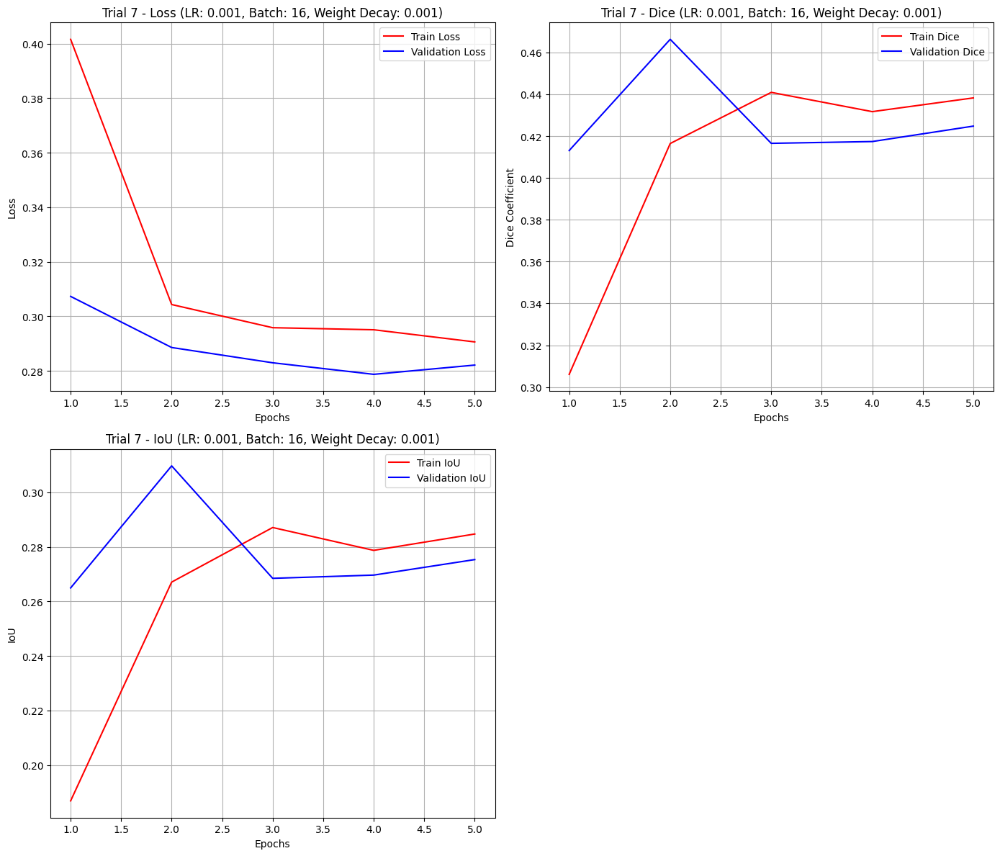

Trial 8/10 --> learning rate = 0.0001, batch_size = 64, weight_decay = 0.0001


Epoch 1 Training:  12%|█▎        | 1/8 [00:12<01:29, 12.79s/batch]

Training Loss: 0.5712


Epoch 1 Training:  25%|██▌       | 2/8 [00:25<01:17, 12.89s/batch]

Training Loss: 0.4675


Epoch 1 Training:  38%|███▊      | 3/8 [00:39<01:07, 13.42s/batch]

Training Loss: 0.4703


Epoch 1 Training:  50%|█████     | 4/8 [00:52<00:52, 13.17s/batch]

Training Loss: 0.4104


Epoch 1 Training:  62%|██████▎   | 5/8 [01:06<00:40, 13.35s/batch]

Training Loss: 0.3983


Epoch 1 Training:  75%|███████▌  | 6/8 [01:19<00:26, 13.26s/batch]

Training Loss: 0.4062


Epoch 1 Training:  88%|████████▊ | 7/8 [01:32<00:13, 13.08s/batch]

Training Loss: 0.3518


Epoch 1 Training: 100%|██████████| 8/8 [01:32<00:00, 11.56s/batch]


Training Loss: 0.6646




Epoch 1 Validation:  50%|█████     | 1/2 [00:11<00:11, 11.72s/batch]

Validation Loss: 0.3322


Epoch 1 Validation: 100%|██████████| 2/2 [00:23<00:00, 11.76s/batch]


Validation Loss: 0.3663
Epoch 1, Validation Loss: 0.3493, Validation Dice: 0.3369, Validation IoU: 0.2026




Epoch 2 Training:  12%|█▎        | 1/8 [00:12<01:29, 12.83s/batch]

Training Loss: 0.3388


Epoch 2 Training:  25%|██▌       | 2/8 [00:26<01:18, 13.13s/batch]

Training Loss: 0.3166


Epoch 2 Training:  38%|███▊      | 3/8 [00:39<01:05, 13.20s/batch]

Training Loss: 0.3322


Epoch 2 Training:  50%|█████     | 4/8 [00:52<00:52, 13.03s/batch]

Training Loss: 0.3527


Epoch 2 Training:  62%|██████▎   | 5/8 [01:05<00:38, 12.98s/batch]

Training Loss: 0.3481


Epoch 2 Training:  75%|███████▌  | 6/8 [01:18<00:26, 13.13s/batch]

Training Loss: 0.3211


Epoch 2 Training:  88%|████████▊ | 7/8 [01:32<00:13, 13.26s/batch]

Training Loss: 0.3708


Epoch 2 Training: 100%|██████████| 8/8 [01:32<00:00, 11.56s/batch]


Training Loss: 0.3118




Epoch 2 Validation:  50%|█████     | 1/2 [00:11<00:11, 11.63s/batch]

Validation Loss: 0.3119


Epoch 2 Validation: 100%|██████████| 2/2 [00:23<00:00, 11.70s/batch]


Validation Loss: 0.3371
Epoch 2, Validation Loss: 0.3245, Validation Dice: 0.2976, Validation IoU: 0.1749




Epoch 3 Training:  12%|█▎        | 1/8 [00:12<01:30, 12.88s/batch]

Training Loss: 0.3187


Epoch 3 Training:  25%|██▌       | 2/8 [00:26<01:19, 13.24s/batch]

Training Loss: 0.3177


Epoch 3 Training:  38%|███▊      | 3/8 [00:39<01:05, 13.11s/batch]

Training Loss: 0.3435


Epoch 3 Training:  50%|█████     | 4/8 [00:52<00:52, 13.04s/batch]

Training Loss: 0.3115


Epoch 3 Training:  62%|██████▎   | 5/8 [01:05<00:39, 13.13s/batch]

Training Loss: 0.3368


Epoch 3 Training:  75%|███████▌  | 6/8 [01:18<00:26, 13.09s/batch]

Training Loss: 0.3238


Epoch 3 Training:  88%|████████▊ | 7/8 [01:31<00:13, 13.14s/batch]

Training Loss: 0.3222


Epoch 3 Training: 100%|██████████| 8/8 [01:32<00:00, 11.53s/batch]


Training Loss: 0.3719




Epoch 3 Validation:  50%|█████     | 1/2 [00:11<00:11, 11.72s/batch]

Validation Loss: 0.3066


Epoch 3 Validation: 100%|██████████| 2/2 [00:24<00:00, 12.15s/batch]


Validation Loss: 0.3281
Epoch 3, Validation Loss: 0.3174, Validation Dice: 0.2743, Validation IoU: 0.1592




Epoch 4 Training:  12%|█▎        | 1/8 [00:13<01:32, 13.24s/batch]

Training Loss: 0.3186


Epoch 4 Training:  25%|██▌       | 2/8 [00:27<01:22, 13.71s/batch]

Training Loss: 0.2945


Epoch 4 Training:  38%|███▊      | 3/8 [00:40<01:06, 13.31s/batch]

Training Loss: 0.3281


Epoch 4 Training:  50%|█████     | 4/8 [00:53<00:53, 13.45s/batch]

Training Loss: 0.3185


Epoch 4 Training:  62%|██████▎   | 5/8 [01:06<00:39, 13.27s/batch]

Training Loss: 0.3185


Epoch 4 Training:  75%|███████▌  | 6/8 [01:19<00:26, 13.09s/batch]

Training Loss: 0.3261


Epoch 4 Training:  88%|████████▊ | 7/8 [01:32<00:12, 12.96s/batch]

Training Loss: 0.3220


Epoch 4 Training: 100%|██████████| 8/8 [01:32<00:00, 11.57s/batch]


Training Loss: 0.4933




Epoch 4 Validation:  50%|█████     | 1/2 [00:11<00:11, 11.70s/batch]

Validation Loss: 0.3037


Epoch 4 Validation: 100%|██████████| 2/2 [00:24<00:00, 12.03s/batch]


Validation Loss: 0.3221
Epoch 4, Validation Loss: 0.3129, Validation Dice: 0.3183, Validation IoU: 0.1894




Epoch 5 Training:  12%|█▎        | 1/8 [00:12<01:29, 12.80s/batch]

Training Loss: 0.3300


Epoch 5 Training:  25%|██▌       | 2/8 [00:26<01:18, 13.09s/batch]

Training Loss: 0.2953


Epoch 5 Training:  38%|███▊      | 3/8 [00:39<01:05, 13.13s/batch]

Training Loss: 0.3094


Epoch 5 Training:  50%|█████     | 4/8 [00:52<00:52, 13.08s/batch]

Training Loss: 0.3259


Epoch 5 Training:  62%|██████▎   | 5/8 [01:05<00:39, 13.11s/batch]

Training Loss: 0.3315


Epoch 5 Training:  75%|███████▌  | 6/8 [01:18<00:26, 13.09s/batch]

Training Loss: 0.3122


Epoch 5 Training:  88%|████████▊ | 7/8 [01:31<00:13, 13.07s/batch]

Training Loss: 0.3079


Epoch 5 Training: 100%|██████████| 8/8 [01:31<00:00, 11.49s/batch]


Training Loss: 0.2182




Epoch 5 Validation:  50%|█████     | 1/2 [00:11<00:11, 11.66s/batch]

Validation Loss: 0.2989


Epoch 5 Validation: 100%|██████████| 2/2 [00:23<00:00, 11.98s/batch]


Validation Loss: 0.3164
Epoch 5, Validation Loss: 0.3077, Validation Dice: 0.3320, Validation IoU: 0.1991




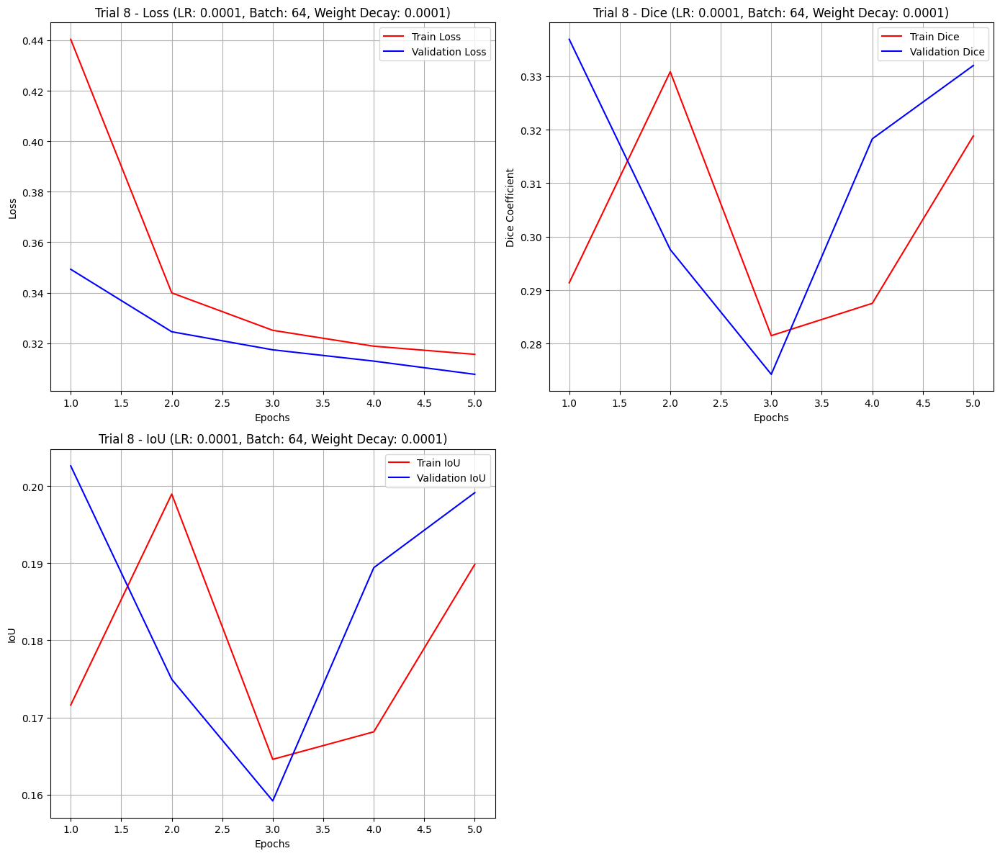

Trial 9/10 --> learning rate = 0.0001, batch_size = 64, weight_decay = 0.0001


Epoch 1 Training:  12%|█▎        | 1/8 [00:13<01:32, 13.21s/batch]

Training Loss: 0.4744


Epoch 1 Training:  25%|██▌       | 2/8 [00:27<01:23, 13.92s/batch]

Training Loss: 0.4738


Epoch 1 Training:  38%|███▊      | 3/8 [00:40<01:07, 13.53s/batch]

Training Loss: 0.4833


Epoch 1 Training:  50%|█████     | 4/8 [00:54<00:54, 13.69s/batch]

Training Loss: 0.5006


Epoch 1 Training:  62%|██████▎   | 5/8 [01:08<00:41, 13.69s/batch]

Training Loss: 0.4098


Epoch 1 Training:  75%|███████▌  | 6/8 [01:22<00:27, 13.76s/batch]

Training Loss: 0.4033


Epoch 1 Training:  88%|████████▊ | 7/8 [01:35<00:13, 13.48s/batch]

Training Loss: 0.3625


Epoch 1 Training: 100%|██████████| 8/8 [01:35<00:00, 11.95s/batch]


Training Loss: 0.2774




Epoch 1 Validation:  50%|█████     | 1/2 [00:12<00:12, 12.06s/batch]

Validation Loss: 0.3316


Epoch 1 Validation: 100%|██████████| 2/2 [00:24<00:00, 12.44s/batch]


Validation Loss: 0.3631
Epoch 1, Validation Loss: 0.3473, Validation Dice: 0.3346, Validation IoU: 0.2010




Epoch 2 Training:  12%|█▎        | 1/8 [00:13<01:31, 13.11s/batch]

Training Loss: 0.3415


Epoch 2 Training:  25%|██▌       | 2/8 [00:27<01:21, 13.58s/batch]

Training Loss: 0.3443


Epoch 2 Training:  38%|███▊      | 3/8 [00:40<01:06, 13.36s/batch]

Training Loss: 0.3134


Epoch 2 Training:  50%|█████     | 4/8 [00:53<00:54, 13.56s/batch]

Training Loss: 0.3455


Epoch 2 Training:  62%|██████▎   | 5/8 [01:06<00:40, 13.36s/batch]

Training Loss: 0.3403


Epoch 2 Training:  75%|███████▌  | 6/8 [01:19<00:26, 13.21s/batch]

Training Loss: 0.3754


Epoch 2 Training:  88%|████████▊ | 7/8 [01:32<00:13, 13.09s/batch]

Training Loss: 0.3050


Epoch 2 Training: 100%|██████████| 8/8 [01:33<00:00, 11.65s/batch]


Training Loss: 0.4495




Epoch 2 Validation:  50%|█████     | 1/2 [00:12<00:12, 12.08s/batch]

Validation Loss: 0.3109


Epoch 2 Validation: 100%|██████████| 2/2 [00:25<00:00, 12.60s/batch]


Validation Loss: 0.3357
Epoch 2, Validation Loss: 0.3233, Validation Dice: 0.3091, Validation IoU: 0.1830




Epoch 3 Training:  12%|█▎        | 1/8 [00:13<01:35, 13.69s/batch]

Training Loss: 0.3402


Epoch 3 Training:  25%|██▌       | 2/8 [00:27<01:23, 13.90s/batch]

Training Loss: 0.3212


Epoch 3 Training:  38%|███▊      | 3/8 [00:41<01:08, 13.77s/batch]

Training Loss: 0.3099


Epoch 3 Training:  50%|█████     | 4/8 [00:55<00:55, 13.92s/batch]

Training Loss: 0.3412


Epoch 3 Training:  62%|██████▎   | 5/8 [01:09<00:41, 13.88s/batch]

Training Loss: 0.3053


Epoch 3 Training:  75%|███████▌  | 6/8 [01:23<00:27, 13.85s/batch]

Training Loss: 0.3348


Epoch 3 Training:  88%|████████▊ | 7/8 [01:36<00:13, 13.79s/batch]

Training Loss: 0.3097


Epoch 3 Training: 100%|██████████| 8/8 [01:37<00:00, 12.15s/batch]


Training Loss: 0.2684




Epoch 3 Validation:  50%|█████     | 1/2 [00:11<00:11, 11.95s/batch]

Validation Loss: 0.3050


Epoch 3 Validation: 100%|██████████| 2/2 [00:23<00:00, 11.98s/batch]


Validation Loss: 0.3261
Epoch 3, Validation Loss: 0.3156, Validation Dice: 0.2884, Validation IoU: 0.1688




Epoch 4 Training:  12%|█▎        | 1/8 [00:12<01:30, 12.91s/batch]

Training Loss: 0.3332


Epoch 4 Training:  25%|██▌       | 2/8 [00:26<01:20, 13.38s/batch]

Training Loss: 0.3133


Epoch 4 Training:  38%|███▊      | 3/8 [00:39<01:06, 13.33s/batch]

Training Loss: 0.2979


Epoch 4 Training:  50%|█████     | 4/8 [00:53<00:53, 13.37s/batch]

Training Loss: 0.3208


Epoch 4 Training:  62%|██████▎   | 5/8 [01:06<00:39, 13.21s/batch]

Training Loss: 0.3312


Epoch 4 Training:  75%|███████▌  | 6/8 [01:19<00:26, 13.09s/batch]

Training Loss: 0.3216


Epoch 4 Training:  88%|████████▊ | 7/8 [01:32<00:13, 13.05s/batch]

Training Loss: 0.3097


Epoch 4 Training: 100%|██████████| 8/8 [01:32<00:00, 11.56s/batch]


Training Loss: 0.2476




Epoch 4 Validation:  50%|█████     | 1/2 [00:11<00:11, 11.76s/batch]

Validation Loss: 0.3011


Epoch 4 Validation: 100%|██████████| 2/2 [00:23<00:00, 11.80s/batch]


Validation Loss: 0.3203
Epoch 4, Validation Loss: 0.3107, Validation Dice: 0.3282, Validation IoU: 0.1964




Epoch 5 Training:  12%|█▎        | 1/8 [00:12<01:30, 12.99s/batch]

Training Loss: 0.3367


Epoch 5 Training:  25%|██▌       | 2/8 [00:26<01:18, 13.13s/batch]

Training Loss: 0.3233


Epoch 5 Training:  38%|███▊      | 3/8 [00:39<01:05, 13.04s/batch]

Training Loss: 0.2952


Epoch 5 Training:  50%|█████     | 4/8 [00:52<00:52, 13.14s/batch]

Training Loss: 0.3308


Epoch 5 Training:  62%|██████▎   | 5/8 [01:05<00:39, 13.19s/batch]

Training Loss: 0.3245


Epoch 5 Training:  75%|███████▌  | 6/8 [01:18<00:26, 13.14s/batch]

Training Loss: 0.2925


Epoch 5 Training:  88%|████████▊ | 7/8 [01:31<00:13, 13.01s/batch]

Training Loss: 0.2961


Epoch 5 Training: 100%|██████████| 8/8 [01:32<00:00, 11.50s/batch]


Training Loss: 0.3350




Epoch 5 Validation:  50%|█████     | 1/2 [00:11<00:11, 11.68s/batch]

Validation Loss: 0.2979


Epoch 5 Validation: 100%|██████████| 2/2 [00:24<00:00, 12.15s/batch]


Validation Loss: 0.3168
Epoch 5, Validation Loss: 0.3073, Validation Dice: 0.3619, Validation IoU: 0.2210




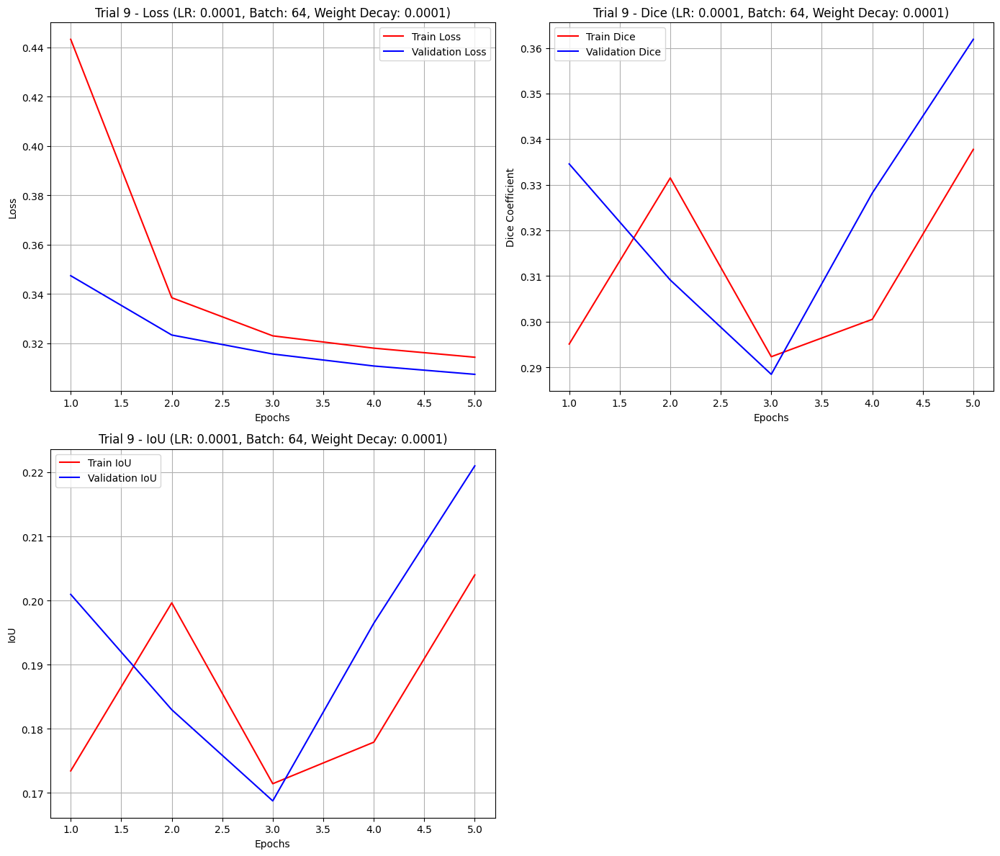

Trial 10/10 --> learning rate = 0.001, batch_size = 32, weight_decay = 0.0001


Epoch 1 Training:   7%|▋         | 1/15 [00:06<01:28,  6.30s/batch]

Training Loss: 0.4836


Epoch 1 Training:  13%|█▎        | 2/15 [00:13<01:27,  6.70s/batch]

Training Loss: 0.9187


Epoch 1 Training:  20%|██        | 3/15 [00:19<01:18,  6.55s/batch]

Training Loss: 0.5239


Epoch 1 Training:  27%|██▋       | 4/15 [00:26<01:13,  6.68s/batch]

Training Loss: 0.3500


Epoch 1 Training:  33%|███▎      | 5/15 [00:32<01:05,  6.56s/batch]

Training Loss: 0.3396


Epoch 1 Training:  40%|████      | 6/15 [00:39<01:00,  6.70s/batch]

Training Loss: 0.3318


Epoch 1 Training:  47%|████▋     | 7/15 [00:46<00:52,  6.58s/batch]

Training Loss: 0.3239


Epoch 1 Training:  53%|█████▎    | 8/15 [00:53<00:46,  6.69s/batch]

Training Loss: 0.3246


Epoch 1 Training:  60%|██████    | 9/15 [00:59<00:39,  6.59s/batch]

Training Loss: 0.3063


Epoch 1 Training:  67%|██████▋   | 10/15 [01:06<00:33,  6.73s/batch]

Training Loss: 0.3086


Epoch 1 Training:  73%|███████▎  | 11/15 [01:12<00:26,  6.62s/batch]

Training Loss: 0.3071


Epoch 1 Training:  80%|████████  | 12/15 [01:19<00:20,  6.70s/batch]

Training Loss: 0.3228


Epoch 1 Training:  87%|████████▋ | 13/15 [01:26<00:13,  6.60s/batch]

Training Loss: 0.3148


Epoch 1 Training:  93%|█████████▎| 14/15 [01:32<00:06,  6.67s/batch]

Training Loss: 0.2976


Epoch 1 Training: 100%|██████████| 15/15 [01:33<00:00,  6.23s/batch]


Training Loss: 0.2985




Epoch 1 Validation:  25%|██▌       | 1/4 [00:05<00:17,  5.91s/batch]

Validation Loss: 0.2802


Epoch 1 Validation:  50%|█████     | 2/4 [00:12<00:12,  6.21s/batch]

Validation Loss: 0.3209


Epoch 1 Validation:  75%|███████▌  | 3/4 [00:18<00:06,  6.01s/batch]

Validation Loss: 0.3767


Epoch 1 Validation: 100%|██████████| 4/4 [00:24<00:00,  6.09s/batch]


Validation Loss: 0.2524
Epoch 1, Validation Loss: 0.3076, Validation Dice: 0.3938, Validation IoU: 0.2475




Epoch 2 Training:   7%|▋         | 1/15 [00:06<01:28,  6.35s/batch]

Training Loss: 0.3404


Epoch 2 Training:  13%|█▎        | 2/15 [00:13<01:26,  6.66s/batch]

Training Loss: 0.3167


Epoch 2 Training:  20%|██        | 3/15 [00:19<01:18,  6.54s/batch]

Training Loss: 0.2899


Epoch 2 Training:  27%|██▋       | 4/15 [00:26<01:13,  6.67s/batch]

Training Loss: 0.3824


Epoch 2 Training:  33%|███▎      | 5/15 [00:32<01:05,  6.56s/batch]

Training Loss: 0.2912


Epoch 2 Training:  40%|████      | 6/15 [00:39<00:59,  6.65s/batch]

Training Loss: 0.3201


Epoch 2 Training:  47%|████▋     | 7/15 [00:46<00:52,  6.57s/batch]

Training Loss: 0.3153


Epoch 2 Training:  53%|█████▎    | 8/15 [00:52<00:46,  6.67s/batch]

Training Loss: 0.3022


Epoch 2 Training:  60%|██████    | 9/15 [00:59<00:39,  6.56s/batch]

Training Loss: 0.2765


Epoch 2 Training:  67%|██████▋   | 10/15 [01:06<00:33,  6.66s/batch]

Training Loss: 0.3103


Epoch 2 Training:  73%|███████▎  | 11/15 [01:12<00:26,  6.58s/batch]

Training Loss: 0.3201


Epoch 2 Training:  80%|████████  | 12/15 [01:19<00:20,  6.69s/batch]

Training Loss: 0.2985


Epoch 2 Training:  87%|████████▋ | 13/15 [01:25<00:13,  6.57s/batch]

Training Loss: 0.2942


Epoch 2 Training:  93%|█████████▎| 14/15 [01:32<00:06,  6.68s/batch]

Training Loss: 0.2929


Epoch 2 Training: 100%|██████████| 15/15 [01:33<00:00,  6.21s/batch]


Training Loss: 0.1733




Epoch 2 Validation:  25%|██▌       | 1/4 [00:05<00:17,  5.85s/batch]

Validation Loss: 0.2858


Epoch 2 Validation:  50%|█████     | 2/4 [00:12<00:12,  6.23s/batch]

Validation Loss: 0.3251


Epoch 2 Validation:  75%|███████▌  | 3/4 [00:18<00:06,  6.04s/batch]

Validation Loss: 0.3780


Epoch 2 Validation: 100%|██████████| 4/4 [00:24<00:00,  6.14s/batch]


Validation Loss: 0.2479
Epoch 2, Validation Loss: 0.3092, Validation Dice: 0.3891, Validation IoU: 0.2441




Epoch 3 Training:   7%|▋         | 1/15 [00:06<01:29,  6.40s/batch]

Training Loss: 0.3208


Epoch 3 Training:  13%|█▎        | 2/15 [00:13<01:26,  6.66s/batch]

Training Loss: 0.2863


Epoch 3 Training:  20%|██        | 3/15 [00:20<01:20,  6.74s/batch]

Training Loss: 0.3117


Epoch 3 Training:  27%|██▋       | 4/15 [00:26<01:14,  6.80s/batch]

Training Loss: 0.2986


Epoch 3 Training:  33%|███▎      | 5/15 [00:33<01:08,  6.80s/batch]

Training Loss: 0.3063


Epoch 3 Training:  40%|████      | 6/15 [00:40<01:01,  6.80s/batch]

Training Loss: 0.3017


Epoch 3 Training:  47%|████▋     | 7/15 [00:46<00:53,  6.67s/batch]

Training Loss: 0.3101


Epoch 3 Training:  53%|█████▎    | 8/15 [00:53<00:47,  6.72s/batch]

Training Loss: 0.3139


Epoch 3 Training:  60%|██████    | 9/15 [01:00<00:39,  6.62s/batch]

Training Loss: 0.3187


Epoch 3 Training:  67%|██████▋   | 10/15 [01:07<00:33,  6.69s/batch]

Training Loss: 0.2819


Epoch 3 Training:  73%|███████▎  | 11/15 [01:13<00:26,  6.57s/batch]

Training Loss: 0.3089


Epoch 3 Training:  80%|████████  | 12/15 [01:20<00:20,  6.67s/batch]

Training Loss: 0.3119


Epoch 3 Training:  87%|████████▋ | 13/15 [01:26<00:13,  6.56s/batch]

Training Loss: 0.3393


Epoch 3 Training:  93%|█████████▎| 14/15 [01:33<00:06,  6.66s/batch]

Training Loss: 0.2713


Epoch 3 Training: 100%|██████████| 15/15 [01:33<00:00,  6.26s/batch]


Training Loss: 0.3453




Epoch 3 Validation:  25%|██▌       | 1/4 [00:05<00:17,  5.83s/batch]

Validation Loss: 0.2657


Epoch 3 Validation:  50%|█████     | 2/4 [00:12<00:12,  6.16s/batch]

Validation Loss: 0.3019


Epoch 3 Validation:  75%|███████▌  | 3/4 [00:18<00:05,  5.99s/batch]

Validation Loss: 0.3544


Epoch 3 Validation: 100%|██████████| 4/4 [00:24<00:00,  6.06s/batch]


Validation Loss: 0.2397
Epoch 3, Validation Loss: 0.2904, Validation Dice: 0.4442, Validation IoU: 0.2888




Epoch 4 Training:   7%|▋         | 1/15 [00:06<01:28,  6.32s/batch]

Training Loss: 0.2806


Epoch 4 Training:  13%|█▎        | 2/15 [00:13<01:26,  6.62s/batch]

Training Loss: 0.2945


Epoch 4 Training:  20%|██        | 3/15 [00:19<01:17,  6.50s/batch]

Training Loss: 0.3121


Epoch 4 Training:  27%|██▋       | 4/15 [00:26<01:12,  6.61s/batch]

Training Loss: 0.3005


Epoch 4 Training:  33%|███▎      | 5/15 [00:32<01:05,  6.51s/batch]

Training Loss: 0.3347


Epoch 4 Training:  40%|████      | 6/15 [00:39<00:59,  6.64s/batch]

Training Loss: 0.3308


Epoch 4 Training:  47%|████▋     | 7/15 [00:45<00:52,  6.54s/batch]

Training Loss: 0.2747


Epoch 4 Training:  53%|█████▎    | 8/15 [00:52<00:46,  6.71s/batch]

Training Loss: 0.3249


Epoch 4 Training:  60%|██████    | 9/15 [00:59<00:39,  6.57s/batch]

Training Loss: 0.3231


Epoch 4 Training:  67%|██████▋   | 10/15 [01:06<00:33,  6.66s/batch]

Training Loss: 0.2832


Epoch 4 Training:  73%|███████▎  | 11/15 [01:12<00:26,  6.57s/batch]

Training Loss: 0.2743


Epoch 4 Training:  80%|████████  | 12/15 [01:19<00:19,  6.64s/batch]

Training Loss: 0.2872


Epoch 4 Training:  87%|████████▋ | 13/15 [01:25<00:13,  6.55s/batch]

Training Loss: 0.2388


Epoch 4 Training:  93%|█████████▎| 14/15 [01:32<00:06,  6.65s/batch]

Training Loss: 0.2897


Epoch 4 Training: 100%|██████████| 15/15 [01:32<00:00,  6.19s/batch]


Training Loss: 0.4489




Epoch 4 Validation:  25%|██▌       | 1/4 [00:05<00:17,  5.89s/batch]

Validation Loss: 0.2608


Epoch 4 Validation:  50%|█████     | 2/4 [00:12<00:12,  6.18s/batch]

Validation Loss: 0.3082


Epoch 4 Validation:  75%|███████▌  | 3/4 [00:18<00:05,  5.99s/batch]

Validation Loss: 0.3629


Epoch 4 Validation: 100%|██████████| 4/4 [00:24<00:00,  6.08s/batch]


Validation Loss: 0.2291
Epoch 4, Validation Loss: 0.2902, Validation Dice: 0.4507, Validation IoU: 0.2948




Epoch 5 Training:   7%|▋         | 1/15 [00:06<01:28,  6.31s/batch]

Training Loss: 0.3267


Epoch 5 Training:  13%|█▎        | 2/15 [00:13<01:26,  6.63s/batch]

Training Loss: 0.2518


Epoch 5 Training:  20%|██        | 3/15 [00:19<01:17,  6.50s/batch]

Training Loss: 0.2869


Epoch 5 Training:  27%|██▋       | 4/15 [00:26<01:13,  6.67s/batch]

Training Loss: 0.2861


Epoch 5 Training:  33%|███▎      | 5/15 [00:32<01:05,  6.55s/batch]

Training Loss: 0.2970


Epoch 5 Training:  40%|████      | 6/15 [00:39<00:59,  6.67s/batch]

Training Loss: 0.2797


Epoch 5 Training:  47%|████▋     | 7/15 [00:45<00:52,  6.54s/batch]

Training Loss: 0.3350


Epoch 5 Training:  53%|█████▎    | 8/15 [00:52<00:46,  6.68s/batch]

Training Loss: 0.2483


Epoch 5 Training:  60%|██████    | 9/15 [00:59<00:39,  6.58s/batch]

Training Loss: 0.3108


Epoch 5 Training:  67%|██████▋   | 10/15 [01:06<00:33,  6.71s/batch]

Training Loss: 0.3297


Epoch 5 Training:  73%|███████▎  | 11/15 [01:12<00:26,  6.60s/batch]

Training Loss: 0.2929


Epoch 5 Training:  80%|████████  | 12/15 [01:19<00:20,  6.70s/batch]

Training Loss: 0.2933


Epoch 5 Training:  87%|████████▋ | 13/15 [01:26<00:13,  6.61s/batch]

Training Loss: 0.3069


Epoch 5 Training:  93%|█████████▎| 14/15 [01:32<00:06,  6.68s/batch]

Training Loss: 0.2799


Epoch 5 Training: 100%|██████████| 15/15 [01:33<00:00,  6.22s/batch]


Training Loss: 0.1946




Epoch 5 Validation:  25%|██▌       | 1/4 [00:05<00:17,  5.88s/batch]

Validation Loss: 0.2625


Epoch 5 Validation:  50%|█████     | 2/4 [00:12<00:12,  6.16s/batch]

Validation Loss: 0.2949


Epoch 5 Validation:  75%|███████▌  | 3/4 [00:18<00:05,  5.98s/batch]

Validation Loss: 0.3463


Epoch 5 Validation: 100%|██████████| 4/4 [00:24<00:00,  6.06s/batch]


Validation Loss: 0.2304
Epoch 5, Validation Loss: 0.2835, Validation Dice: 0.4776, Validation IoU: 0.3173




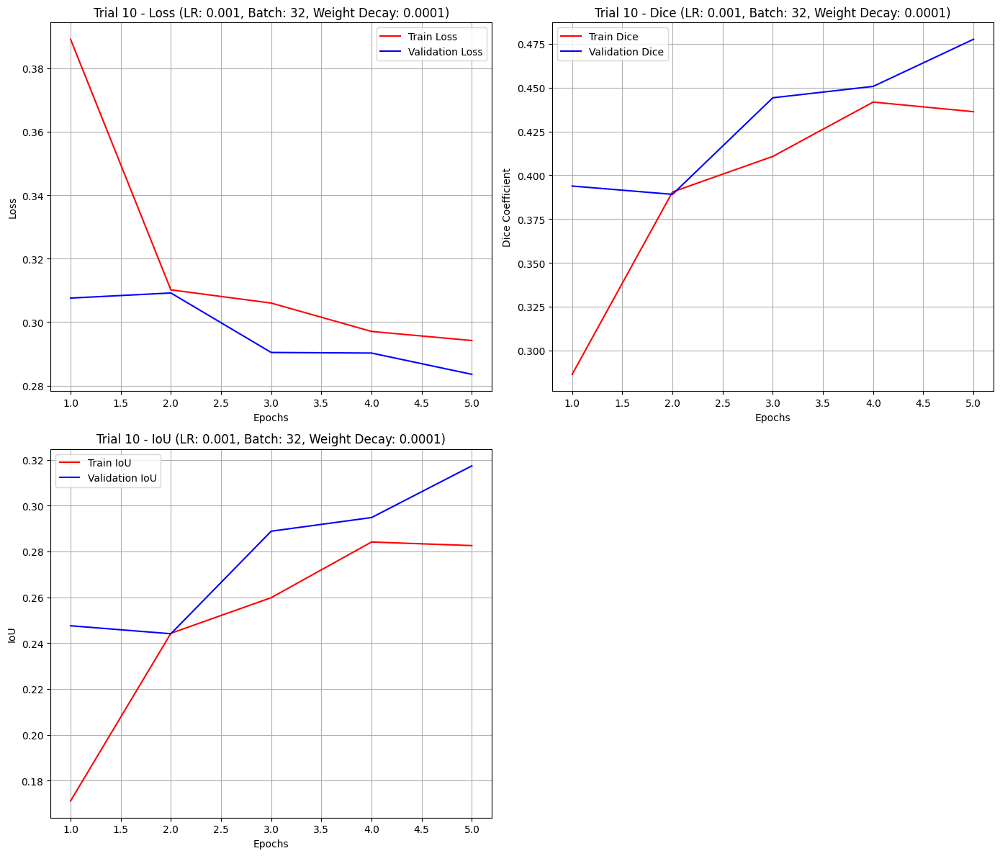

Best validation loss: 0.27874935045838356
Best params: learning rate = 0.001, batch size = 16, weight_decay = 0.001


In [ ]:
# Tuning degli iperparametri
best_params2 = hyperparameter_tuning_pretrained(trainset2, validationset2, criterion2, device)

TESTING...
Final test loss: 0.2858746657004723, Final test Dice: 0.4460, Final test IoU: 0.2946
ALCUNE PREDIZIONI CORRETTE 



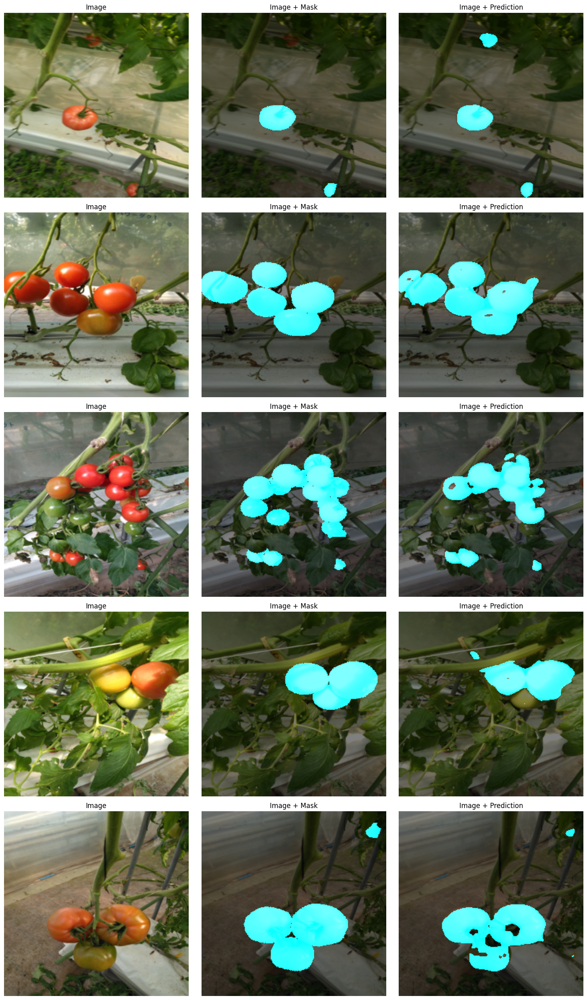

ALCUNE PREDIZIONI ERRATE 



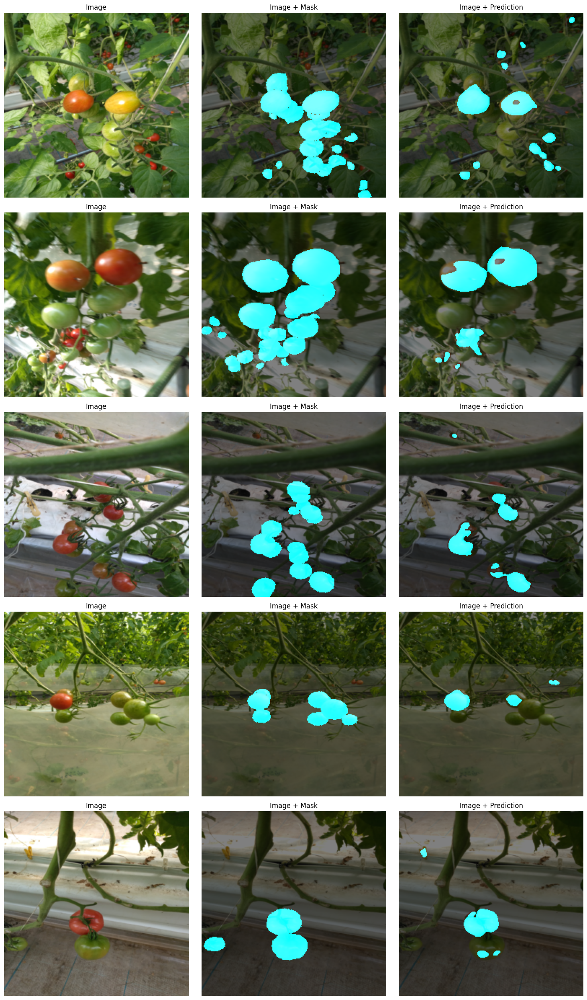

In [38]:
# Caricamento miglior modello e failure analysis
model2 = UNet(in_channels=3, out_channels=1).to(device)
model2.load_state_dict(torch.load('best_model_tomato.pth', weights_only=True))

failure_analysis(model2, criterion2, testset2, best_params2, device)